## PROJECT 5: FEATURE SELECTION, MODEL SELECTION AND TUNING - CREDIT CARD USERS CHURN PREDICTION - Sai K (03/05/2023)

### Description

**Background & Context**

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

You need to identify the best possible model that will give the required performance

**Objective**

* Explore and visualize the dataset.
* Build a classification model to predict if the customer is going to churn or not
* Optimize the model using appropriate techniques
* Generate a set of insights and recommendations that will help the bank

**Data Dictionary:**

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
* Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
* Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
* Avg_Utilization_Ratio: Represents how much of the available credit the customer spent

In [1]:
# Libraries to help with data manipulation, arrays and analysis
import numpy as np
import pandas as pd

# Libaries to help with data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Library to split data
from sklearn.model_selection import train_test_split

# Libraries to tune different models
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

import scipy.stats as stats
from sklearn import metrics
from sklearn import tree

# Libraries for diferent metric scores for regression
from sklearn.metrics import roc_auc_score, roc_curve, make_scorer,precision_recall_curve
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Libraries for diferent metric scores for classifier
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

# Libraries for confusion matrix
from sklearn.metrics import confusion_matrix, plot_confusion_matrix
from sklearn.metrics import classification_report

# To build model for prediction
from sklearn.linear_model import LogisticRegression

# Libraries to build models for classifier - Bagging technique  
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier

# Libraries to build models for classifier - Boosting technique
from sklearn.ensemble import AdaBoostClassifier 
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

# Libraries to build models for regression - Bagging Technique
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor 

# Libraries to build models for regression - Boosting Technique
from sklearn.ensemble import AdaBoostRegressor 
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import StackingRegressor


# To impute missing values
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.preprocessing import OneHotEncoder

import warnings
warnings.filterwarnings('ignore')

pd.set_option("display.float_format", lambda x: "%.3f" % x)  # to restrict the float value to 3 decimal places
pd.set_option("display.max_columns", None)  # Removes the limit from the number of displayed columns and rows.
pd.set_option("display.max_rows", 200)  # pd.set_option('display.max_rows', None)

### Reading the dataset

In [2]:
bankdata = pd.read_csv("C:/Users/OneDrive/Desktop/Python/6_feature_selection_model_selection_and_tuning/project/BankChurners.csv")
data = bankdata.copy()

### Overview of the dataset

**View the first 5 rows of the dataset**

In [3]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [4]:
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


In [5]:
np.random.seed(1)
data.sample(n=10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6498,712389108,Existing Customer,43,F,2,Graduate,Married,Less than $40K,Blue,36,6,3,2,2570.000,2107,463.000,0.651,4058,83,0.766,0.820
9013,718388733,Existing Customer,38,F,1,College,NaN,Less than $40K,Blue,32,2,3,3,2609.000,1259,1350.000,0.871,8677,96,0.627,0.483
2053,710109633,Existing Customer,39,M,2,College,Married,$60K - $80K,Blue,31,6,3,2,9871.000,1061,8810.000,0.545,1683,34,0.478,0.107
3211,717331758,Existing Customer,44,M,4,Graduate,Married,$120K +,Blue,32,6,3,4,34516.000,2517,31999.000,0.765,4228,83,0.596,0.073
5559,709460883,Attrited Customer,38,F,2,Doctorate,Married,Less than $40K,Blue,28,5,2,4,1614.000,0,1614.000,0.609,2437,46,0.438,0.000
6106,789105183,Existing Customer,54,M,3,Post-Graduate,Single,$80K - $120K,Silver,42,3,1,2,34516.000,2488,32028.000,0.552,4401,87,0.776,0.072
4150,771342183,Attrited Customer,53,F,3,Graduate,Single,$40K - $60K,Blue,40,6,3,2,1625.000,0,1625.000,0.689,2314,43,0.433,0.000
2205,708174708,Existing Customer,38,M,4,Graduate,Married,$40K - $60K,Blue,27,6,2,4,5535.000,1276,4259.000,0.636,1764,38,0.900,0.231
4145,718076733,Existing Customer,43,M,1,Graduate,Single,$60K - $80K,Silver,31,4,3,3,25824.000,1170,24654.000,0.684,3101,73,0.780,0.045
5324,821889858,Attrited Customer,50,F,1,Doctorate,Single,abc,Blue,46,6,4,3,1970.000,1477,493.000,0.662,2493,44,0.571,0.750


In [6]:
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns in the data set.")

There are 10127 rows and 21 columns in the data set.


In [7]:
data.drop(["CLIENTNUM"], axis=1, inplace=True)

**Missing values**

In [8]:
data.isnull().sum().sort_values(ascending=False)

Education_Level             1519
Marital_Status               749
Attrition_Flag                 0
Contacts_Count_12_mon          0
Total_Ct_Chng_Q4_Q1            0
Total_Trans_Ct                 0
Total_Trans_Amt                0
Total_Amt_Chng_Q4_Q1           0
Avg_Open_To_Buy                0
Total_Revolving_Bal            0
Credit_Limit                   0
Months_Inactive_12_mon         0
Customer_Age                   0
Total_Relationship_Count       0
Months_on_book                 0
Card_Category                  0
Income_Category                0
Dependent_count                0
Gender                         0
Avg_Utilization_Ratio          0
dtype: int64

**Duplicated values**

In [9]:
data.duplicated().sum()

0

In [10]:
data[data.duplicated()].count()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           8608 non-null   object 
 5   Marital_Status            9378 non-null   object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

**Inferences**

* There are no duplicates

In [12]:
## Converting the data type of categorical features to 'category'
cat_cols = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category"
]
data[cat_cols] = data[cat_cols].astype("category")

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   Attrition_Flag            10127 non-null  object  
 1   Customer_Age              10127 non-null  int64   
 2   Gender                    10127 non-null  category
 3   Dependent_count           10127 non-null  int64   
 4   Education_Level           8608 non-null   category
 5   Marital_Status            9378 non-null   category
 6   Income_Category           10127 non-null  category
 7   Card_Category             10127 non-null  category
 8   Months_on_book            10127 non-null  int64   
 9   Total_Relationship_Count  10127 non-null  int64   
 10  Months_Inactive_12_mon    10127 non-null  int64   
 11  Contacts_Count_12_mon     10127 non-null  int64   
 12  Credit_Limit              10127 non-null  float64 
 13  Total_Revolving_Bal       10127 non-null  int6

In [14]:
for i in cat_cols:
    print("Unique values in", i, "are :")
    print(data[i].value_counts(dropna=False))
    print("*" * 50)
    print(data[i].value_counts(1)*100)
    print("*" * 50)

Unique values in Gender are :
F    5358
M    4769
Name: Gender, dtype: int64
**************************************************
F   52.908
M   47.092
Name: Gender, dtype: float64
**************************************************
Unique values in Education_Level are :
Graduate         3128
High School      2013
NaN              1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
**************************************************
Graduate        36.338
High School     23.385
Uneducated      17.275
College         11.768
Post-Graduate    5.994
Doctorate        5.239
Name: Education_Level, dtype: float64
**************************************************
Unique values in Marital_Status are :
Married     4687
Single      3943
NaN          749
Divorced     748
Name: Marital_Status, dtype: int64
**************************************************
Married    49.979
Single     42.045
Divorced    7.976
Name: Marital_Sta

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000
Total_Amt_Chng_Q4_Q1,10127.000,0.760,0.219,0.000,0.631,0.736,0.859,3.397


## Exploratory Data Analysis (EDA)

**Functions to carry out the Exploratory Data Analysis**

In [16]:
def histogram_boxplot(data, feature, figsize=(12, 7), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to show the density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [17]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 2, 6))
    else:
        plt.figure(figsize=(n + 2, 6))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

In [18]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

In [19]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

### Univariate Analysis

**Attrition_Flag** Int64

In [20]:
#histogram_boxplot(data, "Attrition_Flag")

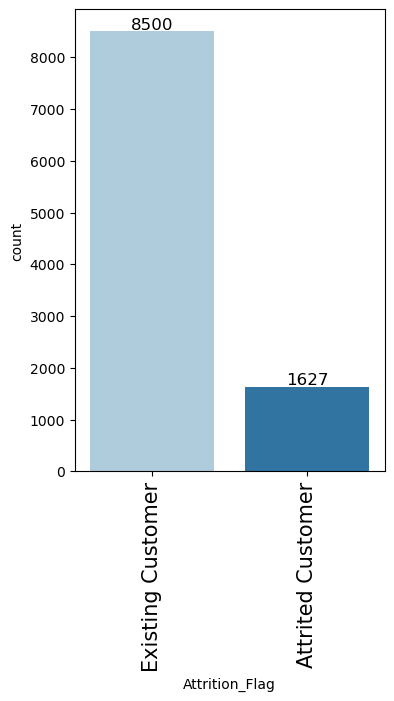

In [21]:
labeled_barplot(data, 'Attrition_Flag')

**Customer Age** Int64

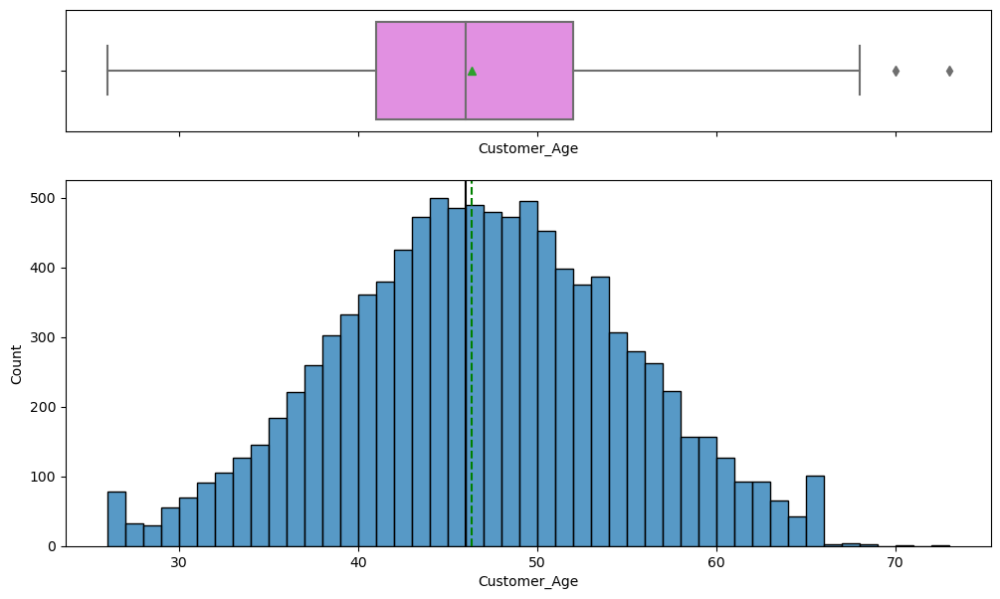

In [22]:
histogram_boxplot(data, "Customer_Age")

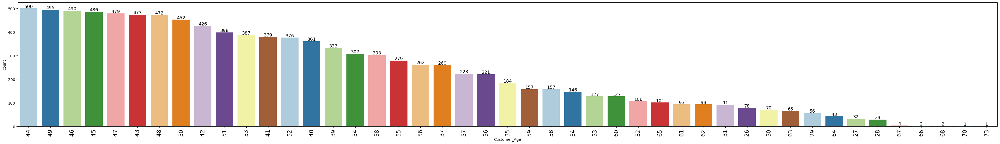

In [23]:
labeled_barplot(data, 'Customer_Age')

**Gender** Category

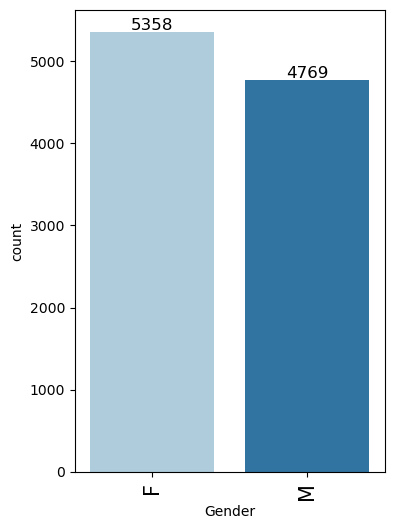

In [24]:
labeled_barplot(data, 'Gender')

**Dependent_count** Int64

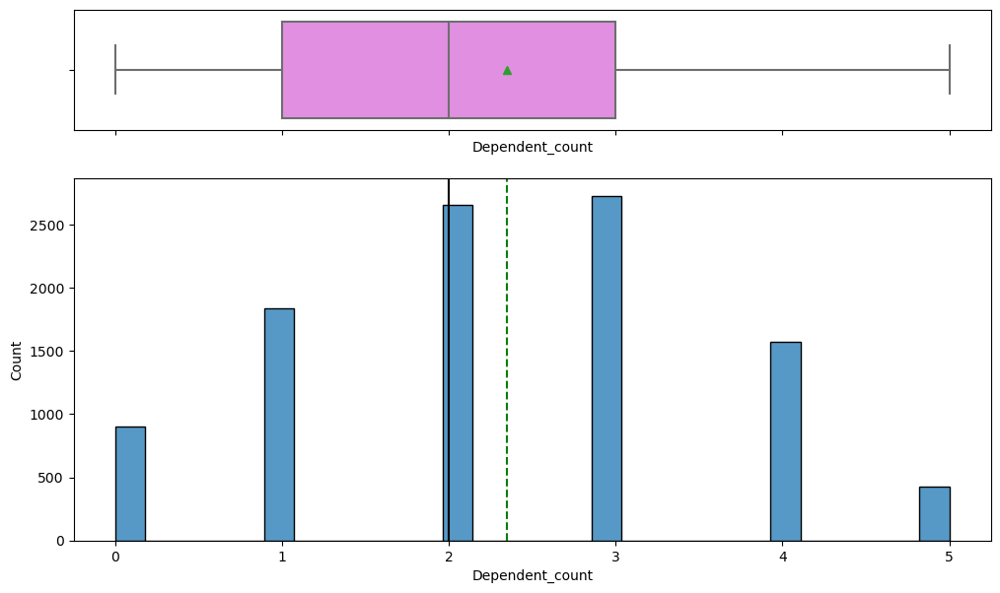

In [25]:
histogram_boxplot(data, "Dependent_count")

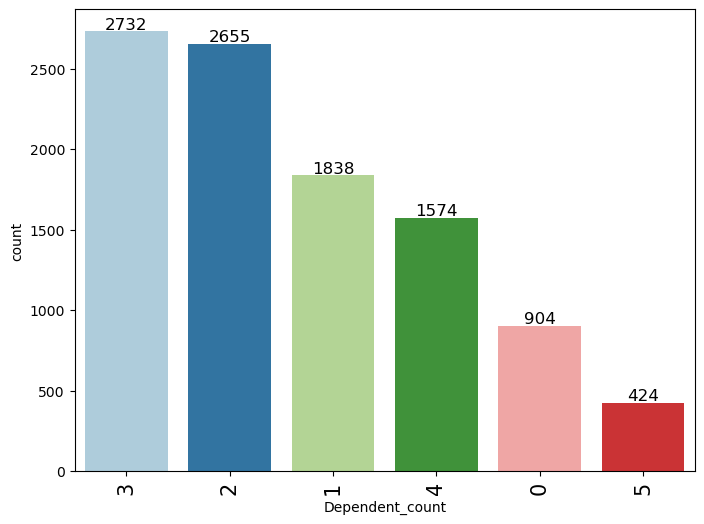

In [26]:
labeled_barplot(data, 'Dependent_count')

**Education_Level**

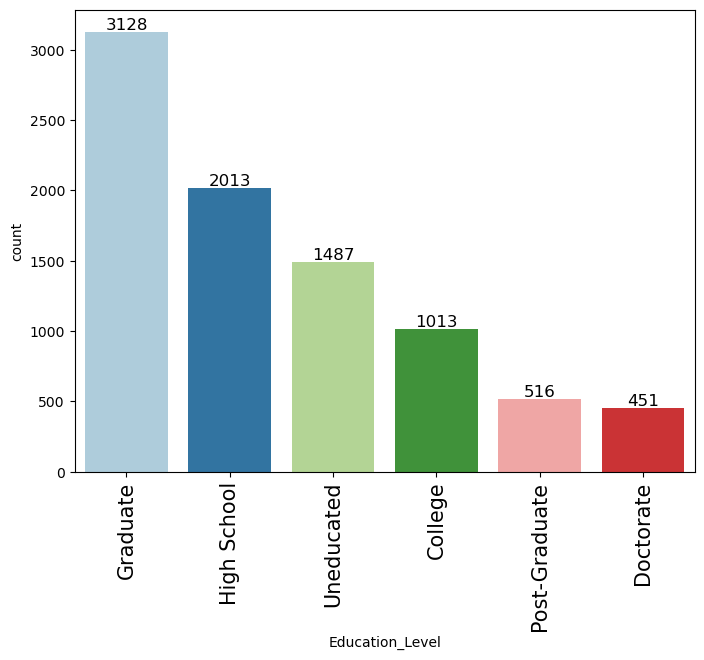

In [27]:
labeled_barplot(data, 'Education_Level')

**Marital_Status** Categorical

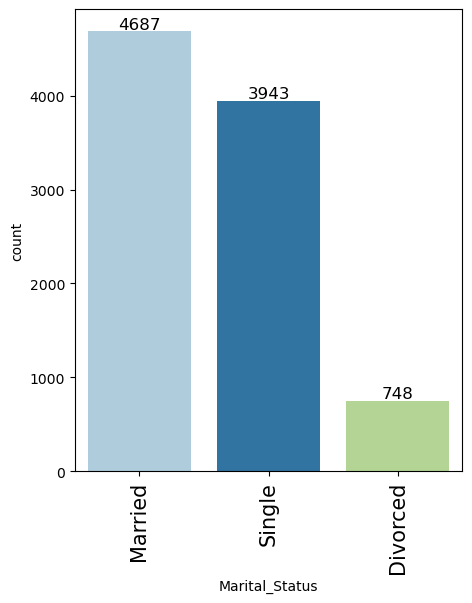

In [28]:
labeled_barplot(data, 'Marital_Status')

**Income_Category** Categorical

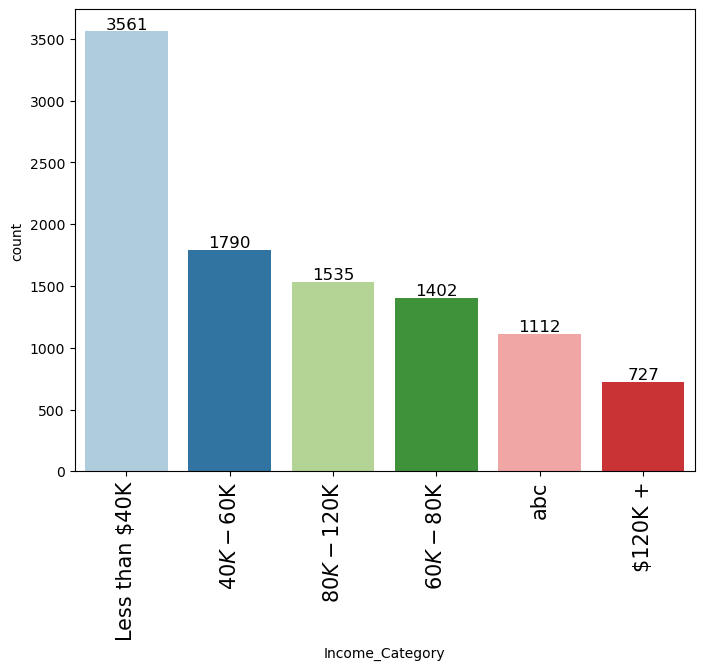

In [29]:
labeled_barplot(data, 'Income_Category')

**Card_Category** Categorical variable

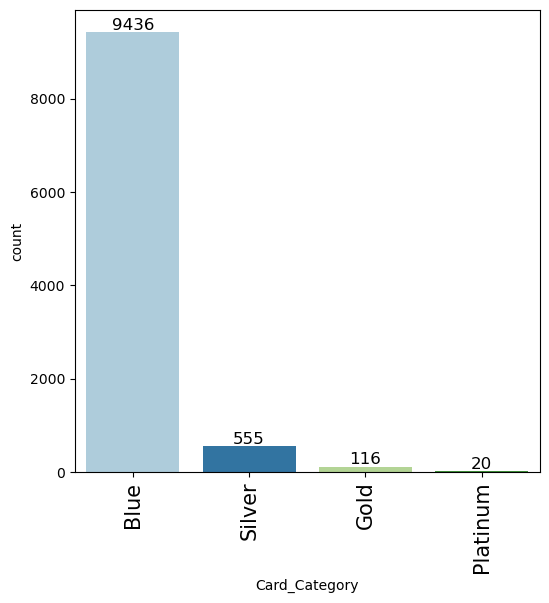

In [30]:
labeled_barplot(data, 'Card_Category')

**Months_on_book** Numerical variable

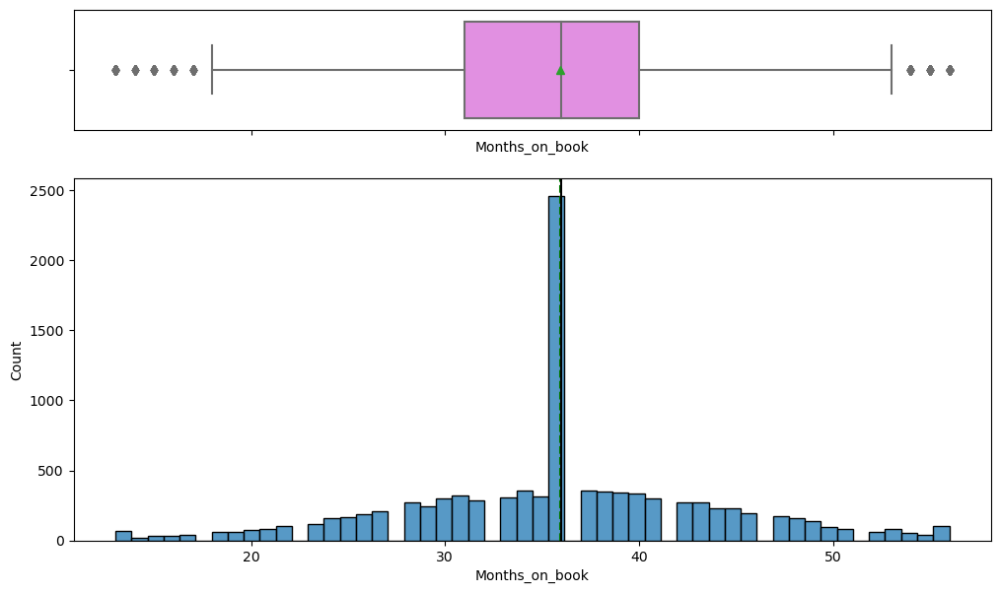

In [31]:
histogram_boxplot(data, "Months_on_book")

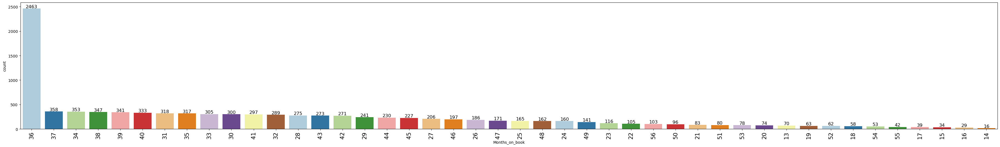

In [32]:
labeled_barplot(data, 'Months_on_book')

**Total_Relationship_Count** Numerical variable

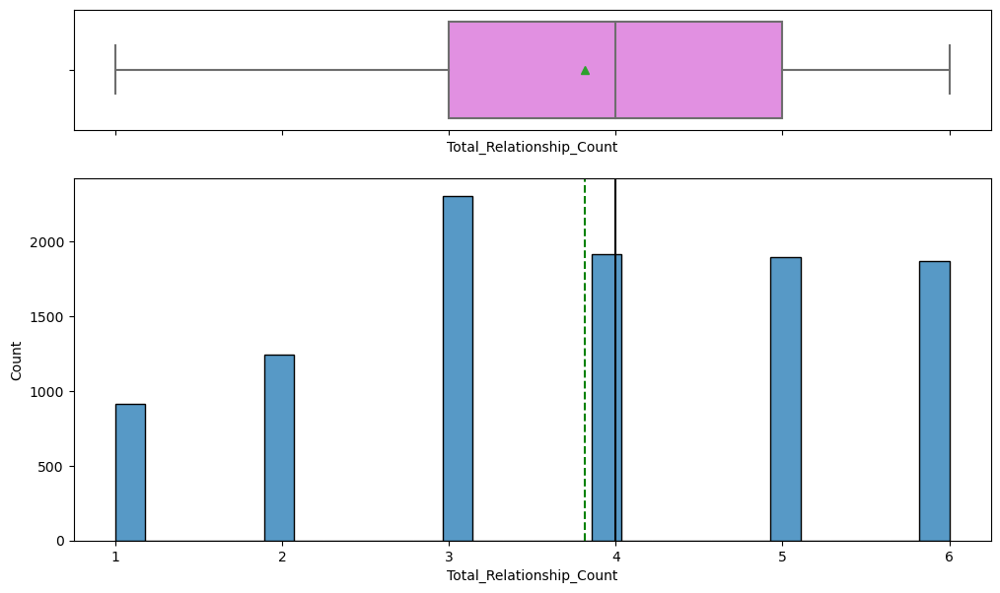

In [33]:
histogram_boxplot(data, "Total_Relationship_Count")

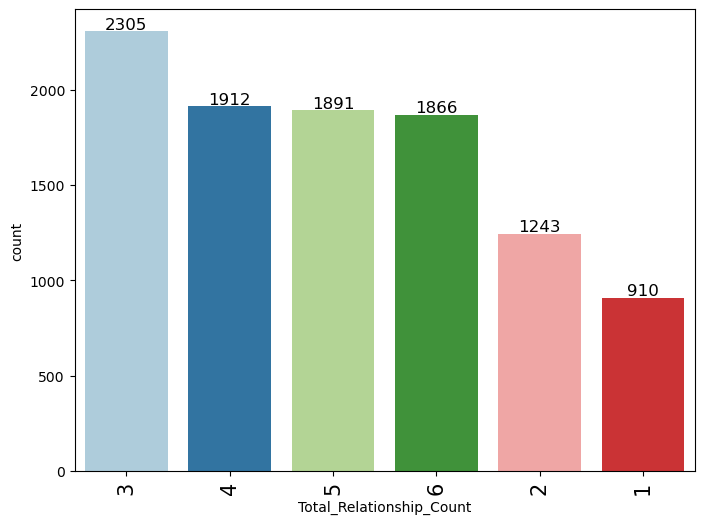

In [34]:
labeled_barplot(data, 'Total_Relationship_Count')

**Months_Inactive_12_mon** Numerical variable

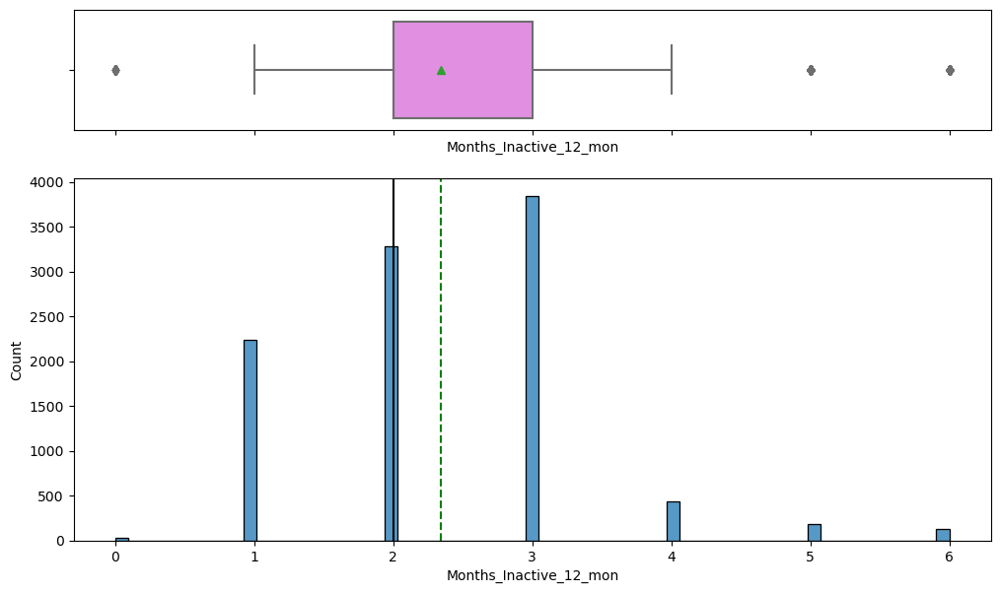

In [35]:
histogram_boxplot(data, "Months_Inactive_12_mon")

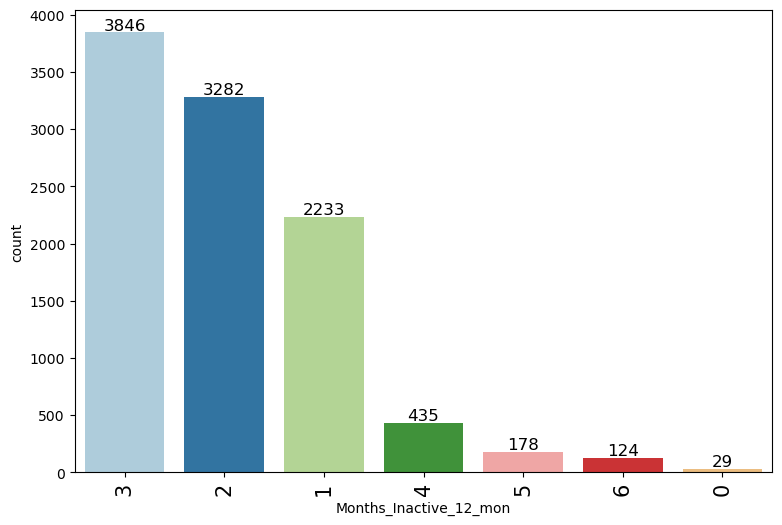

In [36]:
labeled_barplot(data, 'Months_Inactive_12_mon')

**Contacts_Count_12_mon** Numerical variable

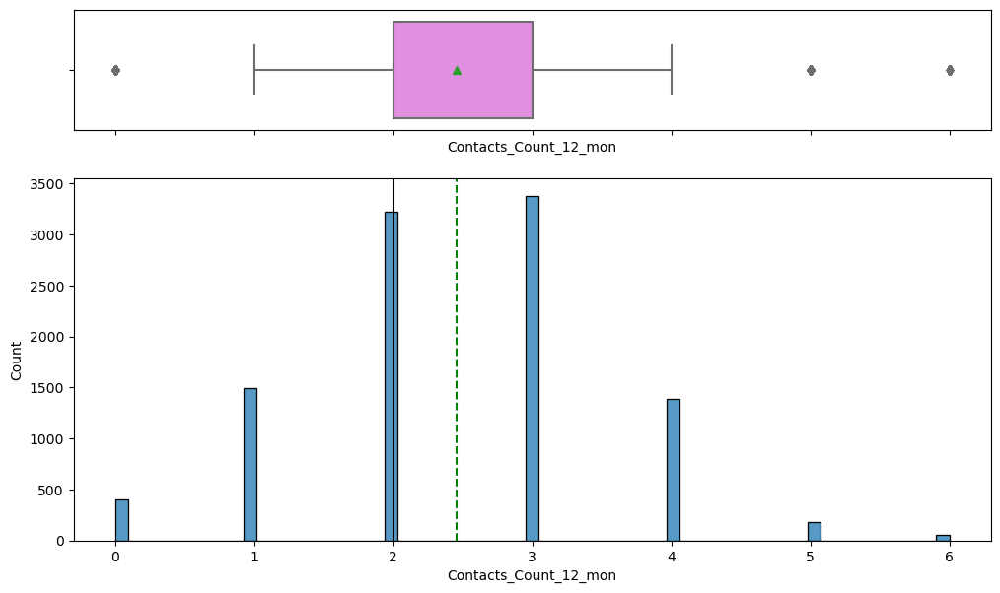

In [37]:
histogram_boxplot(data, "Contacts_Count_12_mon")

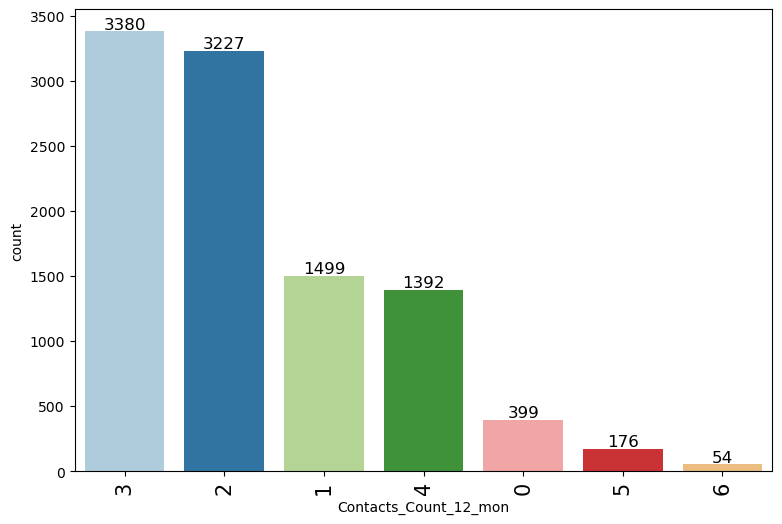

In [38]:
labeled_barplot(data, 'Contacts_Count_12_mon')

**Credit_Limit** Numerical variable

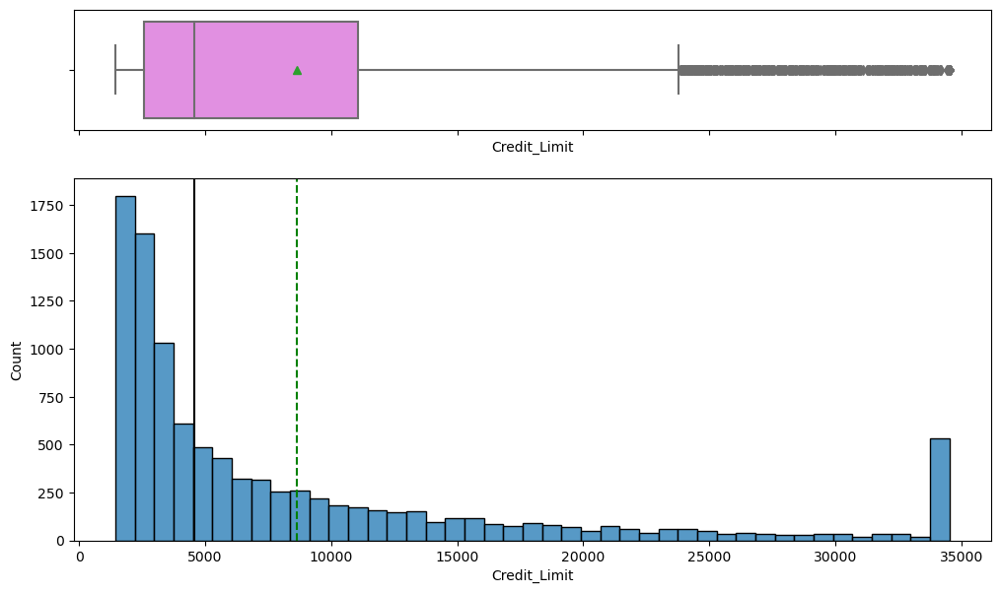

In [39]:
histogram_boxplot(data, "Credit_Limit")

**Total_Revolving_Bal** Numerical variable

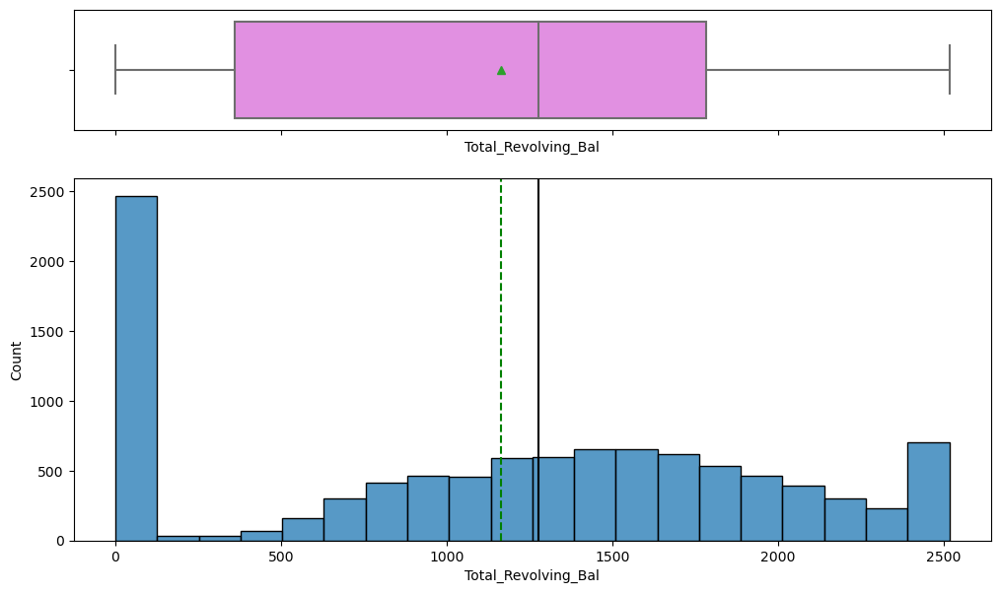

In [40]:
histogram_boxplot(data, "Total_Revolving_Bal")

**Avg_Open_To_Buy** Numerical variable

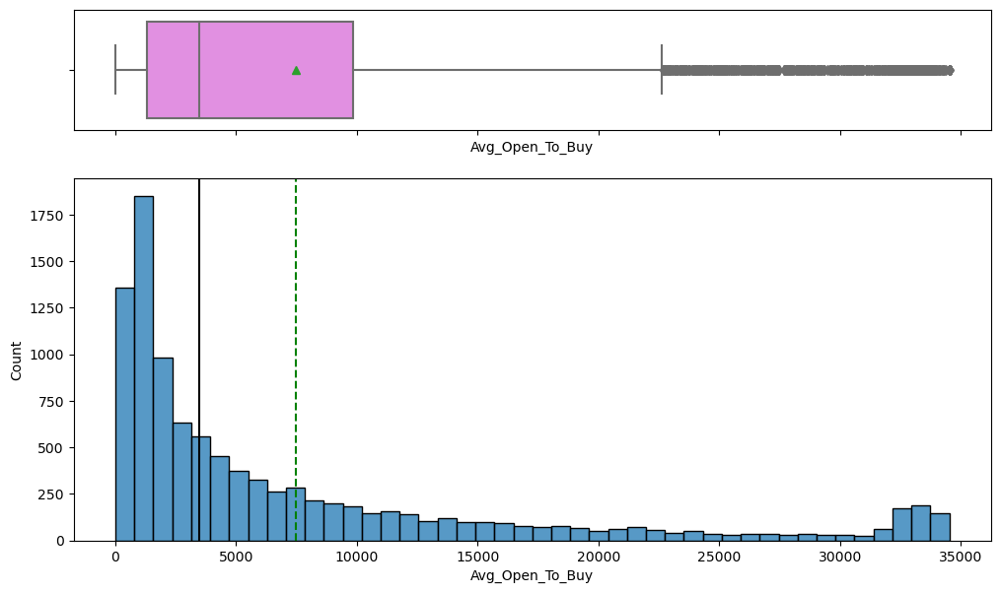

In [41]:
histogram_boxplot(data, "Avg_Open_To_Buy")

In [42]:
#labeled_barplot(data, 'Avg_Open_To_Buy')

**Total_Amt_Chng_Q4_Q1** Numerical variable

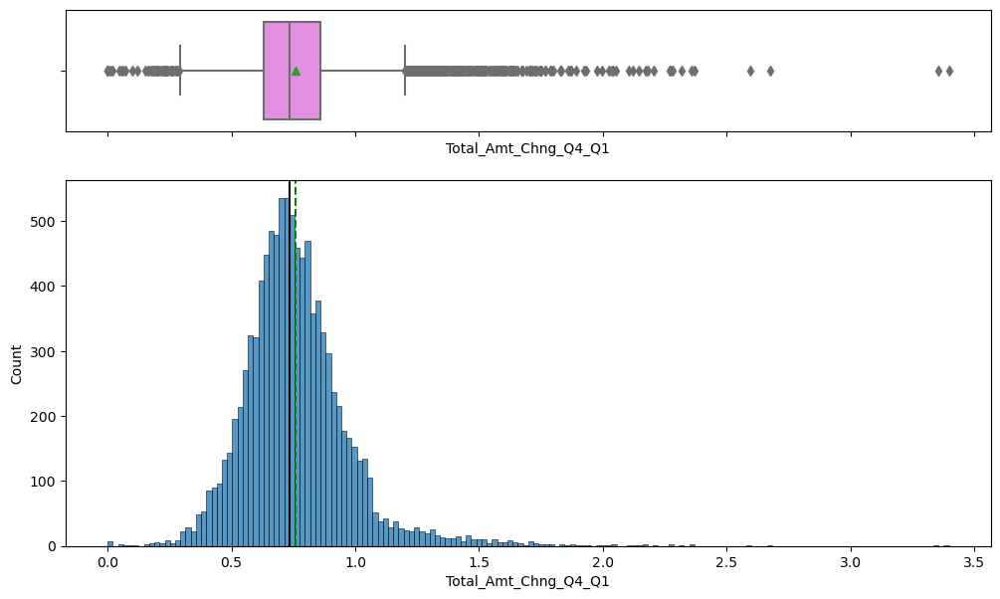

In [43]:
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1")

In [44]:
#labeled_barplot(data, 'Total_Amt_Chng_Q4_Q1')

**Total_Trans_Amt** Numerical variable

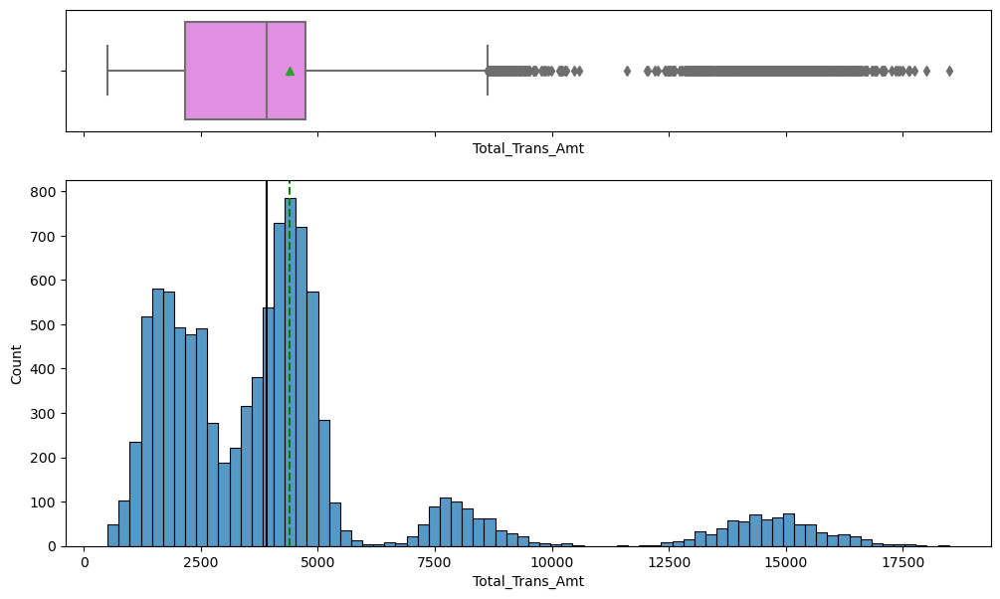

In [45]:
histogram_boxplot(data, "Total_Trans_Amt")

**Total_Trans_Ct** Numerical variable

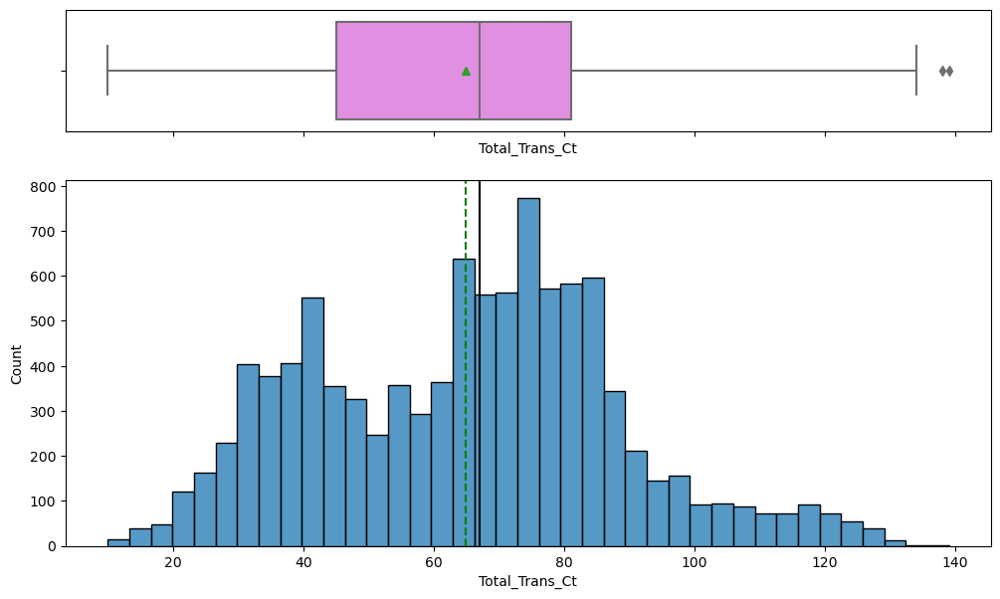

In [46]:
histogram_boxplot(data, "Total_Trans_Ct")

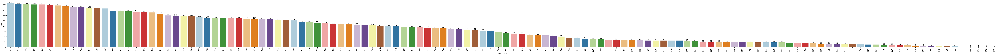

In [47]:
labeled_barplot(data, 'Total_Trans_Ct')

**Total_Ct_Chng_Q4_Q1** Numerical variable

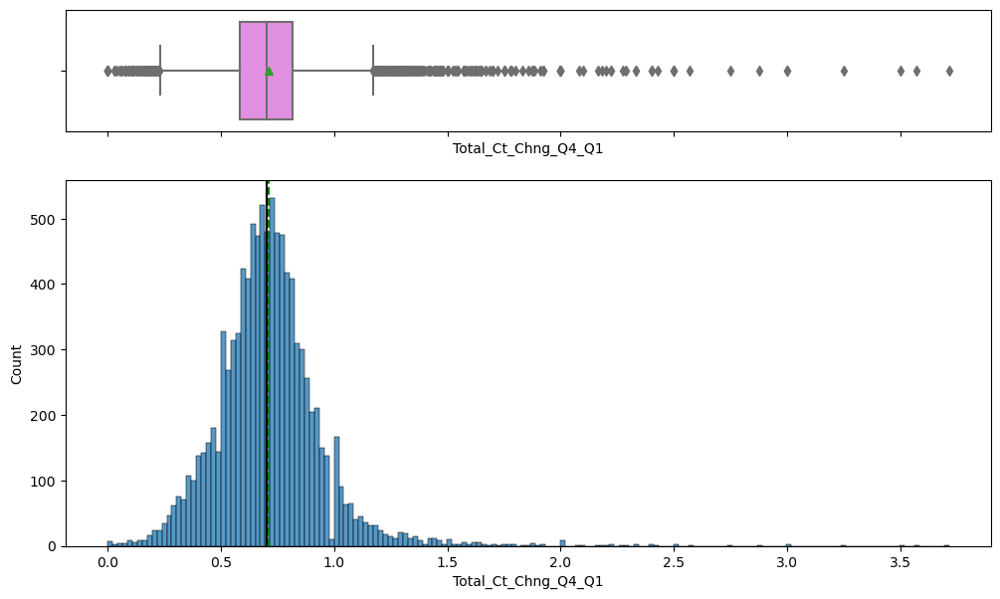

In [48]:
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1")

**Avg_Utilization_Ratio** Numerical variable

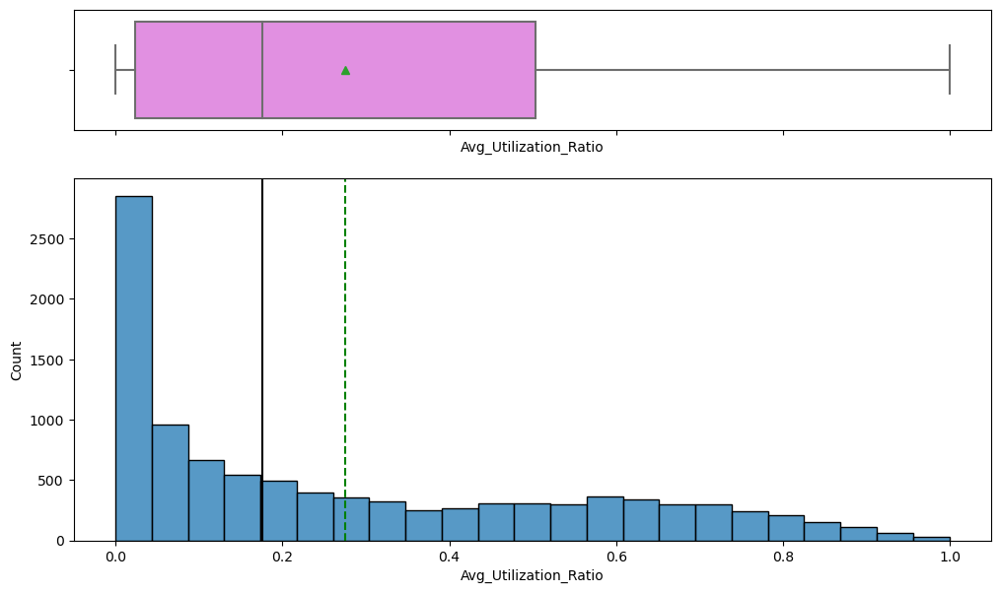

In [49]:
histogram_boxplot(data, "Avg_Utilization_Ratio")

**Inferences**

* The majority of customers are graduates, with 31% of them holding a graduate degree.
* The data is highly imbalanced, with an 84:16 ratio of existing to attrited customers.
* Almost 90% of customers have a Blue Card.
* Customer data is almost equally distributed between males and females.
* The majority of customers are either single or married, with 46.7% being married.
* 35% of customers earn less than 40K, while 36% earn 60K.
* Attrited customers have lower total transaction amounts, lower transaction counts, lower utilization ratios, and a change in transaction count from Q4 to Q1.
* The bank contacts attrited customers more frequently.
* Gender, education, marital status, and income category do not seem to be related to attrition.
* Platinum cardholders may have a higher tendency towards attrition, but with only 20 data points, this observation may be biased.
* Customer age is normally distributed, with most customers aged between 40 and 60.
* The proportion of customers by gender is almost comparable, but females own more credit cards than males.
* Married customers tend to have more credit cards.
* The proportion of education level for both genders is concentrated on the graduate level, followed by post-graduate level.
* A high proportion of attrited customers are married (43.6%), followed by single (41.1%).
* The proportion of income categories for both existing and attrited customers is highly concentrated around the 60K-80K income range.



### Bivariate analysis

**Customer_Age vs Attrition_Flag**

Attrition_Flag  Attrited Customer  Existing Customer    All
Customer_Age                                               
All                          1627               8500  10127
43                             85                388    473
48                             85                387    472
44                             84                416    500
46                             82                408    490
45                             79                407    486
49                             79                416    495
47                             76                403    479
41                             76                303    379
50                             71                381    452
54                             69                238    307
40                             64                297    361
42                             62                364    426
53                             59                328    387
52                             58       

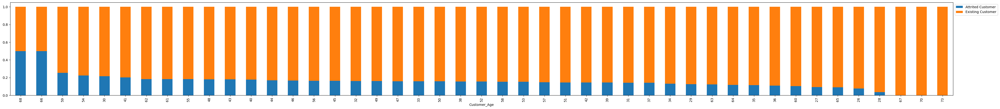

In [50]:
stacked_barplot(data, "Customer_Age", "Attrition_Flag")

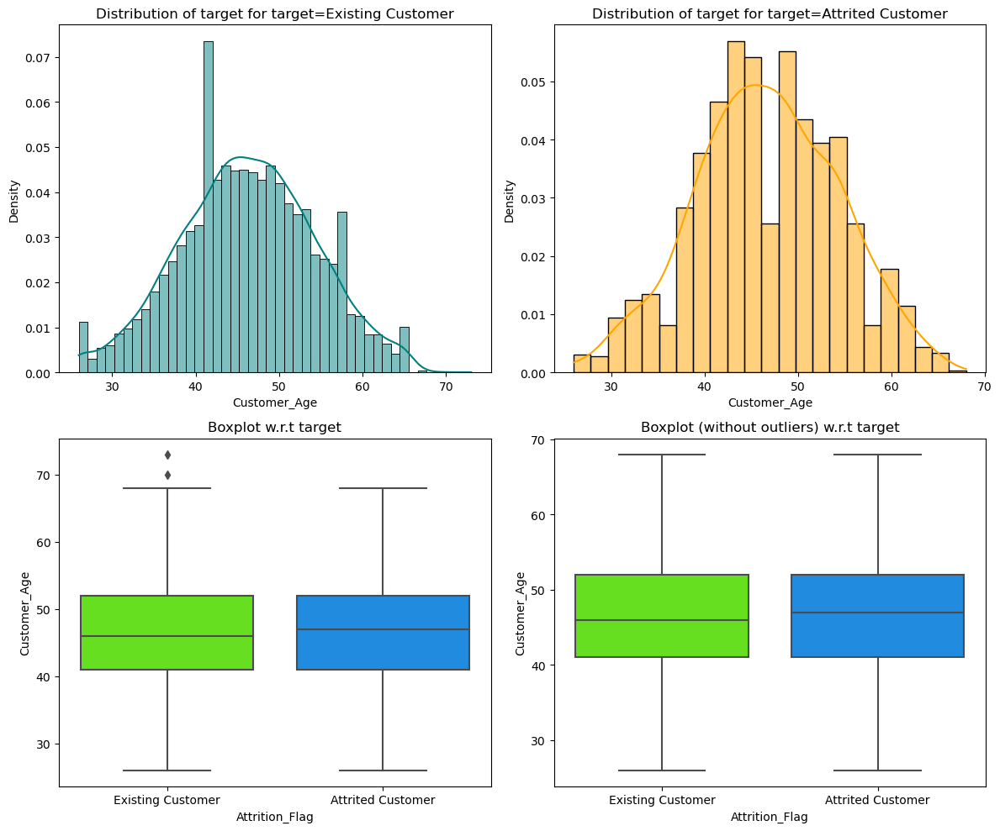

In [51]:
distribution_plot_wrt_target(data, "Customer_Age", "Attrition_Flag")

**Gender vs Attrition Flag**

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


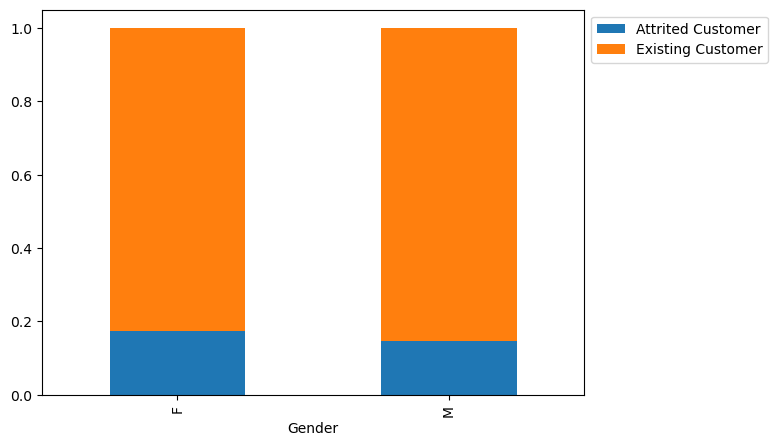

In [52]:
stacked_barplot(data, "Gender", "Attrition_Flag")

**Dependent_count vs Attrition_Flag**

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


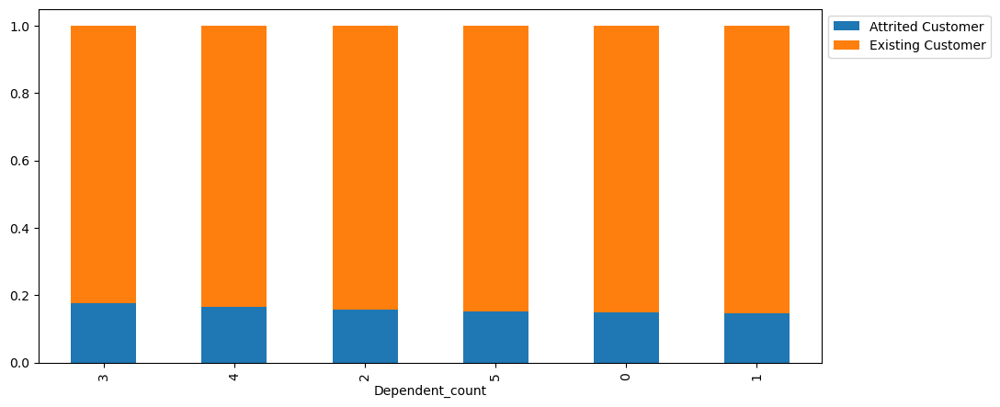

In [53]:
stacked_barplot(data, "Dependent_count", "Attrition_Flag")

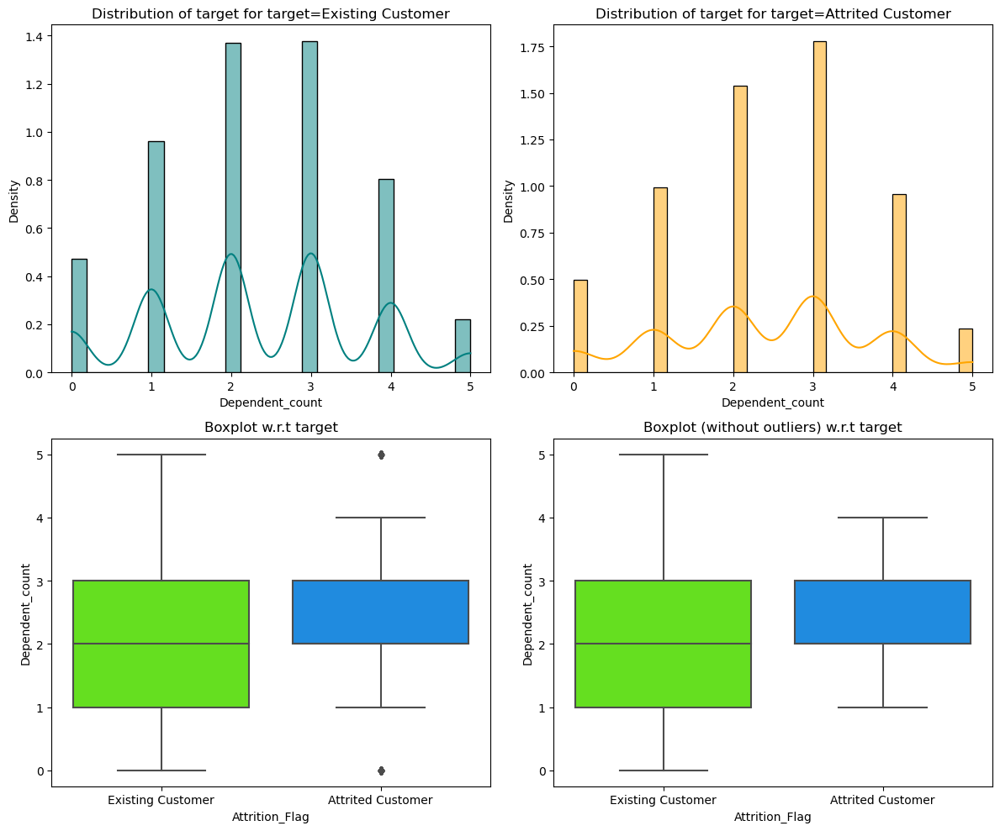

In [54]:
distribution_plot_wrt_target(data, "Dependent_count", "Attrition_Flag")

**Education_Level vs Attrition_Flag**

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


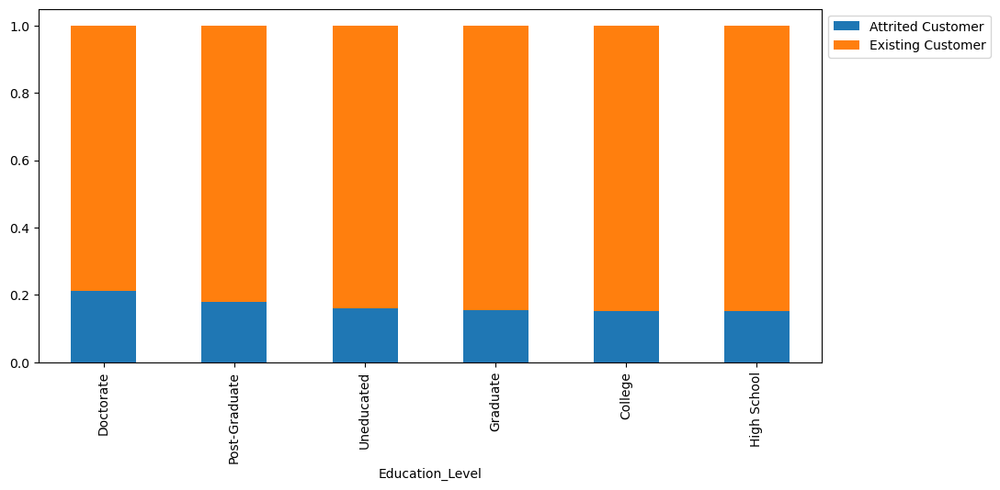

In [55]:
stacked_barplot(data, "Education_Level", "Attrition_Flag")

In [56]:
#distribution_plot_wrt_target(data, "Education_Level", "Attrition_Flag")

**Marital_Status vs Attrition_Flag**

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


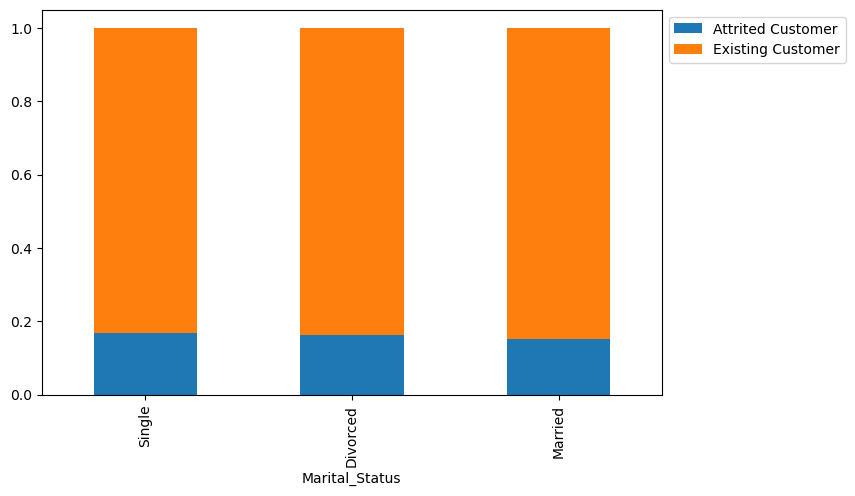

In [57]:
stacked_barplot(data, "Marital_Status", "Attrition_Flag")

In [58]:
#distribution_plot_wrt_target(data, "Marital_Status", "Attrition_Flag")

**Income_Category vs Attrition_Flag**

Attrition_Flag   Attrited Customer  Existing Customer    All
Income_Category                                             
All                           1627               8500  10127
Less than $40K                 612               2949   3561
$40K - $60K                    271               1519   1790
$80K - $120K                   242               1293   1535
$60K - $80K                    189               1213   1402
abc                            187                925   1112
$120K +                        126                601    727
------------------------------------------------------------------------------------------------------------------------


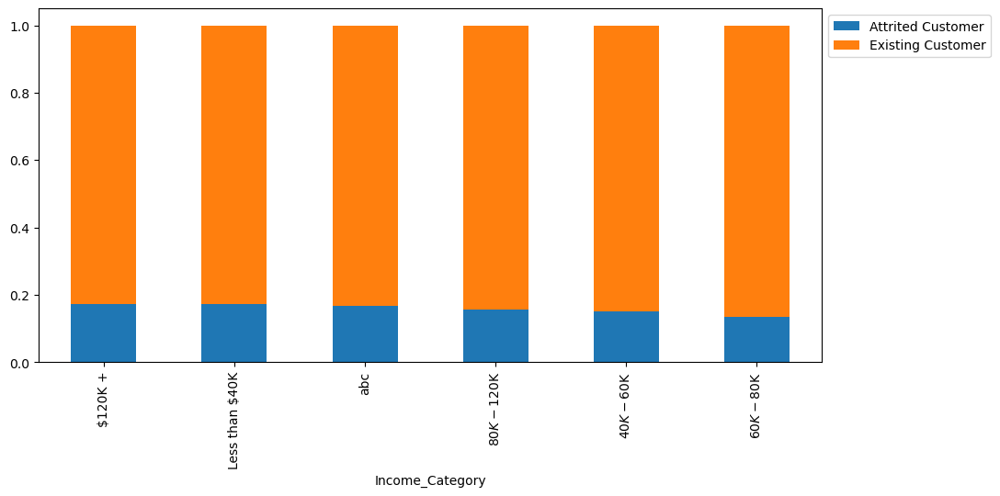

In [59]:
stacked_barplot(data, "Income_Category", "Attrition_Flag")

In [60]:
#distribution_plot_wrt_target(data, "Income_Category", "Attrition_Flag")

**Card_Category vs Attrition_Flag**

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


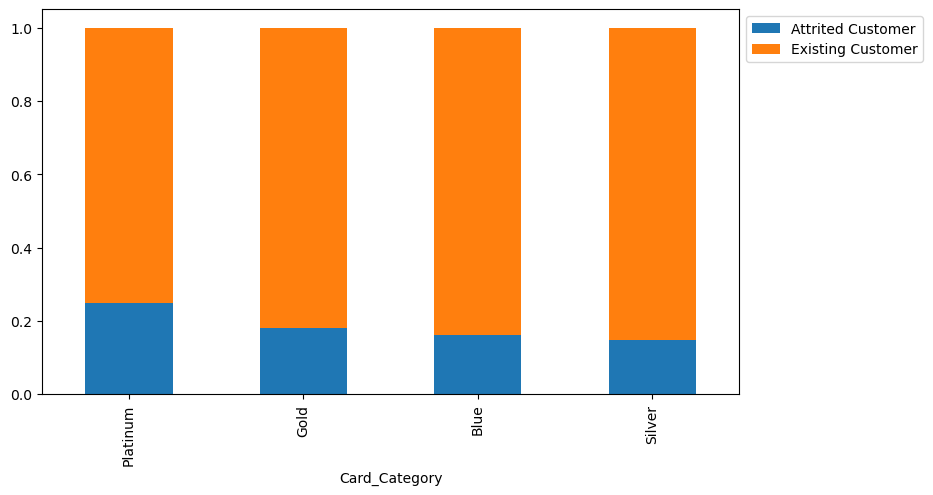

In [61]:
stacked_barplot(data, "Card_Category", "Attrition_Flag")

In [62]:
#distribution_plot_wrt_target(data, "Card_Category", "Attrition_Flag")

**Months_on_book vs Attrition_Flag**

Attrition_Flag  Attrited Customer  Existing Customer    All
Months_on_book                                             
All                          1627               8500  10127
36                            430               2033   2463
39                             64                277    341
37                             62                296    358
30                             58                242    300
38                             57                290    347
34                             57                296    353
41                             51                246    297
33                             48                257    305
40                             45                288    333
35                             45                272    317
32                             44                245    289
28                             43                232    275
44                             42                188    230
43                             42       

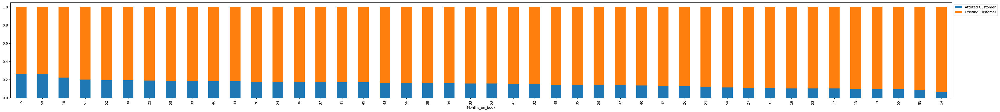

In [63]:
stacked_barplot(data, "Months_on_book", "Attrition_Flag")

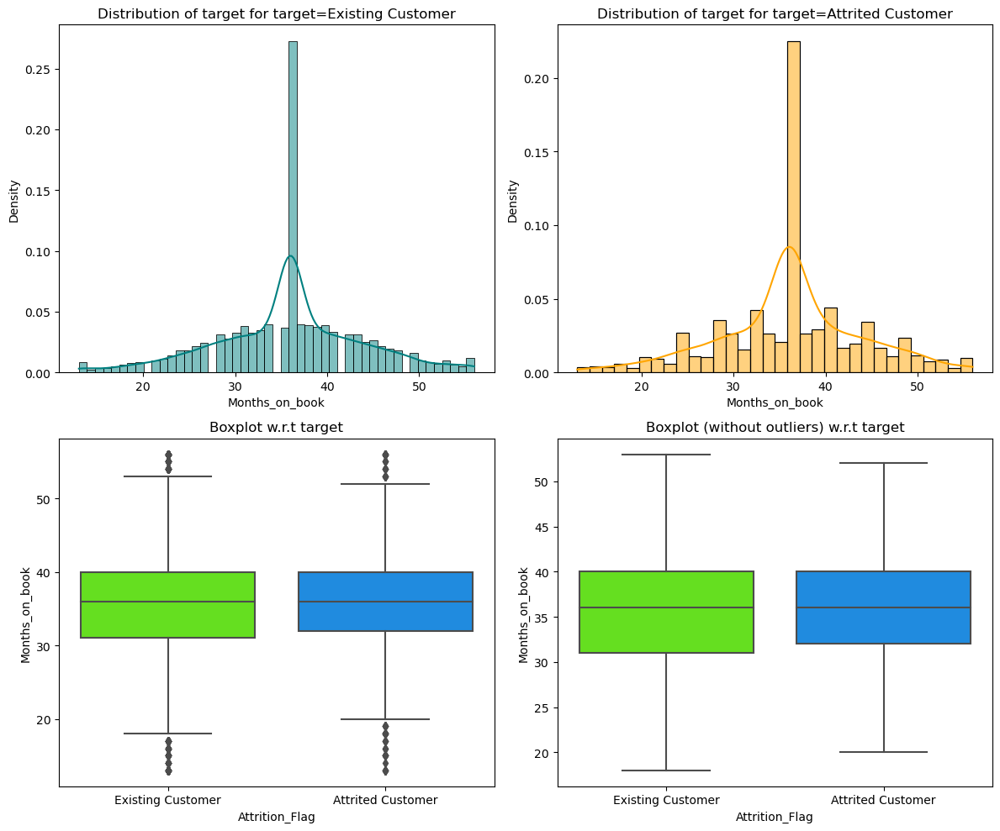

In [64]:
distribution_plot_wrt_target(data, "Months_on_book", "Attrition_Flag")

**Total_Relationship_Count vs Attrition_Flag**

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


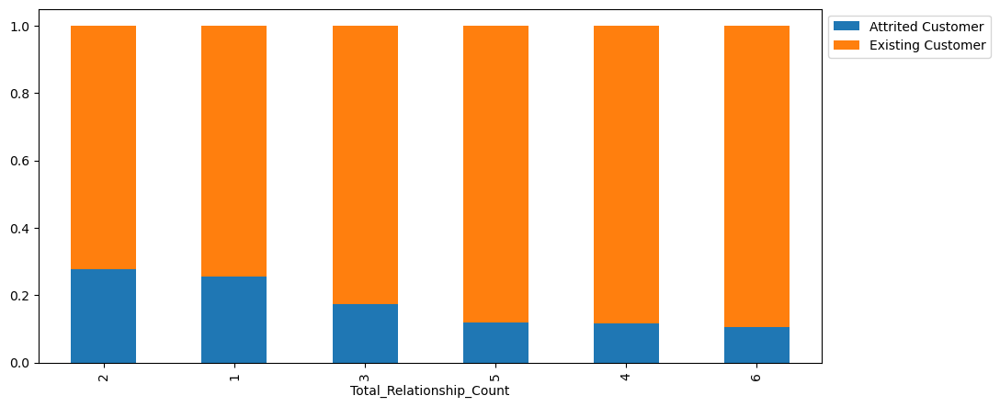

In [65]:
stacked_barplot(data, "Total_Relationship_Count", "Attrition_Flag")

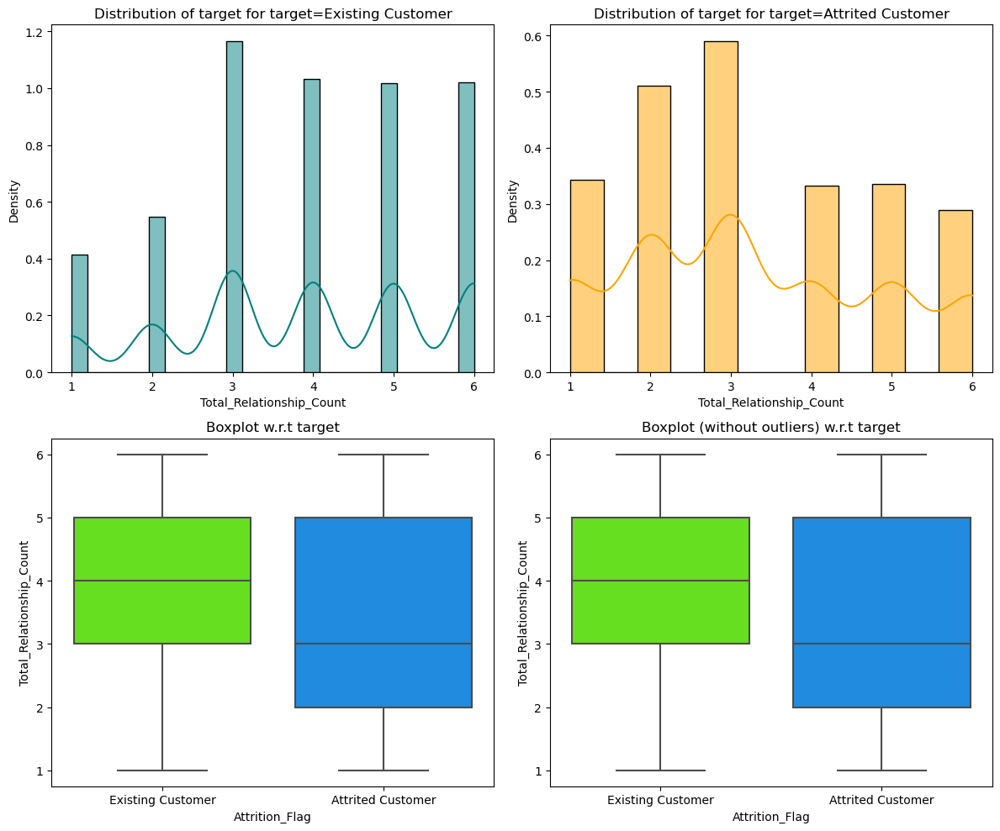

In [66]:
distribution_plot_wrt_target(data, "Total_Relationship_Count", "Attrition_Flag")

**Months_Inactive_12_mon vs Attrition_Flag**

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


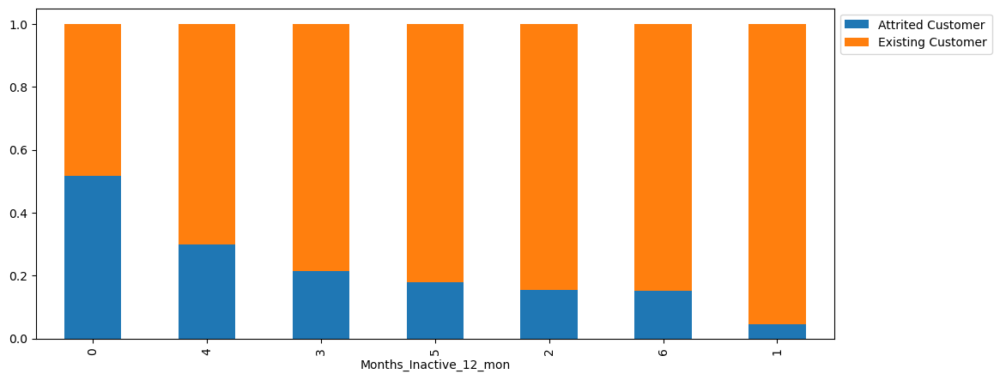

In [67]:
stacked_barplot(data, "Months_Inactive_12_mon", "Attrition_Flag")

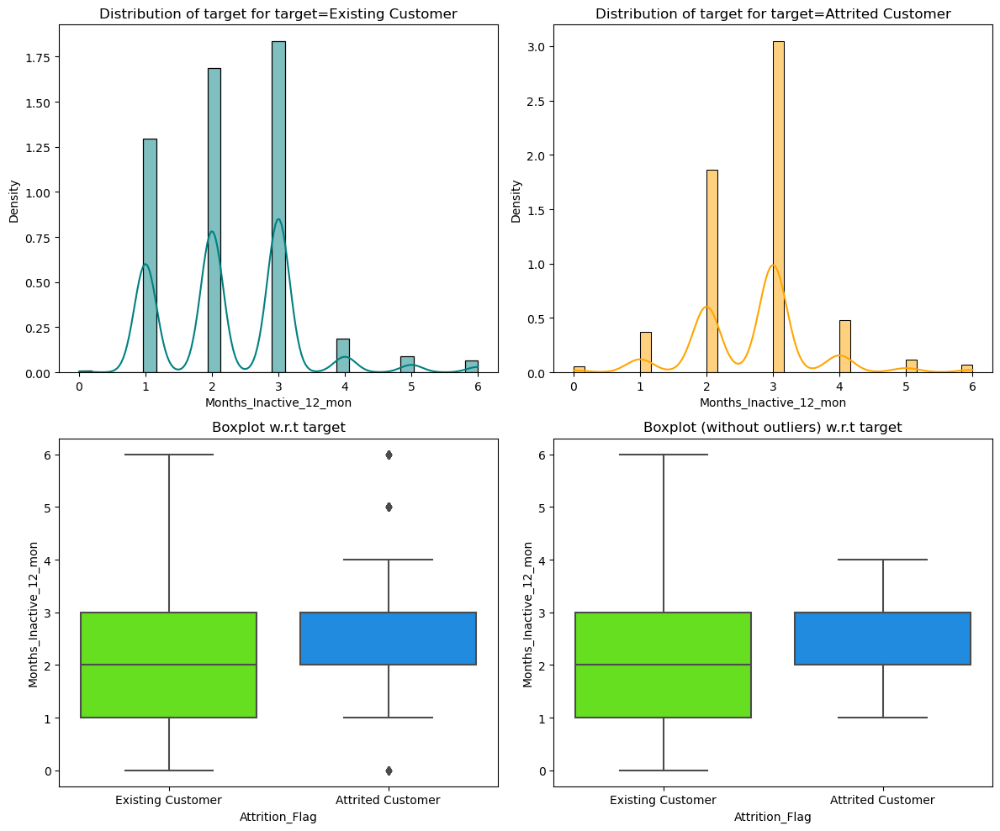

In [68]:
distribution_plot_wrt_target(data, "Months_Inactive_12_mon", "Attrition_Flag")

**Card_Category vs Attrition_Flag**

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


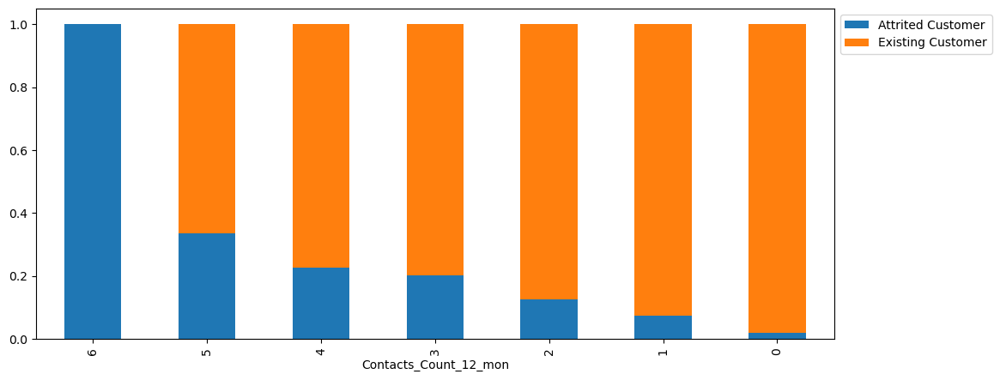

In [69]:
stacked_barplot(data, "Contacts_Count_12_mon", "Attrition_Flag")

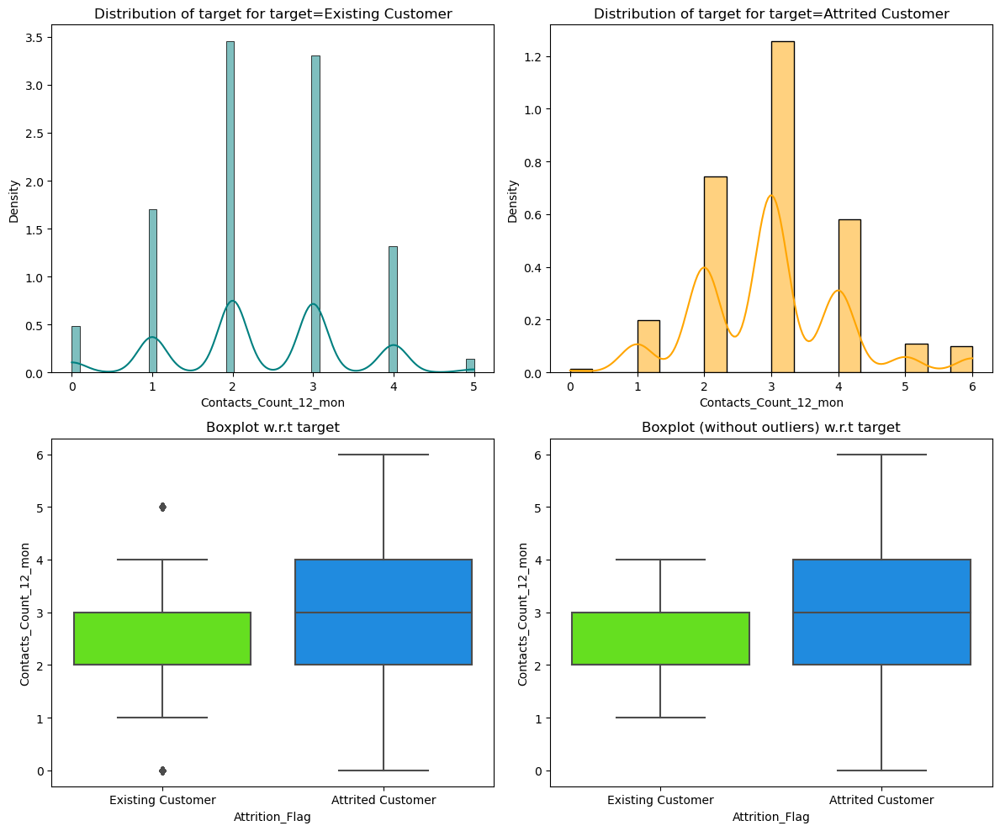

In [70]:
distribution_plot_wrt_target(data, "Contacts_Count_12_mon", "Attrition_Flag")

**Credit_Limit vs Attrition_Flag**

In [71]:
#stacked_barplot(data, "Credit_Limit", "Attrition_Flag")

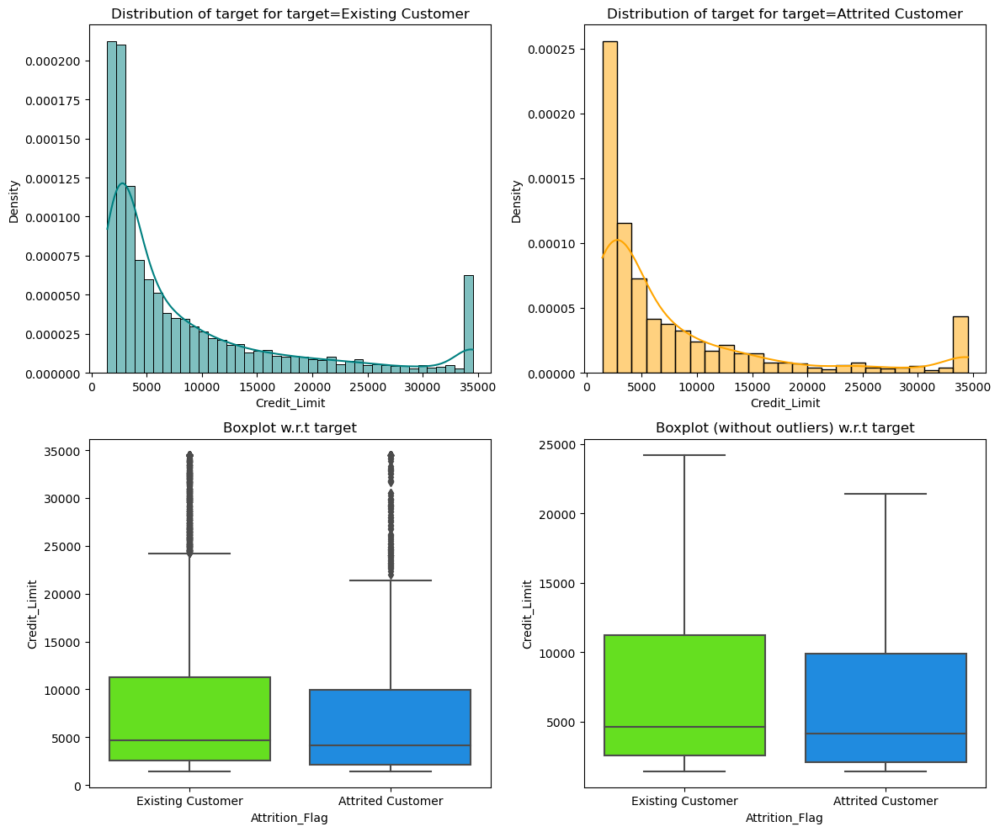

In [72]:
distribution_plot_wrt_target(data, "Credit_Limit", "Attrition_Flag")

**Total_Revolving_Bal vs Attrition_Flag**

In [73]:
#stacked_barplot(data, "Total_Revolving_Bal", "Attrition_Flag")

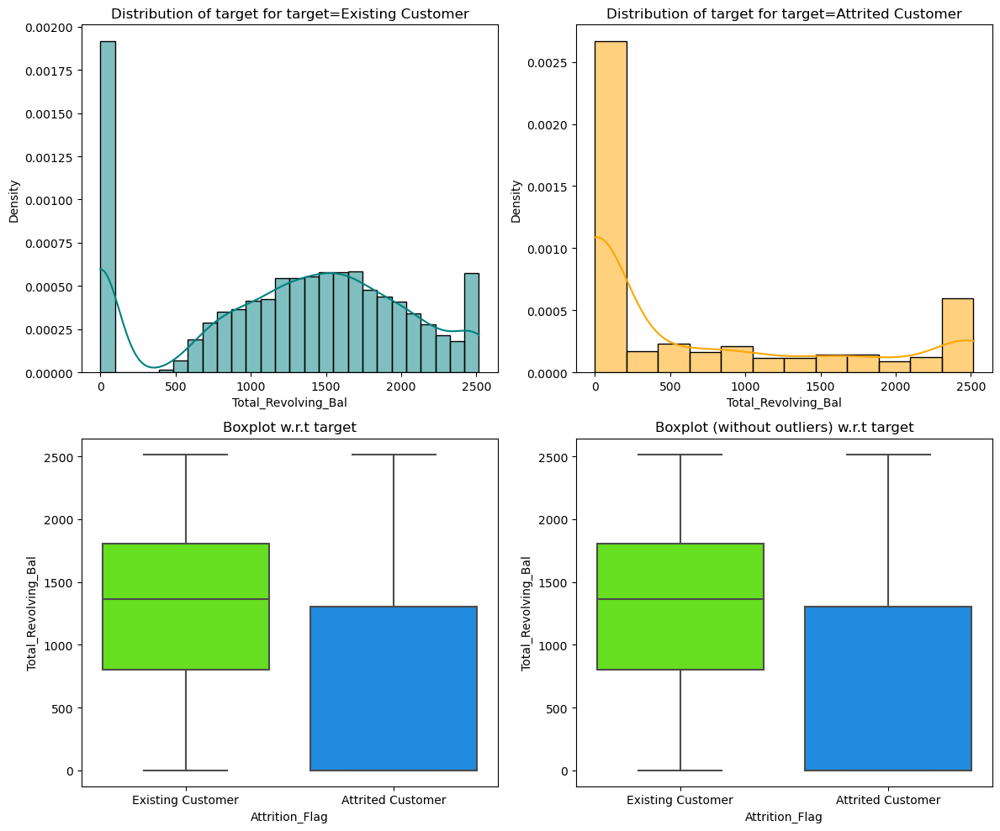

In [74]:
distribution_plot_wrt_target(data, "Total_Revolving_Bal", "Attrition_Flag")

**Avg_Open_To_Buy vs Attrition_Flag**

In [75]:
#stacked_barplot(data, "Avg_Open_To_Buy", "Attrition_Flag")

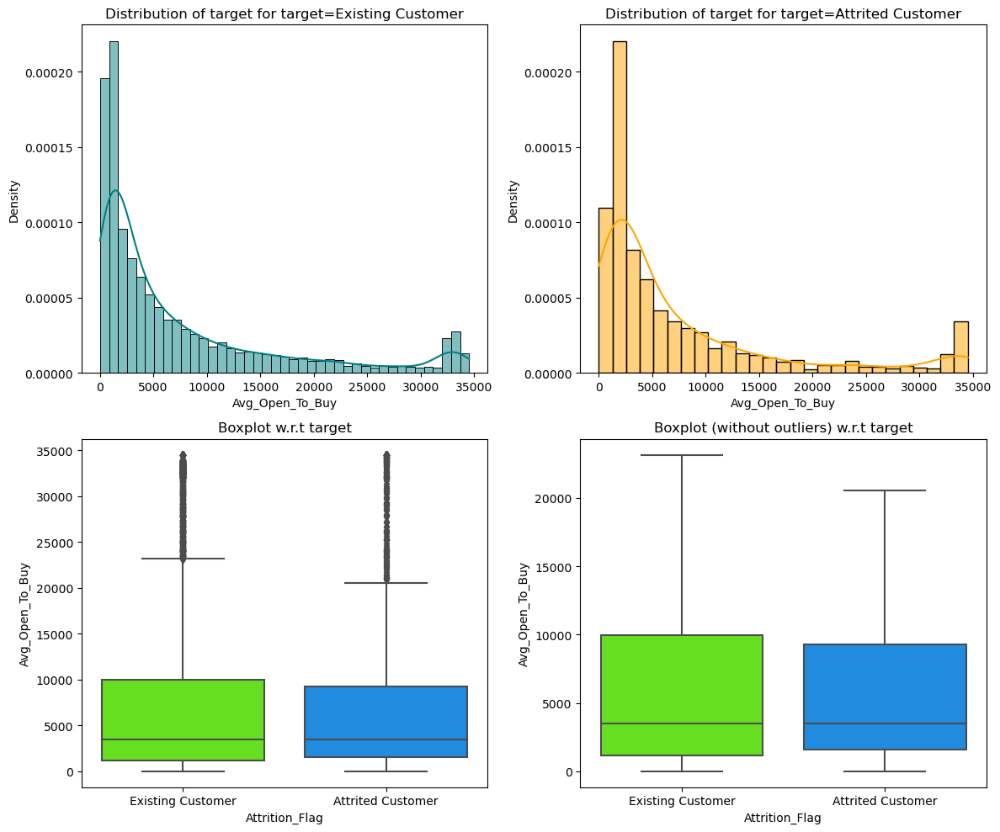

In [76]:
distribution_plot_wrt_target(data, "Avg_Open_To_Buy", "Attrition_Flag")

**Total_Amt_Chng_Q4_Q1 vs Attrition_Flag**

In [77]:
#stacked_barplot(data, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

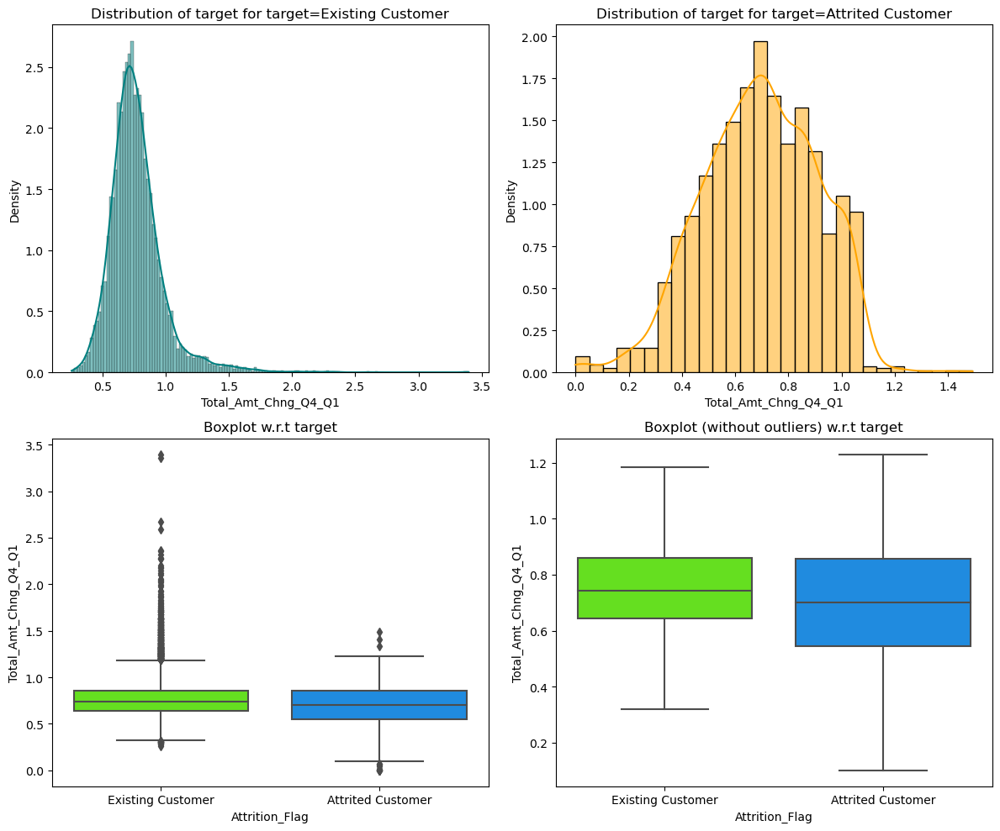

In [78]:
distribution_plot_wrt_target(data, "Total_Amt_Chng_Q4_Q1", "Attrition_Flag")

**Total_Trans_Amt vs Attrition_Flag**

In [79]:
#stacked_barplot(data, "Total_Trans_Amt", "Attrition_Flag")

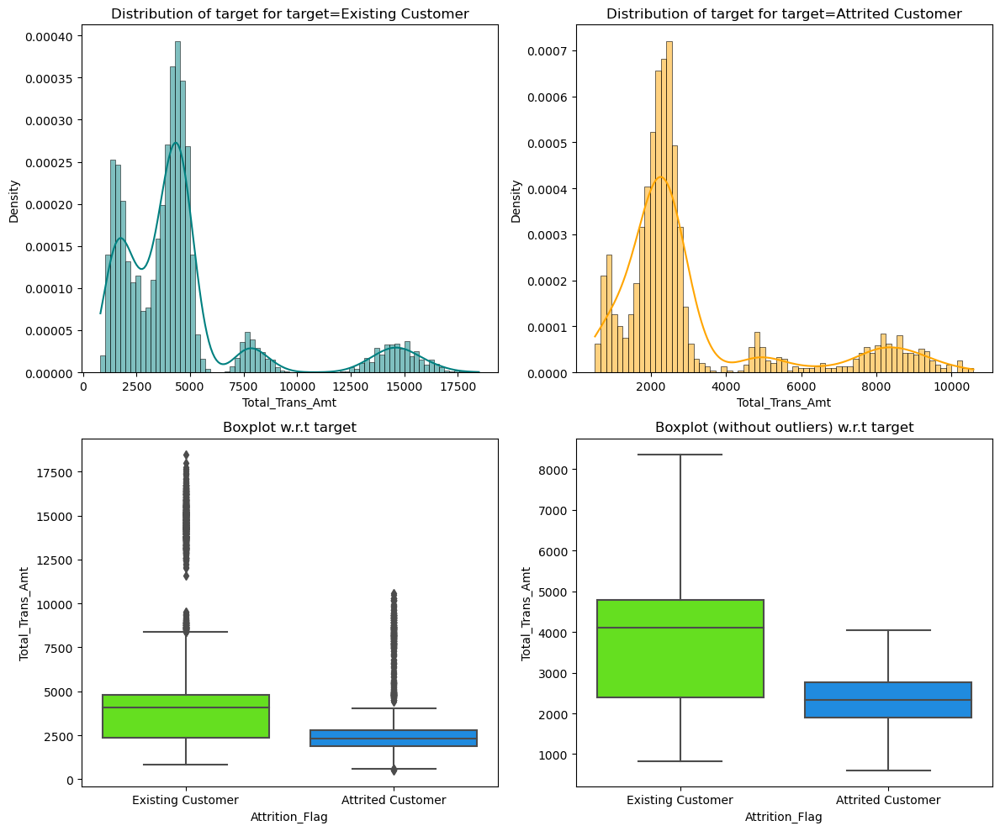

In [80]:
distribution_plot_wrt_target(data, "Total_Trans_Amt", "Attrition_Flag")

**Total_Trans_Ct vs Attrition_Flag**

Attrition_Flag  Attrited Customer  Existing Customer    All
Total_Trans_Ct                                             
All                          1627               8500  10127
43                             85                 62    147
42                             75                 57    132
40                             69                 67    136
44                             69                 58    127
41                             67                 71    138
45                             61                 68    129
39                             58                 68    126
38                             56                 83    139
46                             54                 46    100
47                             48                 62    110
36                             48                 87    135
49                             46                 72    118
37                             44                 97    141
51                             43       

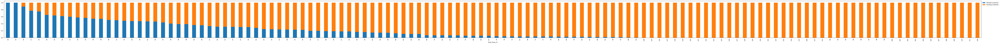

In [81]:
stacked_barplot(data, "Total_Trans_Ct", "Attrition_Flag")

In [82]:
#distribution_plot_wrt_target(data, "Card_Category", "Attrition_Flag")

**Total_Ct_Chng_Q4_Q1 vs Attrition_Flag**

In [83]:
#stacked_barplot(data, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

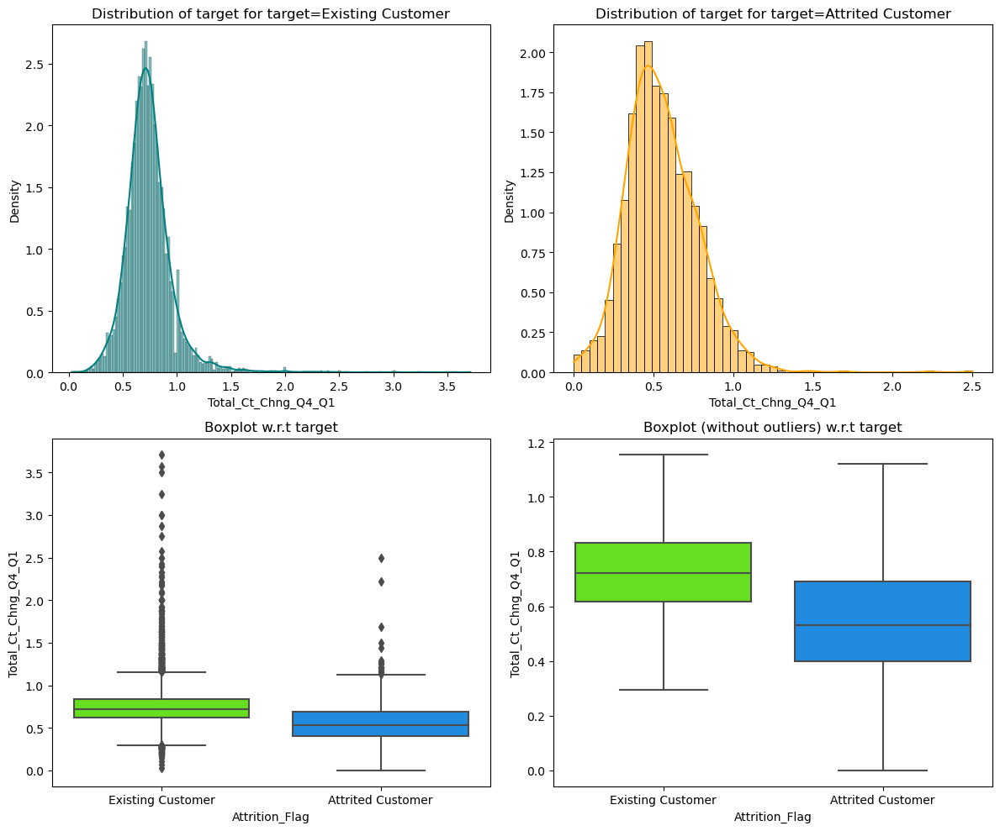

In [84]:
distribution_plot_wrt_target(data, "Total_Ct_Chng_Q4_Q1", "Attrition_Flag")

**Avg_Utilization_Ratio vs Attrition_Flag**

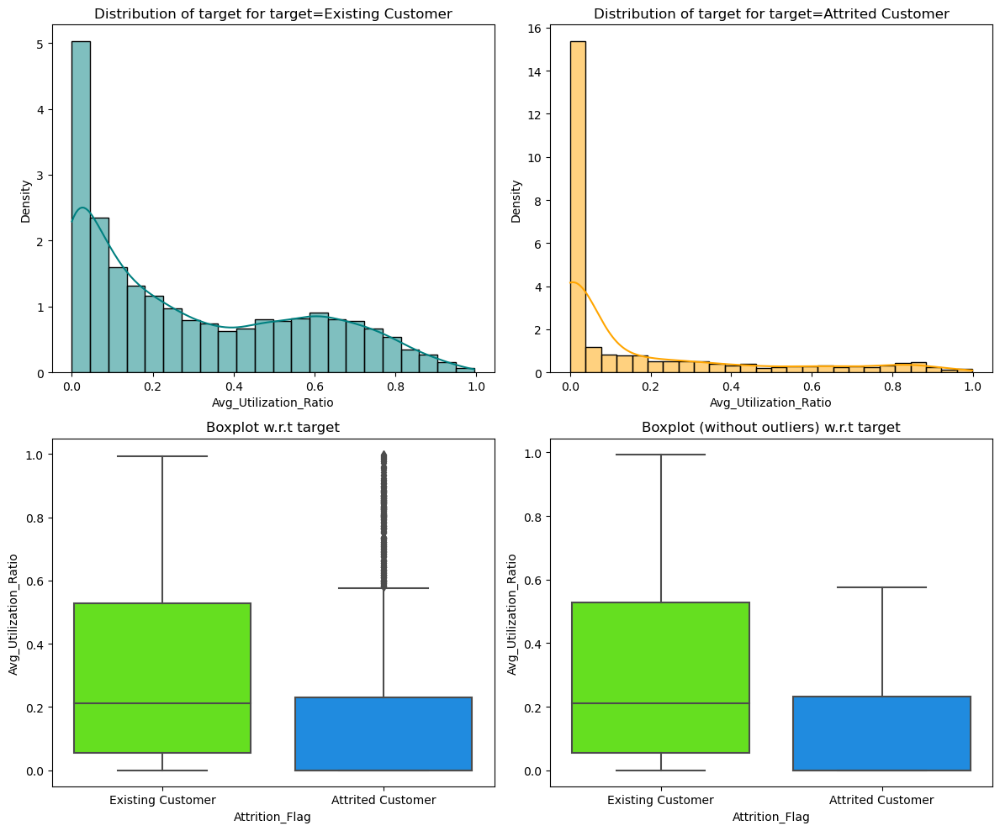

In [85]:
distribution_plot_wrt_target(data, "Avg_Utilization_Ratio", "Attrition_Flag")

**Correlation Check**

#sns.set(rc={'figure.figsize':(16,10)})
#sns.heatmap(data.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cmap="Spectral")
#plt.show()

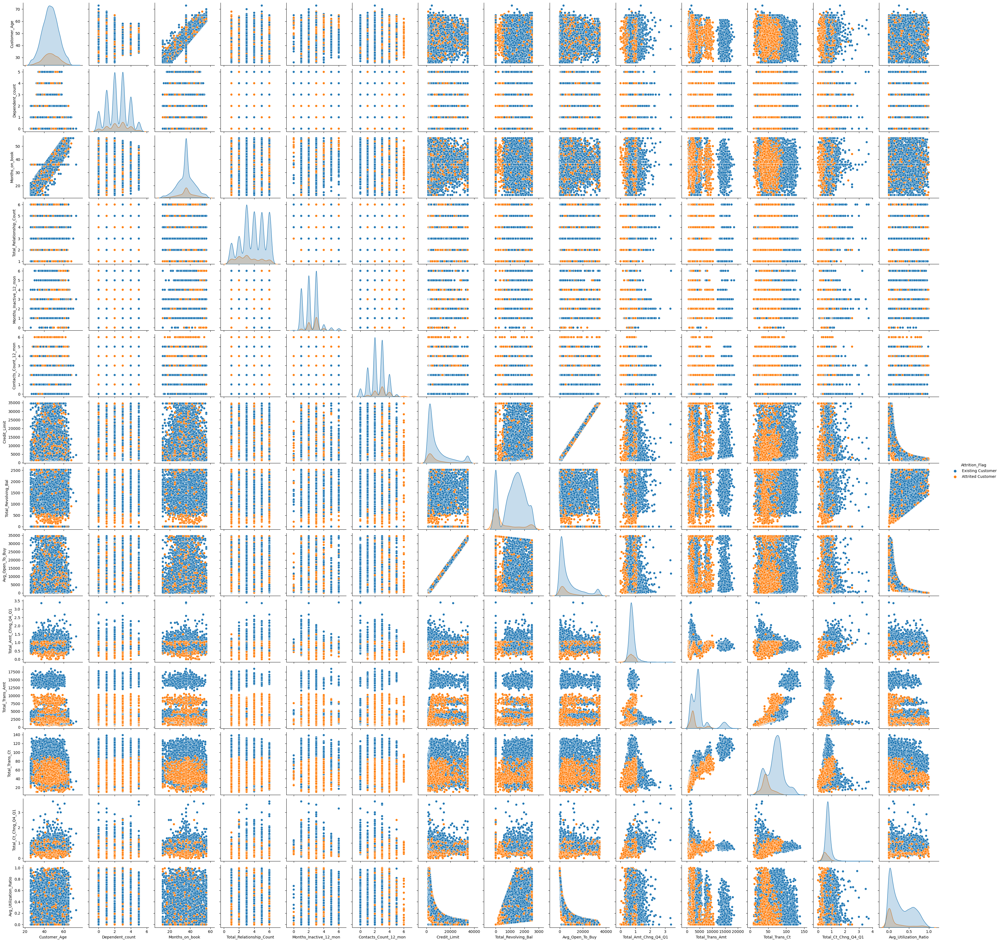

In [86]:
sns.pairplot(data,hue='Attrition_Flag')
plt.show()

In [87]:
data.corr()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Customer_Age,1.000,-0.122,0.789,-0.011,0.054,-0.018,0.002,0.015,0.001,-0.062,-0.046,-0.067,-0.012,0.007
Dependent_count,-0.122,1.000,-0.103,-0.039,-0.011,-0.041,0.068,-0.003,0.068,-0.035,0.025,0.050,0.011,-0.037
Months_on_book,0.789,-0.103,1.000,-0.009,0.074,-0.011,0.008,0.009,0.007,-0.049,-0.039,-0.050,-0.014,-0.008
Total_Relationship_Count,-0.011,-0.039,-0.009,1.000,-0.004,0.055,-0.071,0.014,-0.073,0.050,-0.347,-0.242,0.041,0.068
Months_Inactive_12_mon,0.054,-0.011,0.074,-0.004,1.000,0.029,-0.020,-0.042,-0.017,-0.032,-0.037,-0.043,-0.039,-0.008
Contacts_Count_12_mon,-0.018,-0.041,-0.011,0.055,0.029,1.000,0.021,-0.054,0.026,-0.024,-0.113,-0.152,-0.095,-0.055
Credit_Limit,0.002,0.068,0.008,-0.071,-0.020,0.021,1.000,0.042,0.996,0.013,0.172,0.076,-0.002,-0.483
Total_Revolving_Bal,0.015,-0.003,0.009,0.014,-0.042,-0.054,0.042,1.000,-0.047,0.058,0.064,0.056,0.090,0.624
Avg_Open_To_Buy,0.001,0.068,0.007,-0.073,-0.017,0.026,0.996,-0.047,1.000,0.008,0.166,0.071,-0.010,-0.539
Total_Amt_Chng_Q4_Q1,-0.062,-0.035,-0.049,0.050,-0.032,-0.024,0.013,0.058,0.008,1.000,0.040,0.005,0.384,0.035


**Inferences**

* Customers who have churned are highly educated - A high proportion of education level of attrited customer is Graduate level (29.9%), followed by Post-Graduate level (18.8%)

* The proportion of income category of attrited customer, it is highly concentrated around 60K - 80K income (37.6%), followed by Less than 40K income (16.7%) compare to attrited customers with higher annual income of 80K-120K(14.9%) and over 120K+ (11.5%).

* The proportion of gender count is almost equally distributed (52.9% male and 47.1%) compare to proportion of existing and attributed customer count (83.9% and 16.1%) which is highly imbalanced.

* The proportion of attrited customers by gender there are 14.4% more male than female who have churned.

* Platinum card users have the highest attrition rate at 25%. We need to analyze more of this product and maybe give more benefit to the Platinum users.

* People with less than 40K income and who have a graduate degree is our potential customer. These two segments should be our priority in marketing.

* Customers who have high school education with graduation higher as compared to other educational levels.

* The proportion of marital status of customers who have churned is Married (43.6%), followed by Single (41.1%) compared to Divorced (7.4%) and Unknown (7.9%) status - marital status of the attributed customers are highly clustered in Married status and Single.

* Most customers lie in the income category less than 40k, and also in this category, married people are higher, so we can consider this income category to be highly risky to give loans.

* Attrition Flag does not have highly strong correlation with any of the numeric variables.

* There are clusters formed with respect to attrition for the variables total revolving amount, total amount change Q4 to Q1, total transaction amount, total transaction count, total transaction count change Q4 to Q1.

* Credit Limit and Average Open to Buy have 100% collinearity.

* Months on book and Customer Age have quite strong correlation.

* Customers with age 29 and higher are at higher probability to churn.

* There are 16.07% of customers who have churned.

## Data Preprocessing

### Outlier Detection and Treatment

In [88]:
Q1 = data.quantile(0.25)  # To find the 25th percentile and 75th percentile.
Q3 = data.quantile(0.75)

IQR = Q3 - Q1  # Inter Quantile Range (75th perentile - 25th percentile)

lower = (
    Q1 - 1.5 * IQR
)  # Finding lower and upper bounds for all values. All values outside these bounds are outliers
upper = Q3 + 1.5 * IQR

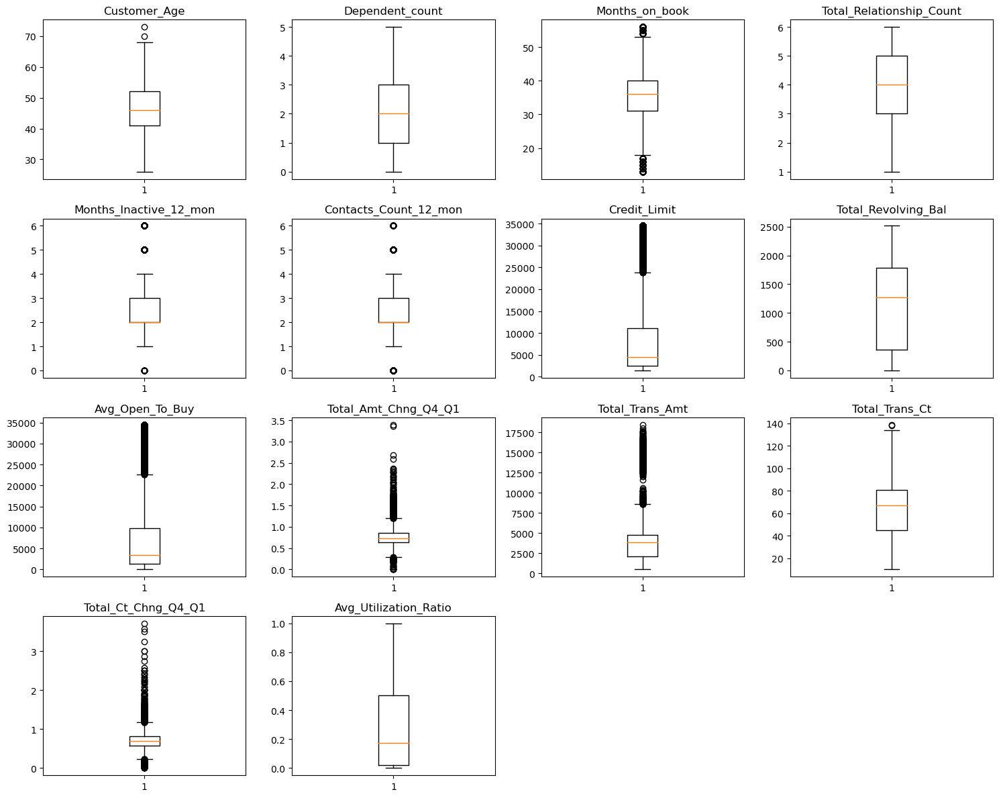

In [89]:
# outlier detection using boxplot
numeric_columns = data.select_dtypes(include=np.number).columns.tolist()


plt.figure(figsize=(15, 12))

for i, variable in enumerate(numeric_columns):
    plt.subplot(4, 4, i + 1)
    plt.boxplot(data[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

In [90]:
((data.select_dtypes(include=["float64", "int64"]) < lower)|(data.select_dtypes(include=["float64", "int64"]) > upper)).sum() / len(data) * 100

Customer_Age               0.020
Dependent_count            0.000
Months_on_book             3.812
Total_Relationship_Count   0.000
Months_Inactive_12_mon     3.268
Contacts_Count_12_mon      6.211
Credit_Limit               9.717
Total_Revolving_Bal        0.000
Avg_Open_To_Buy            9.509
Total_Amt_Chng_Q4_Q1       3.910
Total_Trans_Amt            8.848
Total_Trans_Ct             0.020
Total_Ct_Chng_Q4_Q1        3.891
Avg_Utilization_Ratio      0.000
dtype: float64

### Missing value treatment

In [91]:
data.isnull().sum().sort_values(ascending=False)

Education_Level             1519
Marital_Status               749
Attrition_Flag                 0
Contacts_Count_12_mon          0
Total_Ct_Chng_Q4_Q1            0
Total_Trans_Ct                 0
Total_Trans_Amt                0
Total_Amt_Chng_Q4_Q1           0
Avg_Open_To_Buy                0
Total_Revolving_Bal            0
Credit_Limit                   0
Months_Inactive_12_mon         0
Customer_Age                   0
Total_Relationship_Count       0
Months_on_book                 0
Card_Category                  0
Income_Category                0
Dependent_count                0
Gender                         0
Avg_Utilization_Ratio          0
dtype: int64

In [92]:
round(data.isnull().sum() / data.isnull().count() * 100, 2)

Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

**KNN Imputer**

In [93]:
# defining a list with names of columns that will be used for imputation
reqd_col_for_impute = [
    "Education_Level",
    "Marital_Status",
]

In [94]:
data[reqd_col_for_impute].head()

,Education_Level,Marital_Status
0,High School,Married
1,Graduate,Single
2,Graduate,Married
3,High School,NaN
4,Uneducated,Married


In [95]:
data1 = data.copy()

In [96]:
# we need to pass numerical values for each categorical column for KNN imputation so we will label encode them
education_level = {
    "Uneducated": 0,
    "High School": 1,
    "College": 2,
    "Graduate":3,
    "Post-Graduate": 4,
    "Doctorate": 5,
}
data1["Education_Level"] = data1["Education_Level"].map(education_level)

marital_status = {
    "Married": 0,
    "Single": 1,
    "Divorced": 2,
}
data1["Marital_Status"] = data1["Marital_Status"].map(marital_status)

### Data Preparataion for model building

In [97]:
#Removing customer interaction data from independent variables
X = data1.drop(["Attrition_Flag"], axis=1)
y = data1["Attrition_Flag"].apply(lambda x: 1 if x == "Attrited Customer" else 0)

X = pd.get_dummies(X, 
                  columns=[
                       "Gender",
                       "Education_Level",
                       "Marital_Status",
                       "Income_Category",
                       "Card_Category"
                   ], 
                   drop_first=True)

In [98]:
# Splitting data into training, validation and test set:

# first we split data into 2 parts, say temporary and test
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=0, stratify=y
)

# then we split the temporary set into train and validation
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=0, stratify=y_temp
)

print(X_train.shape, X_val.shape, X_test.shape)

(8101, 19) (1519, 19) (507, 19)


In [99]:
print(f"Number of rows in train data {X_train.shape[0]}")
print(f"Number of rows in validation data {X_val.shape[0]}")
print(f"Number of rows in test data {X_test.shape[0]}")

Number of rows in train data 8101
Number of rows in validation data 1519
Number of rows in test data 507


### Imputing missing values

In [100]:
data.isnull().sum().sort_values(ascending=False)

Education_Level             1519
Marital_Status               749
Attrition_Flag                 0
Contacts_Count_12_mon          0
Total_Ct_Chng_Q4_Q1            0
Total_Trans_Ct                 0
Total_Trans_Amt                0
Total_Amt_Chng_Q4_Q1           0
Avg_Open_To_Buy                0
Total_Revolving_Bal            0
Credit_Limit                   0
Months_Inactive_12_mon         0
Customer_Age                   0
Total_Relationship_Count       0
Months_on_book                 0
Card_Category                  0
Income_Category                0
Dependent_count                0
Gender                         0
Avg_Utilization_Ratio          0
dtype: int64

In [101]:
round(data.isnull().sum() / data.isnull().count() * 100, 2)

Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64

In [102]:
imputer = KNNImputer(n_neighbors=5)

In [103]:
# Fit and transform the train data
X_train[reqd_col_for_impute] = imputer.fit_transform(X_train[reqd_col_for_impute])

# Transform the val data
X_val[reqd_col_for_impute] = imputer.transform(X_val[reqd_col_for_impute])

# Transform the test data
X_test[reqd_col_for_impute] = imputer.transform(X_test[reqd_col_for_impute])

In [104]:
# Checking that no column has missing values in train, validation or test sets
print(X_train.isna().sum())
print("-" * 30)
print(X_val.isna().sum())
print("-" * 30)
print(X_test.isna().sum())

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64
------------------------------
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal       

In [105]:
## Function to inverse the encoding
def inverse_mapping(x, y):
    inv_dict = {v: k for k, v in x.items()}
    X_train[y] = np.round(X_train[y]).map(inv_dict).astype("category")
    X_val[y] = np.round(X_val[y]).map(inv_dict).astype("category")
    X_test[y] = np.round(X_test[y]).map(inv_dict).astype("category")

In [106]:
inverse_mapping(education_level, "Education_Level")
inverse_mapping(marital_status, "Marital_Status")

In [107]:
cols = X_train.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_train[i].value_counts())
    print("*" * 30)

F    4286
M    3815
Name: Gender, dtype: int64
******************************
Graduate         2473
High School      1619
Uneducated       1202
College           808
Post-Graduate     410
Doctorate         355
Name: Education_Level, dtype: int64
******************************
Married     3765
Single      3141
Divorced     611
Name: Marital_Status, dtype: int64
******************************
Less than $40K    2862
$40K - $60K       1372
$80K - $120K      1226
$60K - $80K       1159
abc                902
$120K +            580
Name: Income_Category, dtype: int64
******************************
Blue        7551
Silver       435
Gold          98
Platinum      17
Name: Card_Category, dtype: int64
******************************


In [108]:
cols = X_val.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_val[i].value_counts())
    print("*" * 30)

F    826
M    693
Name: Gender, dtype: int64
******************************
Graduate         504
High School      288
Uneducated       213
College          153
Post-Graduate     76
Doctorate         70
Name: Education_Level, dtype: int64
******************************
Married     687
Single      599
Divorced    107
Name: Marital_Status, dtype: int64
******************************
Less than $40K    540
$40K - $60K       312
$80K - $120K      217
$60K - $80K       176
abc               167
$120K +           107
Name: Income_Category, dtype: int64
******************************
Blue        1411
Silver        95
Gold          10
Platinum       3
Name: Card_Category, dtype: int64
******************************


In [109]:
cols = X_test.select_dtypes(include=["object", "category"])
for i in cols.columns:
    print(X_test[i].value_counts())
    print("*" * 30)

M    261
F    246
Name: Gender, dtype: int64
******************************
Graduate         151
High School      106
Uneducated        72
College           52
Post-Graduate     30
Doctorate         26
Name: Education_Level, dtype: int64
******************************
Married     235
Single      203
Divorced     30
Name: Marital_Status, dtype: int64
******************************
Less than $40K    159
$40K - $60K       106
$80K - $120K       92
$60K - $80K        67
abc                43
$120K +            40
Name: Income_Category, dtype: int64
******************************
Blue        474
Silver       25
Gold          8
Platinum      0
Name: Card_Category, dtype: int64
******************************


### Creating Dummy Variables

In [110]:
X_train = pd.get_dummies(X_train, drop_first=True)
X_val = pd.get_dummies(X_val, drop_first=True)
X_test = pd.get_dummies(X_test, drop_first=True)
print(X_train.shape, X_val.shape, X_test.shape)

(8101, 30) (1519, 30) (507, 30)


In [111]:
X_train.head()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_abc,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
9893,42,3,36,6,1,2,15648.000,0,15648.000,0.731,13784,88,0.913,0.000,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
6611,36,2,36,3,2,1,14304.000,699,13605.000,0.549,4746,73,0.521,0.049,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
3334,50,1,39,4,1,1,2421.000,1029,1392.000,0.675,2377,56,0.750,0.425,1,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0
5987,63,1,55,6,1,2,21430.000,0,21430.000,0.511,3561,57,0.676,0.000,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0
1725,39,2,36,3,2,4,9843.000,2154,7689.000,0.733,1402,35,0.667,0.219,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0


## Building the model

### Model evaluation criterion

### Model can make wrong predictions as:

* False Positive: Predicting an existing customer customer will churn but in reality the customer will NOT churn - Loss of resources by offering incentives/promotions without advantage
* False Negative: Predicting an existing customer will NOT churn but in reality the customer churns - Loss of buisness opportunity

### Which case is more important? 
* Losing a potential customer by predicting that the existing customer will NOT churn but in reality the customer churns - False Negative.

### How to reduce this loss i.e need to reduce False Negatives?

* Tourism company would want `Recall` to be maximized, greater the Recall higher the chances of minimizing false negatives. Hence, the focus should be on increasing Recall or minimizing the false negatives.

In [112]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [113]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Logistic Regression

In [114]:
lr = LogisticRegression(solver="newton-cg", random_state=1)
lr.fit(X_train, y_train)

LogisticRegression(random_state=1, solver='newton-cg')

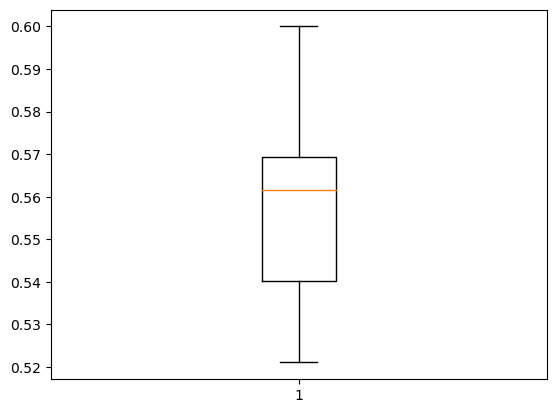

In [115]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

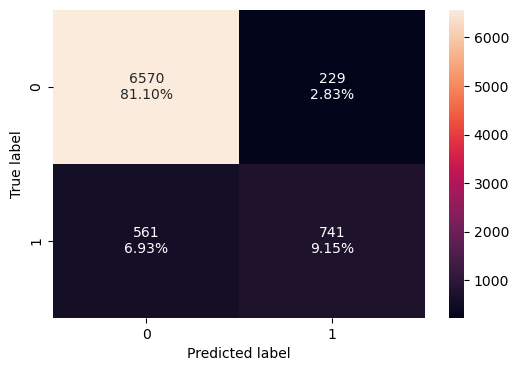

In [116]:
# creating confusion matrix
confusion_matrix_sklearn(lr, X_train, y_train)

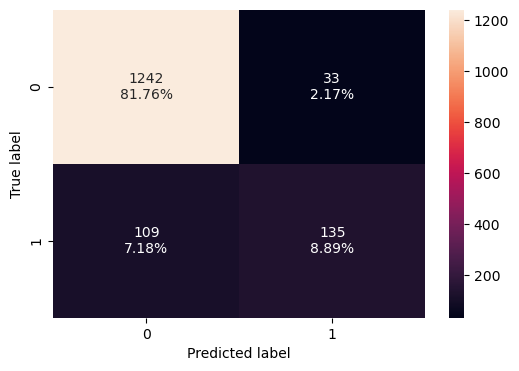

In [117]:
# creating confusion matrix
confusion_matrix_sklearn(lr, X_val, y_val)

In [118]:
# Calculating different metrics on train set
lr_train = model_performance_classification_sklearn(
    lr, X_train, y_train
)
print("Training performance:")
lr_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.902,0.569,0.764,0.652


In [119]:
# Calculating different metrics on train set
lr_val = model_performance_classification_sklearn(
    lr, X_val, y_val
)
print("Validation performance:")
lr_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.907,0.553,0.804,0.655


### Decision Tree Model

In [120]:
#Fitting the model
dtree = DecisionTreeClassifier(random_state=1)
dtree.fit(X_train,y_train)

DecisionTreeClassifier(random_state=1)

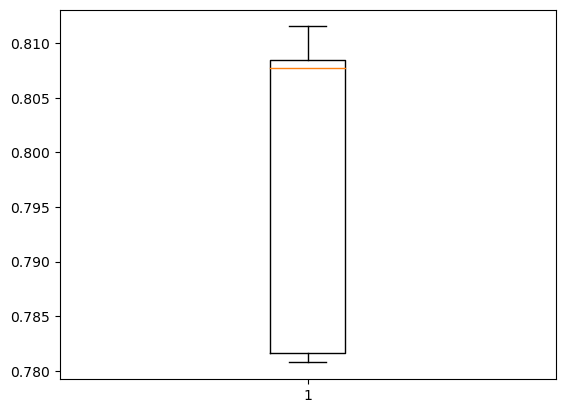

In [121]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

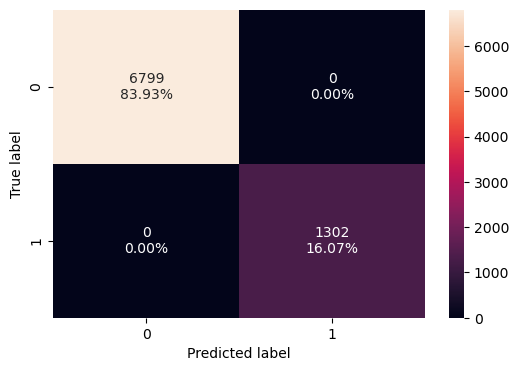

In [122]:
# creating confusion matrix
confusion_matrix_sklearn(dtree, X_train, y_train)

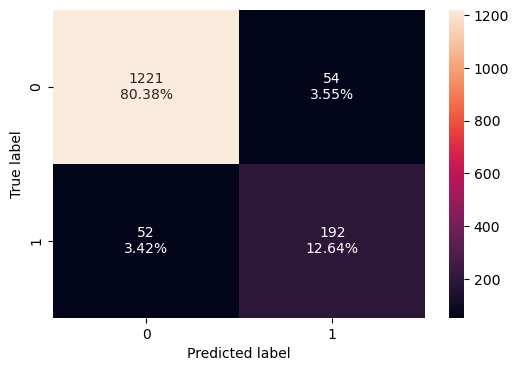

In [123]:
# creating confusion matrix
confusion_matrix_sklearn(dtree, X_val, y_val)

In [124]:
# Calculating different metrics on train set
dtree_train = model_performance_classification_sklearn(
    dtree, X_train, y_train
)
print("Training performance:")
dtree_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [125]:
# Calculating different metrics on train set
dtree_val = model_performance_classification_sklearn(
    dtree, X_val, y_val
)
print("Validation performance:")
dtree_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.930,0.787,0.780,0.784


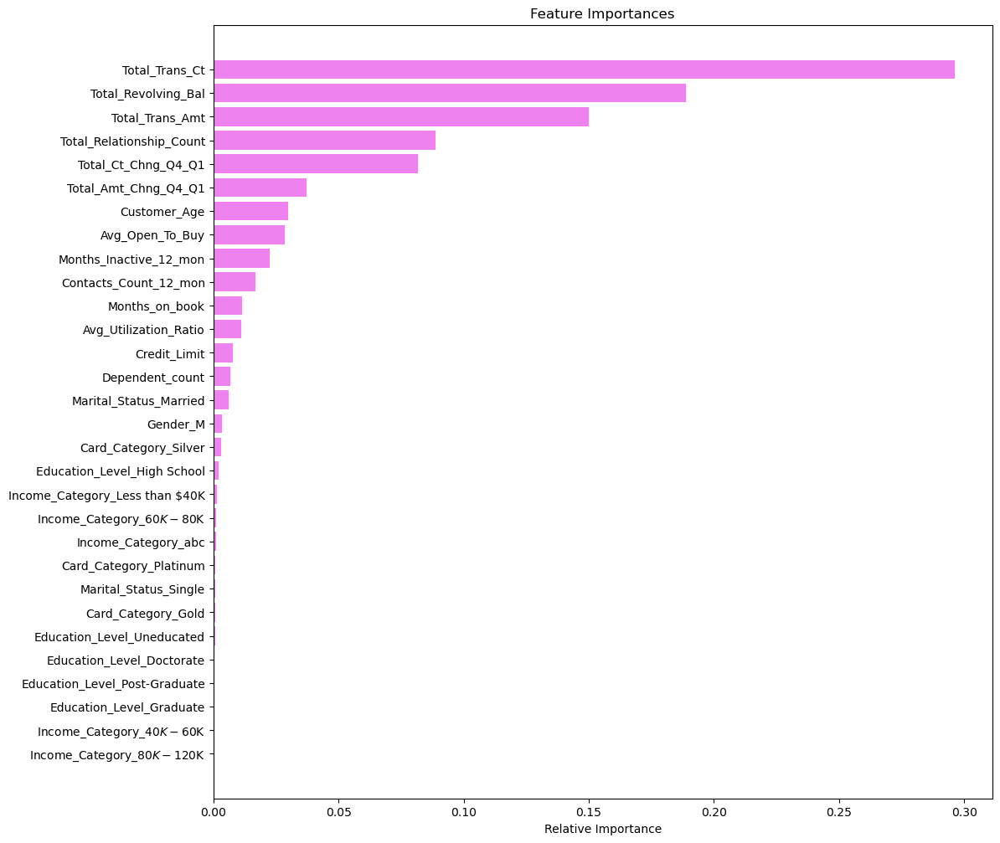

In [126]:
importances = dtree.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

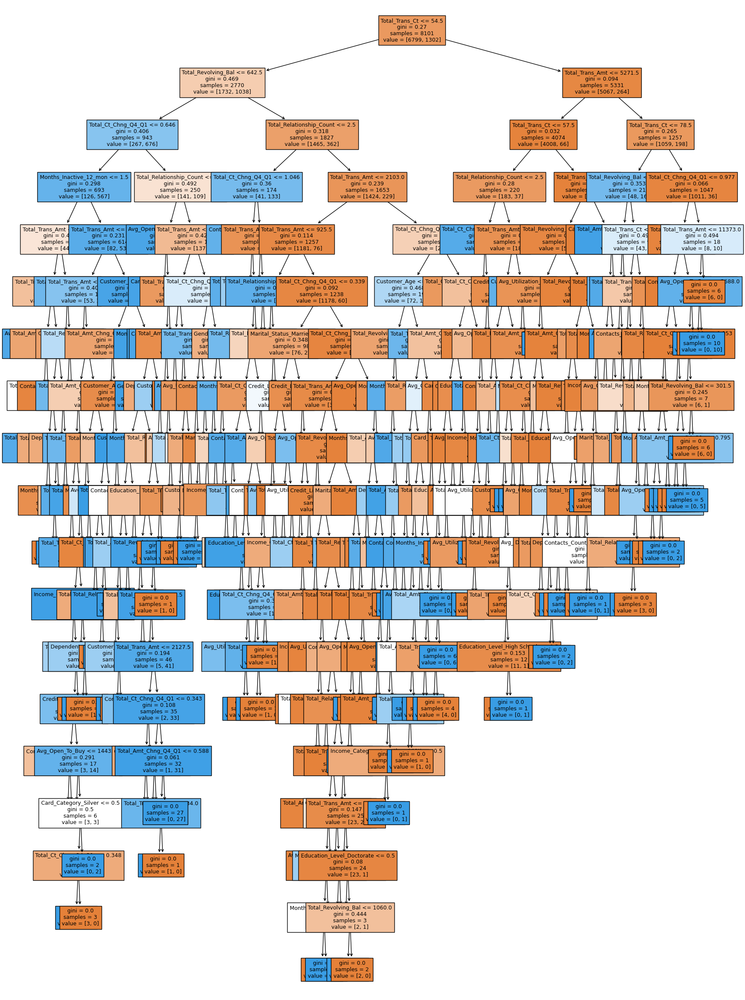

In [127]:
plt.figure(figsize=(20, 30))
out = tree.plot_tree(
    dtree,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

### Random Forest Model

In [128]:
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

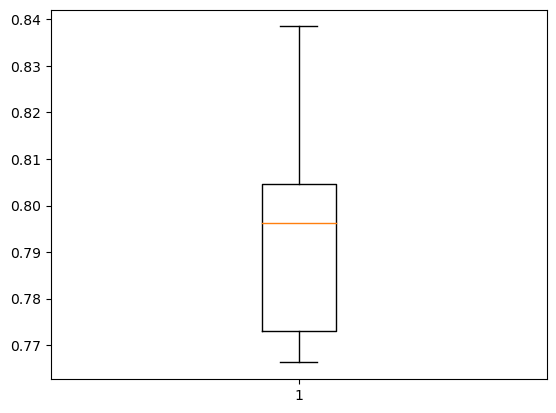

In [129]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=rf, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

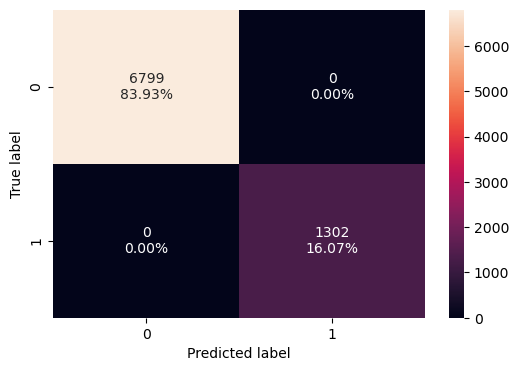

In [130]:
# creating confusion matrix
confusion_matrix_sklearn(rf, X_train, y_train)

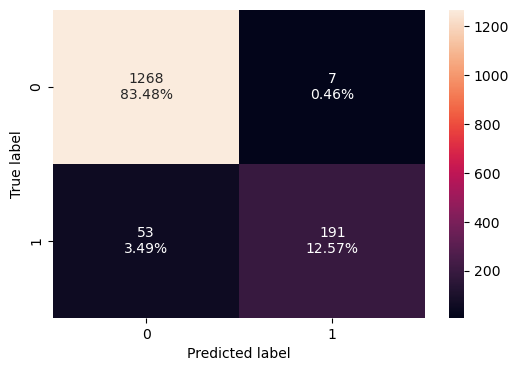

In [131]:
# creating confusion matrix
confusion_matrix_sklearn(rf, X_val, y_val)

In [132]:
# Calculating different metrics on train set
rf_train = model_performance_classification_sklearn(
    rf, X_train, y_train
)
print("Training performance:")
rf_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [133]:
# Calculating different metrics on train set
rf_val = model_performance_classification_sklearn(
    rf, X_val, y_val
)
print("Validation performance:")
rf_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.961,0.783,0.965,0.864


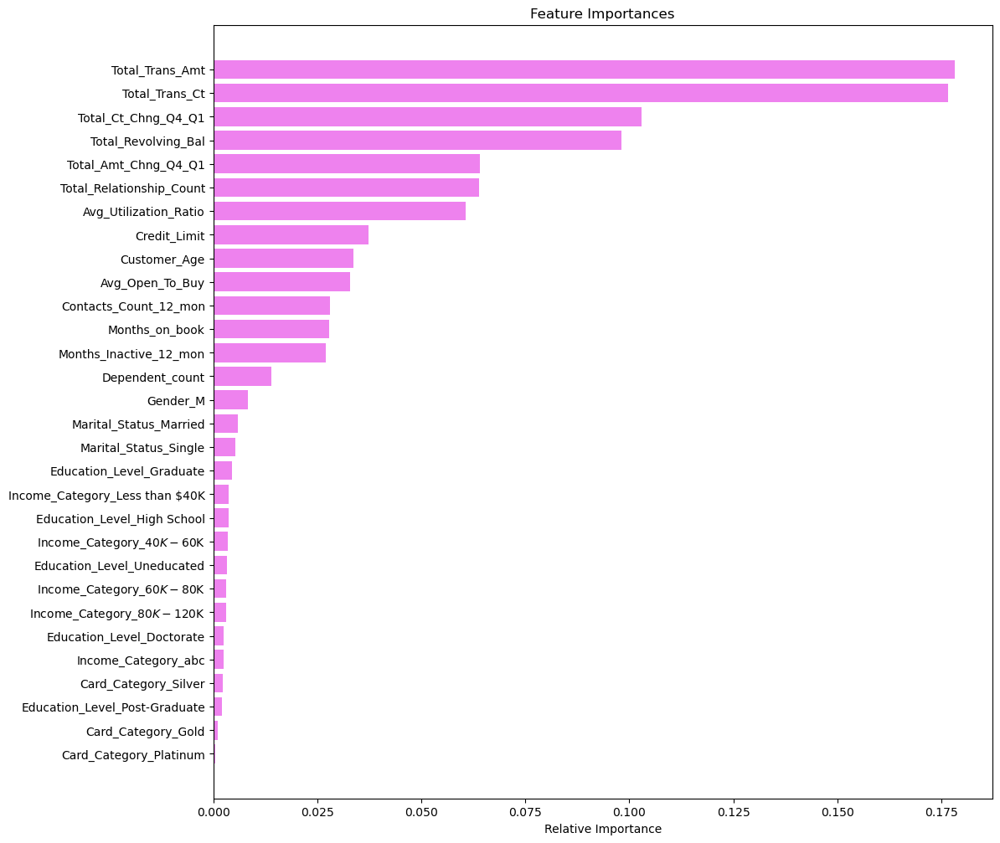

In [134]:
importances = rf.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Bagging Classifier

In [135]:
bagging = BaggingClassifier(random_state=1)
bagging.fit(X_train,y_train)

BaggingClassifier(random_state=1)

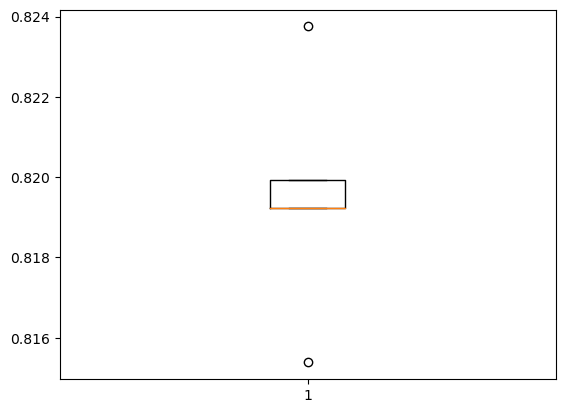

In [136]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

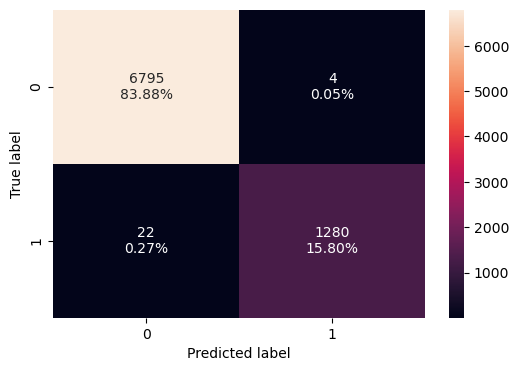

In [137]:
# creating confusion matrix
confusion_matrix_sklearn(bagging, X_train, y_train)

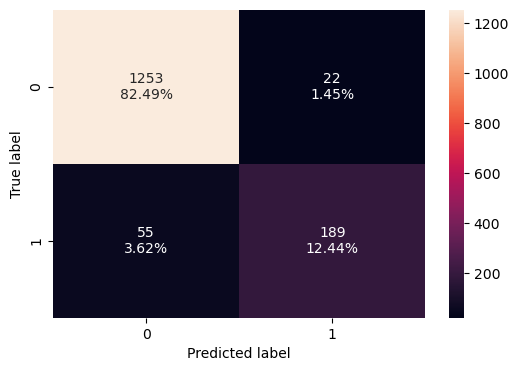

In [138]:
# creating confusion matrix
confusion_matrix_sklearn(bagging, X_val, y_val)

In [139]:
# Calculating different metrics on train set
bagging_train = model_performance_classification_sklearn(
    bagging, X_train, y_train
)
print("Training performance:")
bagging_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.997,0.983,0.997,0.990


In [140]:
# Calculating different metrics on train set
bagging_val = model_performance_classification_sklearn(
    bagging, X_val, y_val
)
print("Validation performance:")
bagging_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.949,0.775,0.896,0.831


### Ada Booster

In [141]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

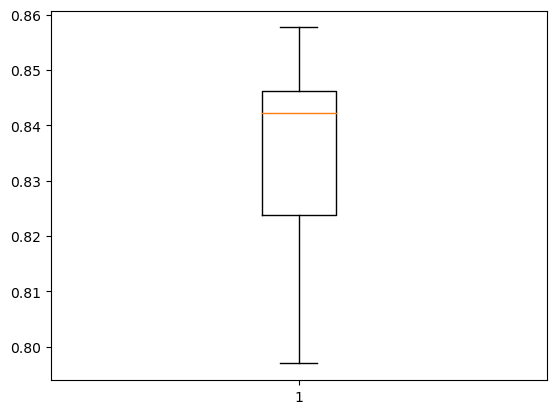

In [142]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=abc, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

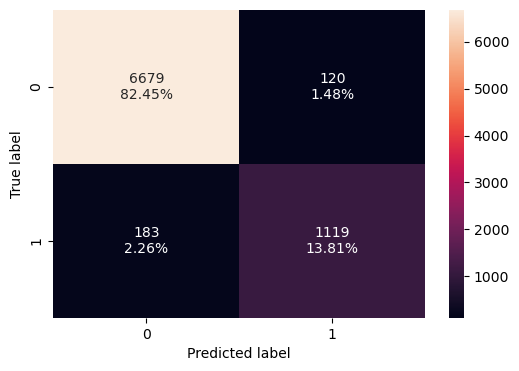

In [143]:
# creating confusion matrix
confusion_matrix_sklearn(abc, X_train, y_train)

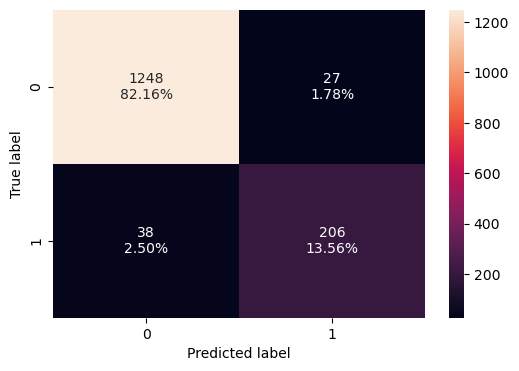

In [144]:
# creating confusion matrix
confusion_matrix_sklearn(abc, X_val, y_val)

In [145]:
# Calculating different metrics on train set
abc_train = model_performance_classification_sklearn(
    abc, X_train, y_train
)
print("Training performance:")
abc_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.963,0.859,0.903,0.881


In [146]:
# Calculating different metrics on train set
abc_val = model_performance_classification_sklearn(
    abc, X_val, y_val
)
print("Validation performance:")
abc_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.957,0.844,0.884,0.864


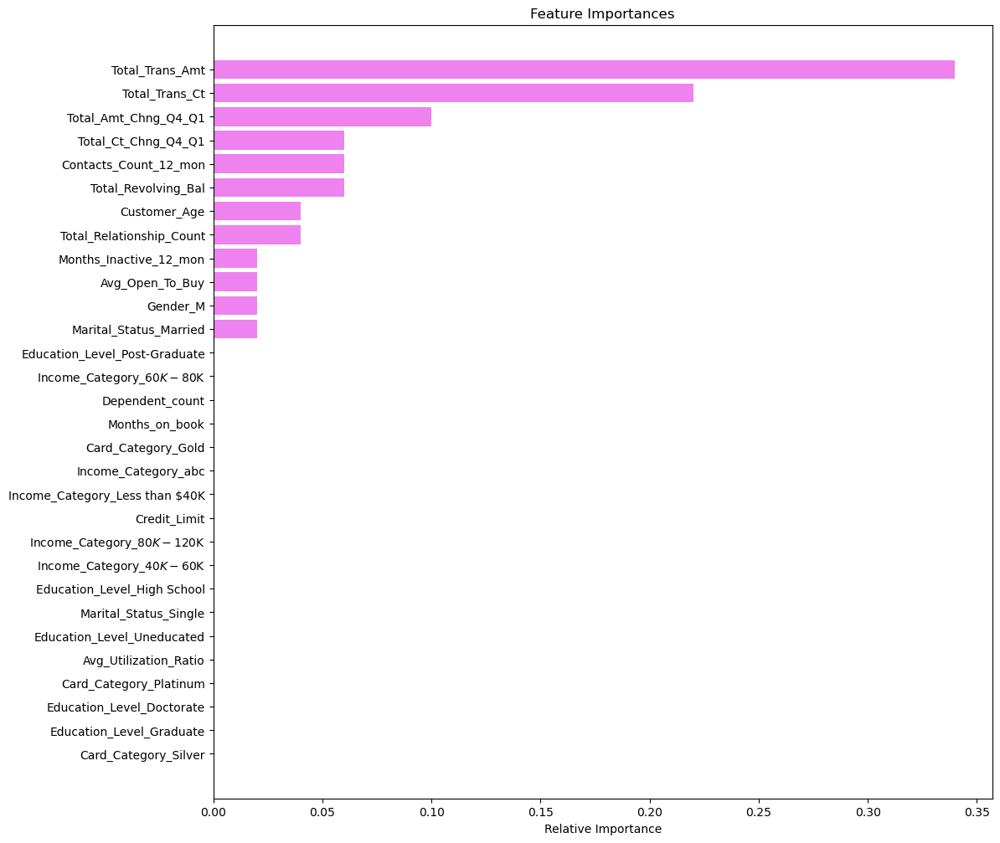

In [147]:
importances = abc.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Gradient Booster

In [148]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

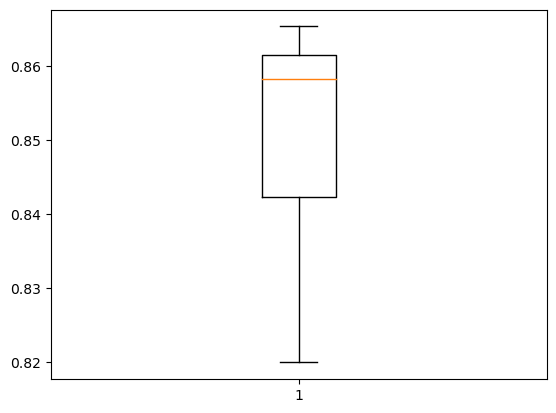

In [149]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

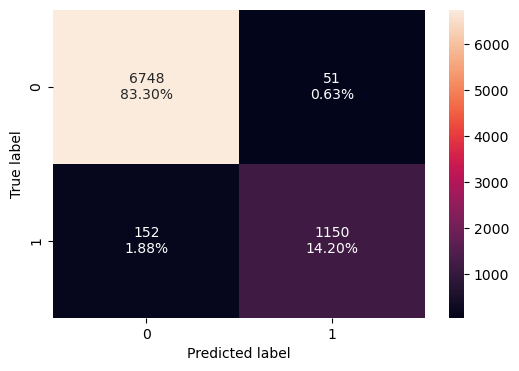

In [150]:
# creating confusion matrix
confusion_matrix_sklearn(gbc, X_train, y_train)

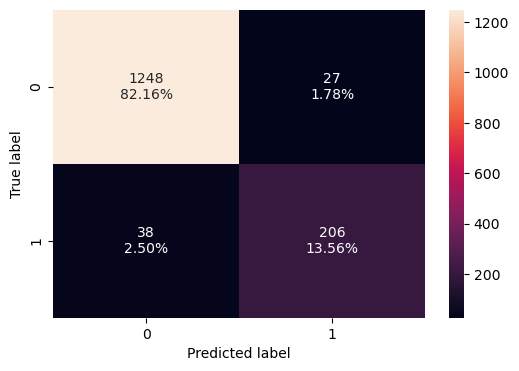

In [151]:
# creating confusion matrix
confusion_matrix_sklearn(abc, X_val, y_val)

In [152]:
# Calculating different metrics on train set
gbc_train = model_performance_classification_sklearn(
    gbc, X_train, y_train
)
print("Training performance:")
gbc_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.975,0.883,0.958,0.919


In [153]:
# Calculating different metrics on train set
gbc_val = model_performance_classification_sklearn(
    gbc, X_val, y_val
)
print("Validation performance:")
gbc_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.966,0.840,0.940,0.887


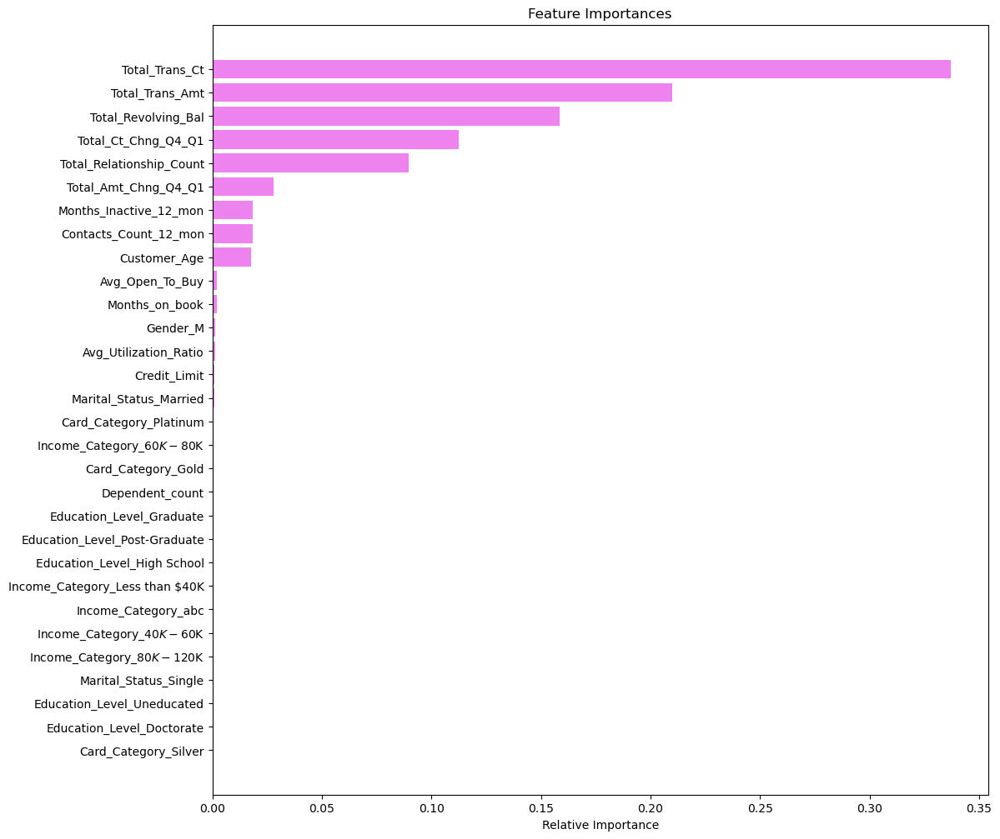

In [154]:
importances = gbc.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### XG Boost 

In [155]:
xgb = XGBClassifier(random_state=1,eval_metric='logloss')
xgb.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

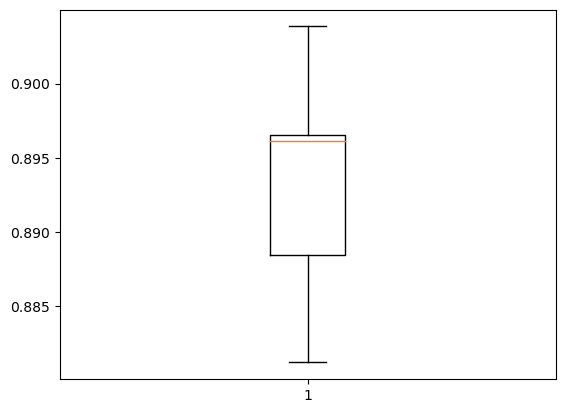

In [156]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb, X=X_train, y=y_train, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

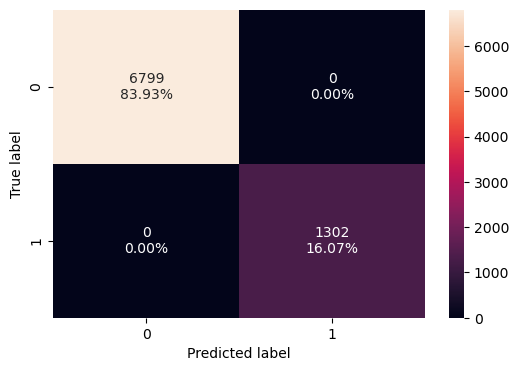

In [157]:
# creating confusion matrix
confusion_matrix_sklearn(xgb, X_train, y_train)

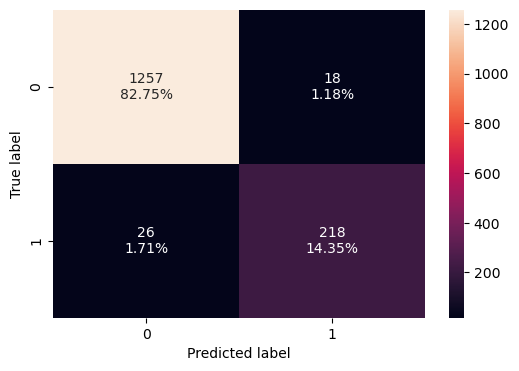

In [158]:
# creating confusion matrix
confusion_matrix_sklearn(xgb, X_val, y_val)

In [159]:
# Calculating different metrics on train set
xgb_train = model_performance_classification_sklearn(
    xgb, X_train, y_train
)
print("Training performance:")
xgb_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [160]:
# Calculating different metrics on train set
xgb_val = model_performance_classification_sklearn(
    xgb, X_val, y_val
)
print("Validation performance:")
xgb_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.971,0.893,0.924,0.908


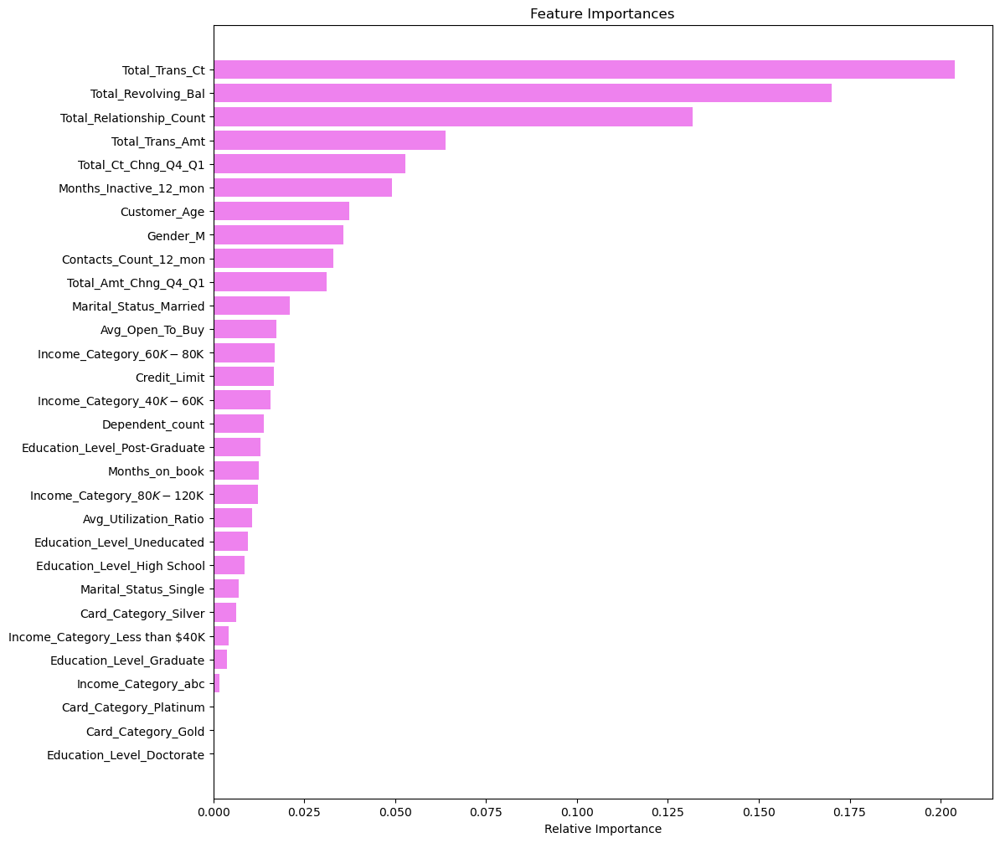

In [161]:
importances = xgb.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Oversampled Data by Smote

In [165]:
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before Oversampling, counts of label 'Yes': 1302
Before Oversampling, counts of label 'No': 6799 

After Oversampling, counts of label 'Yes': 6799
After Oversampling, counts of label 'No': 6799 

After Oversampling, the shape of train_X: (13598, 30)
After Oversampling, the shape of train_y: (13598,) 



### Logistic Regression Over Sampling data

In [166]:
lr_over = LogisticRegression(random_state=1)

# Training the basic logistic regression model with training set
lr_over.fit(X_train_over, y_train_over)

LogisticRegression(random_state=1)

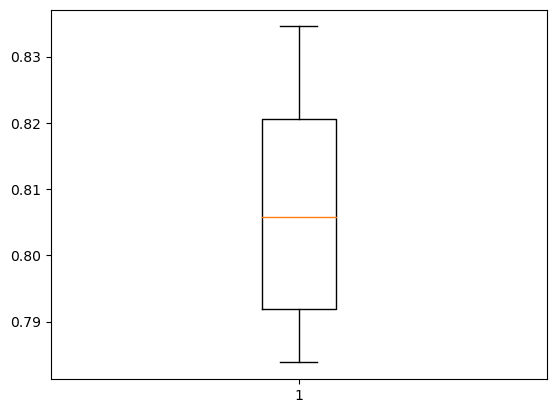

In [168]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

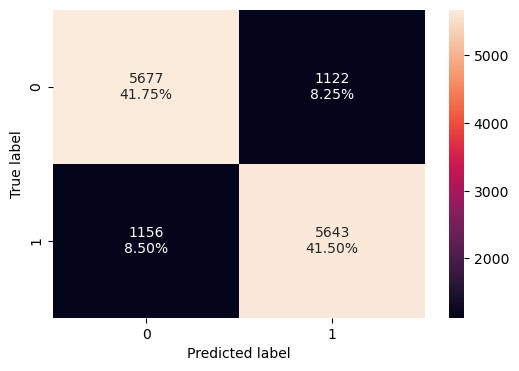

In [169]:
# creating confusion matrix
confusion_matrix_sklearn(lr_over, X_train_over, y_train_over)

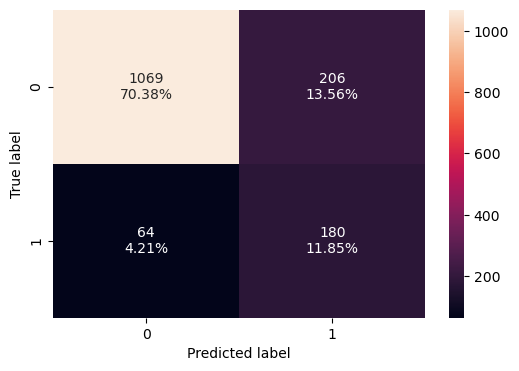

In [170]:
# creating confusion matrix
confusion_matrix_sklearn(lr_over, X_val, y_val)

In [171]:
# Calculating different metrics on train set
lr_over_train = model_performance_classification_sklearn(
    lr_over, X_train_over, y_train_over
)
print("Training performance:")
lr_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.832,0.830,0.834,0.832


In [172]:
# Calculating different metrics on train set
lr_over_val = model_performance_classification_sklearn(
    lr_over, X_val, y_val
)
print("Validation performance:")
lr_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.822,0.738,0.466,0.571


### Decision Tree Oversampling

In [173]:
#Fitting the model
dtree_over = DecisionTreeClassifier(random_state=1)
dtree_over.fit(X_train_over,y_train_over)

DecisionTreeClassifier(random_state=1)

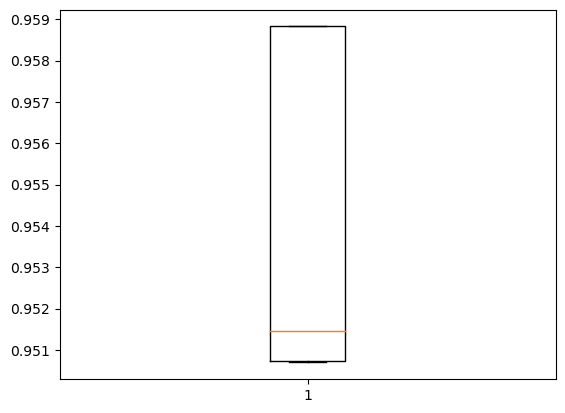

In [174]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

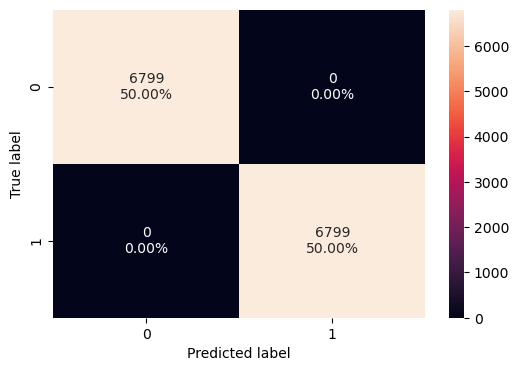

In [175]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_over, X_train_over, y_train_over)

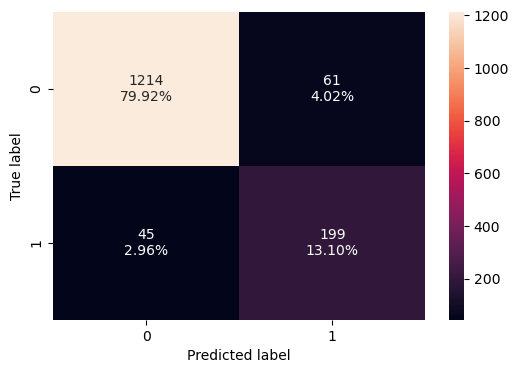

In [176]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_over, X_val, y_val)

In [177]:
# Calculating different metrics on train set
dtree_over_train = model_performance_classification_sklearn(
    dtree_over, X_train_over, y_train_over
)
print("Training performance:")
dtree_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [178]:
# Calculating different metrics on train set
dtree_over_val = model_performance_classification_sklearn(
    dtree_over, X_val, y_val
)
print("Validation performance:")
dtree_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.930,0.816,0.765,0.790


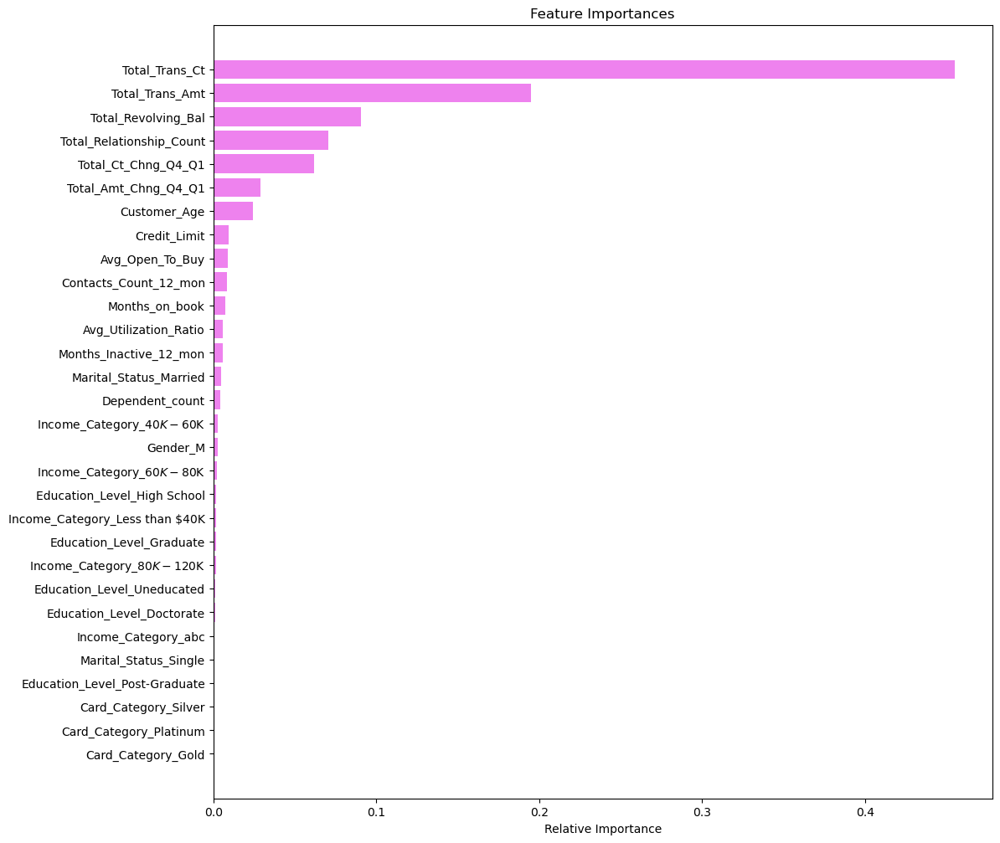

In [179]:
importances = dtree_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

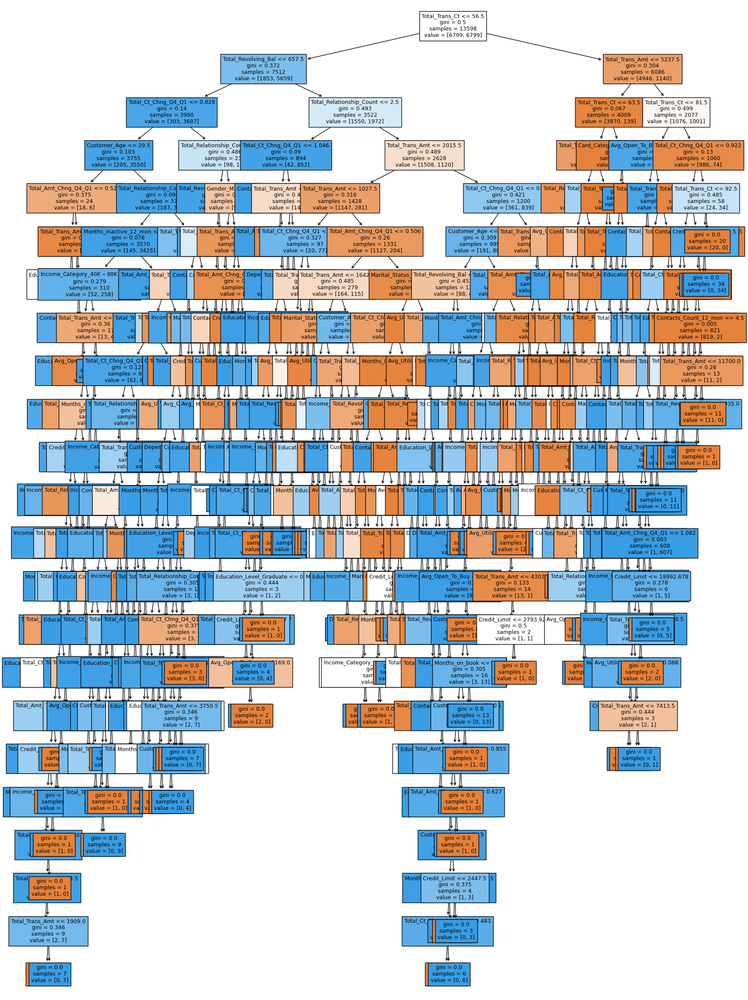

In [180]:
plt.figure(figsize=(20, 30))
out = tree.plot_tree(
    dtree_over,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

### Random Forest Model Oversampling data

In [181]:
rf_over = RandomForestClassifier(random_state=1)
rf_over.fit(X_train_over,y_train_over)

RandomForestClassifier(random_state=1)

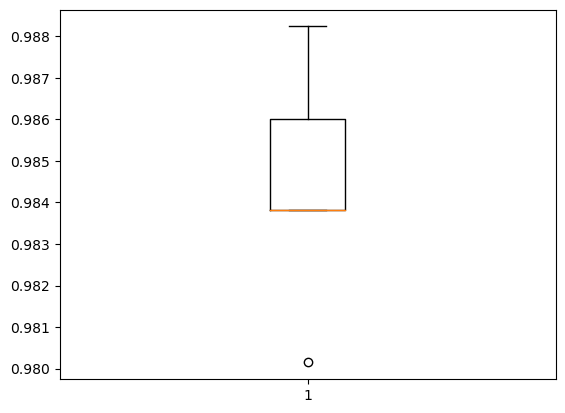

In [182]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=rf_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

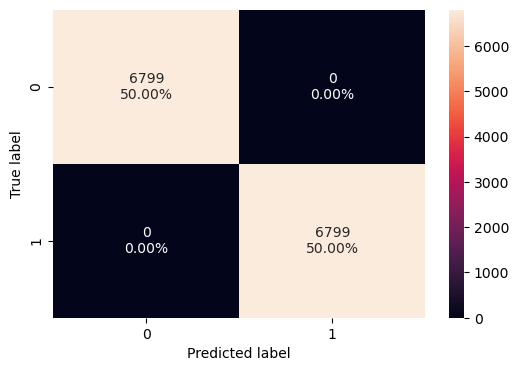

In [183]:
# creating confusion matrix
confusion_matrix_sklearn(rf_over, X_train_over, y_train_over)

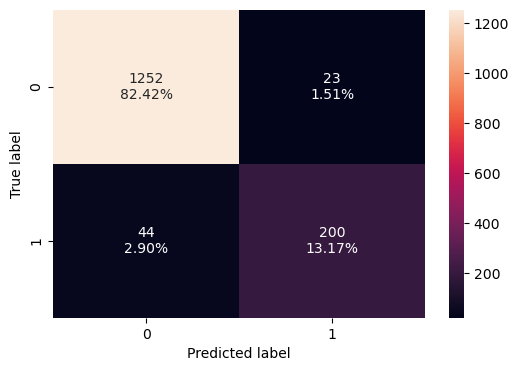

In [184]:
# creating confusion matrix
confusion_matrix_sklearn(rf_over, X_val, y_val)

In [185]:
# Calculating different metrics on train set
rf_over_train = model_performance_classification_sklearn(
    rf_over, X_train_over, y_train_over
)
print("Training performance:")
rf_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [186]:
# Calculating different metrics on train set
rf_over_val = model_performance_classification_sklearn(
    rf_over, X_val, y_val
)
print("Validation performance:")
rf_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.956,0.820,0.897,0.857


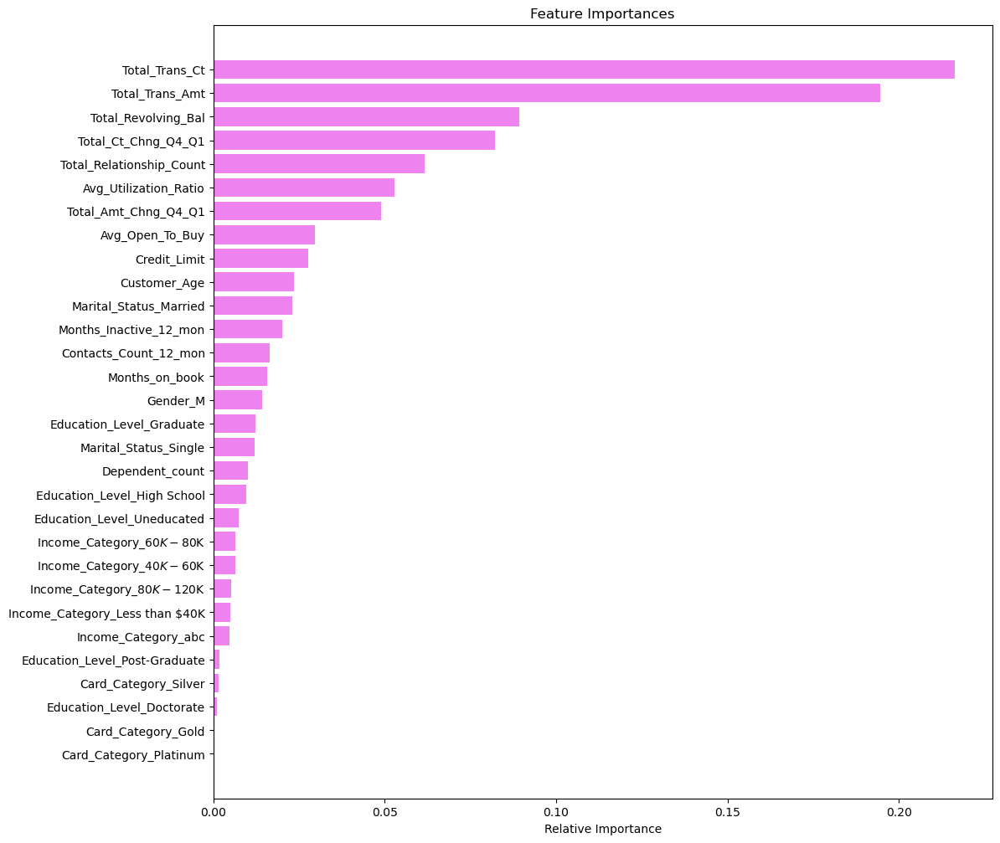

In [187]:
importances = rf_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Bagging Classifier Oversampling data

In [188]:
bagging_over= BaggingClassifier(random_state=1)
bagging_over.fit(X_train_over,y_train_over)

BaggingClassifier(random_state=1)

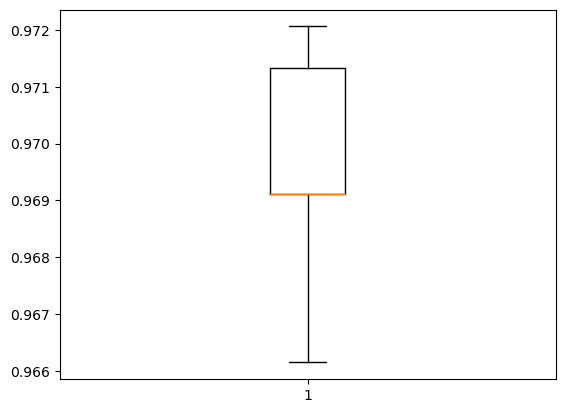

In [189]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

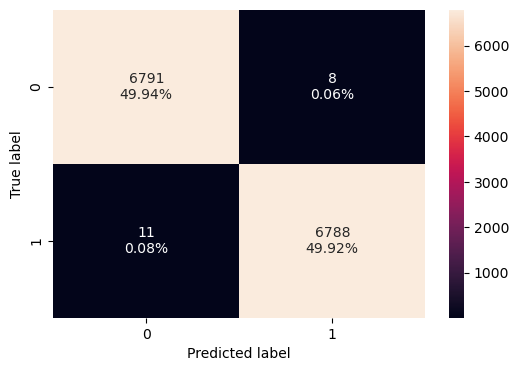

In [190]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_over, X_train_over, y_train_over)

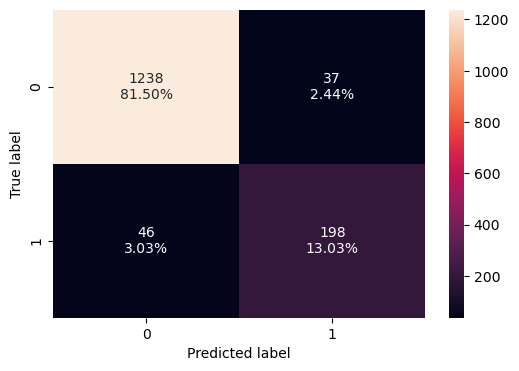

In [191]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_over, X_val, y_val)

In [192]:
# Calculating different metrics on train set
bagging_over_train = model_performance_classification_sklearn(
    bagging_over, X_train_over, y_train_over
)
print("Training performance:")
bagging_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.999,0.998,0.999,0.999


In [193]:
# Calculating different metrics on train set
bagging_over_val = model_performance_classification_sklearn(
    bagging_over, X_val, y_val
)
print("Validation performance:")
bagging_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.945,0.811,0.843,0.827


### Ada Booster Oversampling data

In [194]:
abc_over = AdaBoostClassifier(random_state=1)
abc_over.fit(X_train_over,y_train_over)

AdaBoostClassifier(random_state=1)

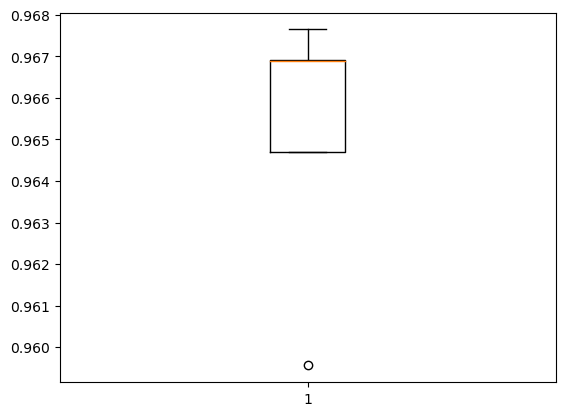

In [195]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=abc_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

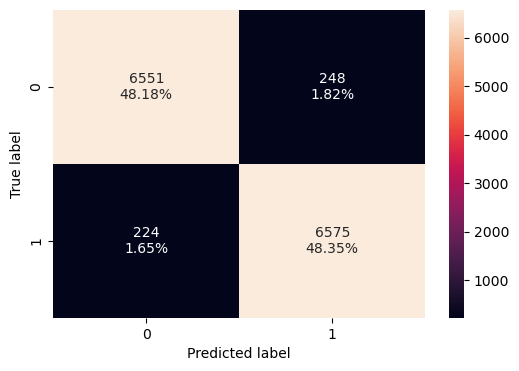

In [196]:
# creating confusion matrix
confusion_matrix_sklearn(abc_over, X_train_over, y_train_over)

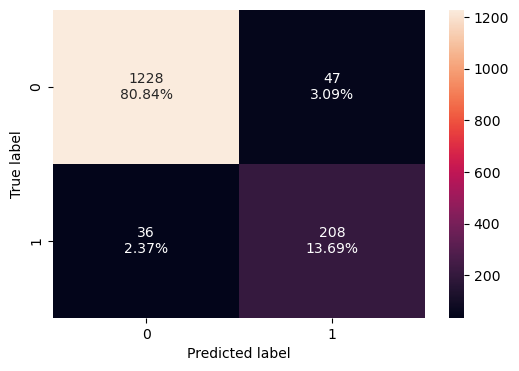

In [197]:
# creating confusion matrix
confusion_matrix_sklearn(abc_over, X_val, y_val)

In [198]:
# Calculating different metrics on train set
abc_over_train = model_performance_classification_sklearn(
    abc_over, X_train_over, y_train_over
)
print("Training performance:")
abc_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.965,0.967,0.964,0.965


In [199]:
# Calculating different metrics on train set
abc_over_val = model_performance_classification_sklearn(
    abc_over, X_val, y_val
)
print("Validation performance:")
abc_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.945,0.852,0.816,0.834


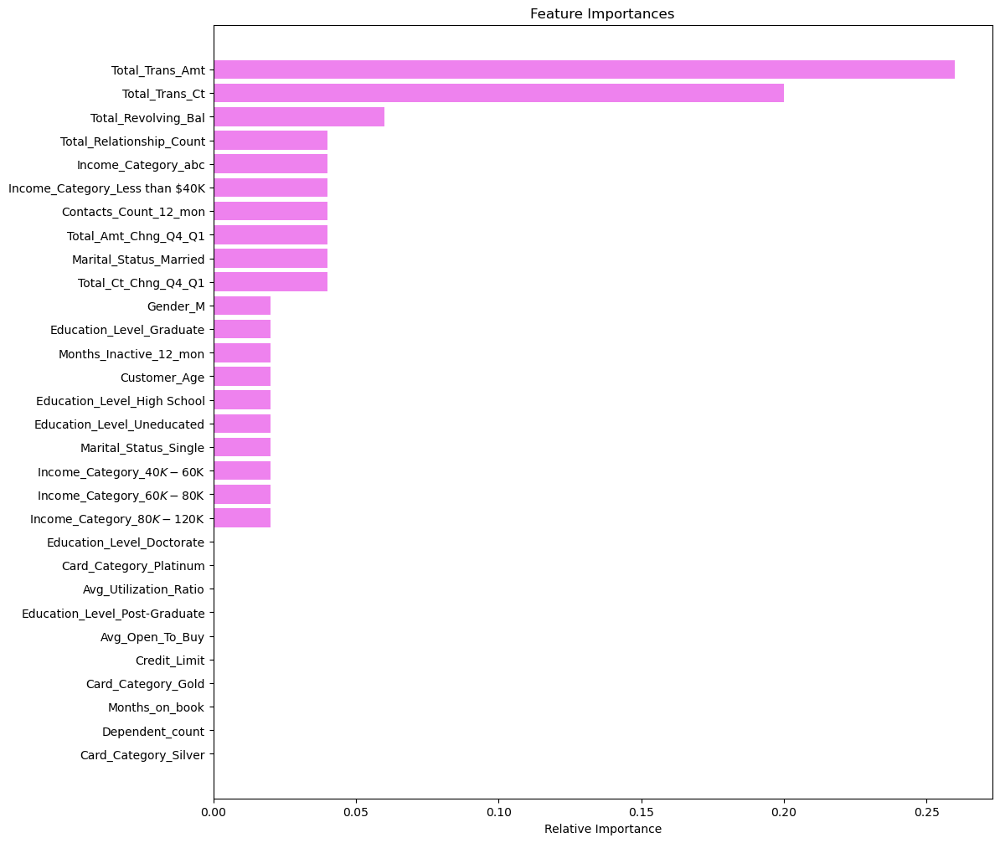

In [200]:
importances = abc_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Gradient Booster Oversampling

In [201]:
gbc_over = GradientBoostingClassifier(random_state=1)
gbc_over.fit(X_train_over,y_train_over)

GradientBoostingClassifier(random_state=1)

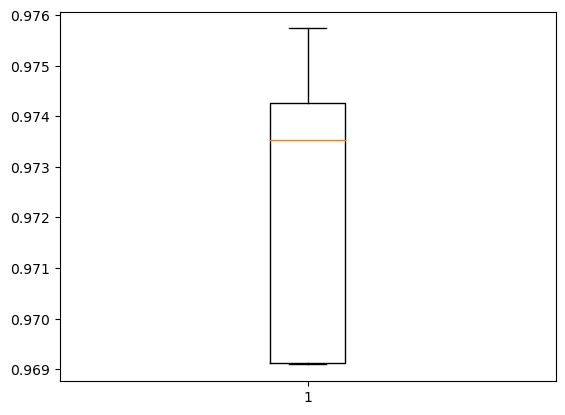

In [202]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

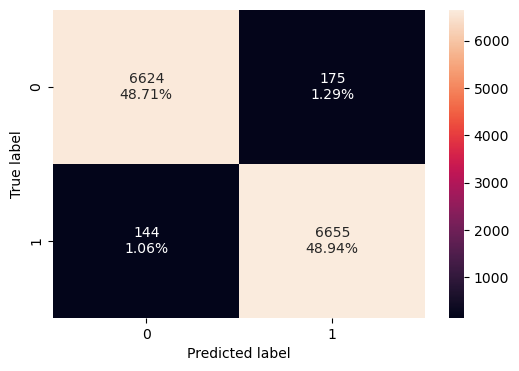

In [203]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_over, X_train_over, y_train_over)

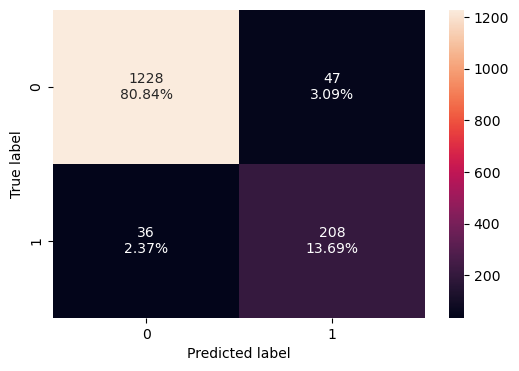

In [204]:
# creating confusion matrix
confusion_matrix_sklearn(abc_over, X_val, y_val)

In [205]:
# Calculating different metrics on train set
gbc_over_train = model_performance_classification_sklearn(
    gbc_over, X_train_over, y_train_over
)
print("Training performance:")
gbc_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.977,0.979,0.974,0.977


In [206]:
# Calculating different metrics on train set
gbc_over_val = model_performance_classification_sklearn(
    gbc_over, X_val, y_val
)
print("Validation performance:")
gbc_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.951,0.861,0.840,0.850


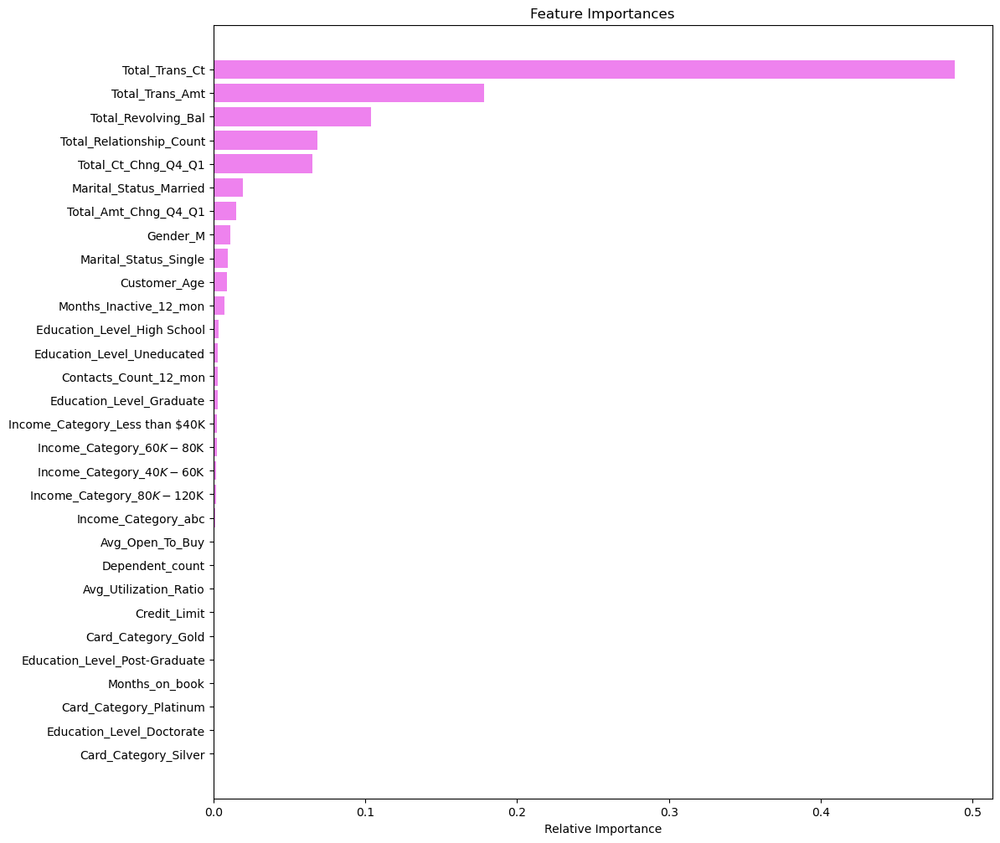

In [207]:
importances = gbc_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### XG Boost Oversampling data

In [208]:
xgb_over = XGBClassifier(random_state=1,eval_metric='logloss')
xgb_over.fit(X_train_over, y_train_over)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

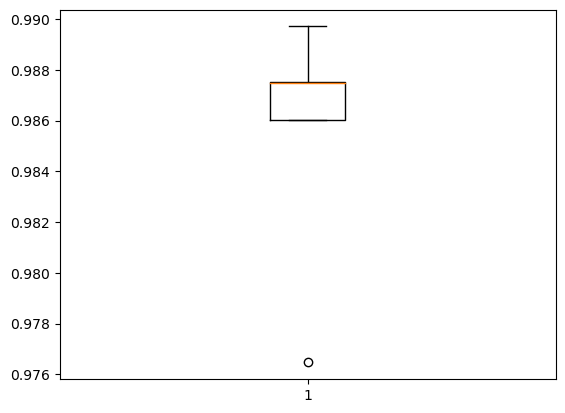

In [209]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb_over, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

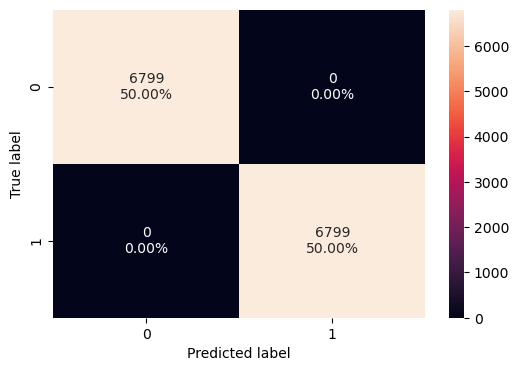

In [210]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_over, X_train_over, y_train_over)

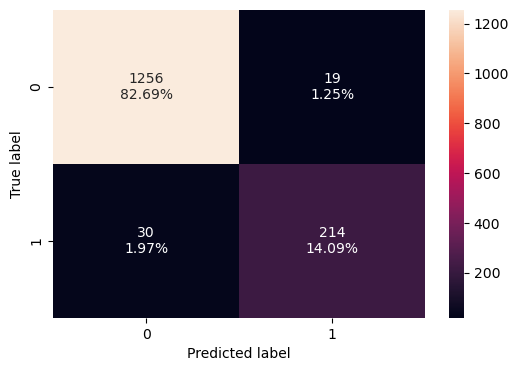

In [211]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_over, X_val, y_val)

In [212]:
# Calculating different metrics on train set
xgb_over_train = model_performance_classification_sklearn(
    xgb_over, X_train_over, y_train_over
)
print("Training performance:")
xgb_over_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [213]:
# Calculating different metrics on train set
xgb_over_val = model_performance_classification_sklearn(
    xgb_over, X_val, y_val
)
print("Validation performance:")
xgb_over_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.968,0.877,0.918,0.897


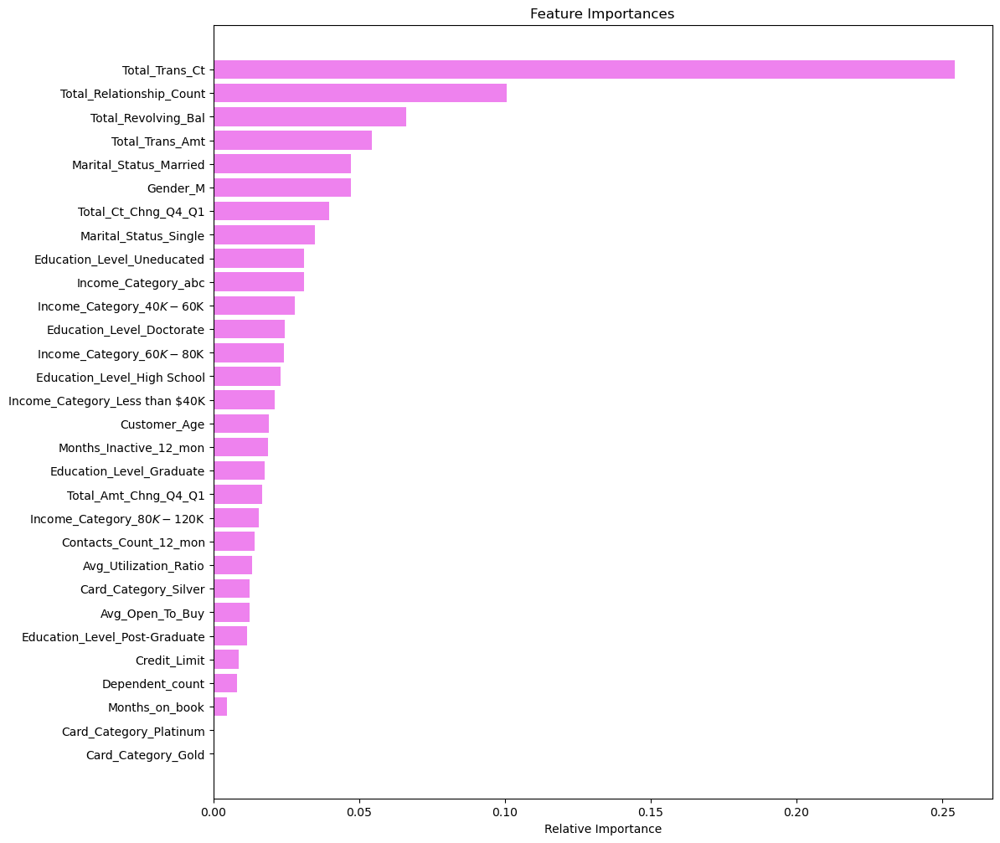

In [214]:
importances = xgb_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

## Undersampling

In [215]:
rus = RandomUnderSampler(random_state=1)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)

In [216]:
print("Before Undersampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Undersampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Undersampling, counts of label 'Yes': {}".format(sum(y_train_under == 1)))
print("After Undersampling, counts of label 'No': {} \n".format(sum(y_train_under == 0)))

print("After Undersampling, the shape of train_X: {}".format(X_train_under.shape))
print("After Undersampling, the shape of train_y: {} \n".format(y_train_under.shape))

Before Undersampling, counts of label 'Yes': 1302
Before Undersampling, counts of label 'No': 6799 

After Undersampling, counts of label 'Yes': 1302
After Undersampling, counts of label 'No': 1302 

After Undersampling, the shape of train_X: (2604, 30)
After Undersampling, the shape of train_y: (2604,) 



### Logistic Regression

In [217]:
lr_under = LogisticRegression(random_state=1)

# Training the basic logistic regression model with training set
lr_under.fit(X_train_under, y_train_under)

LogisticRegression(random_state=1)

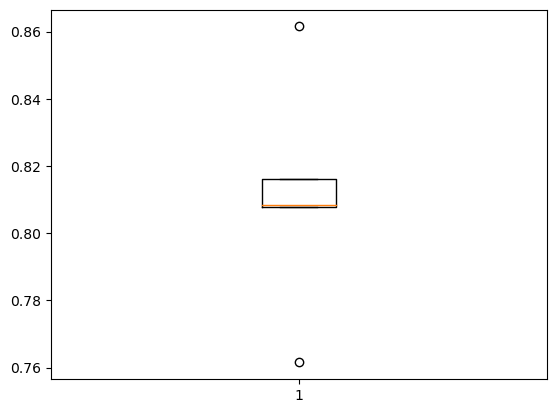

In [218]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=lr_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

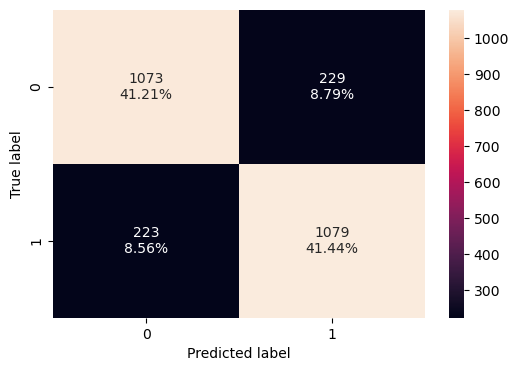

In [219]:
# creating confusion matrix
confusion_matrix_sklearn(lr_under, X_train_under, y_train_under)

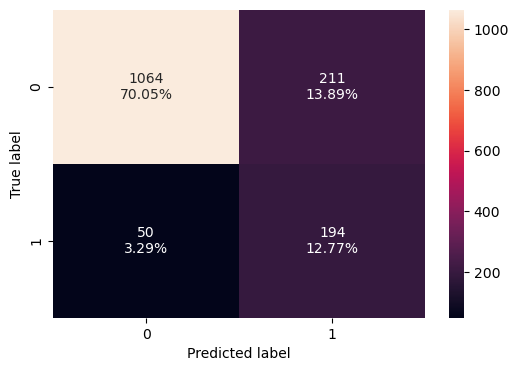

In [220]:
# creating confusion matrix
confusion_matrix_sklearn(lr_under, X_val, y_val)

In [221]:
# Calculating different metrics on train set
lr_under_train = model_performance_classification_sklearn(
    lr_under, X_train_under, y_train_under
)
print("Training performance:")
lr_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.826,0.829,0.825,0.827


In [222]:
# Calculating different metrics on train set
lr_under_val = model_performance_classification_sklearn(
    lr_under, X_val, y_val
)
print("Validation performance:")
lr_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.828,0.795,0.479,0.598


### Decision Tree Undersampling

In [223]:
#Fitting the model
dtree_under = DecisionTreeClassifier(random_state=1)
dtree_under.fit(X_train_under,y_train_under)

DecisionTreeClassifier(random_state=1)

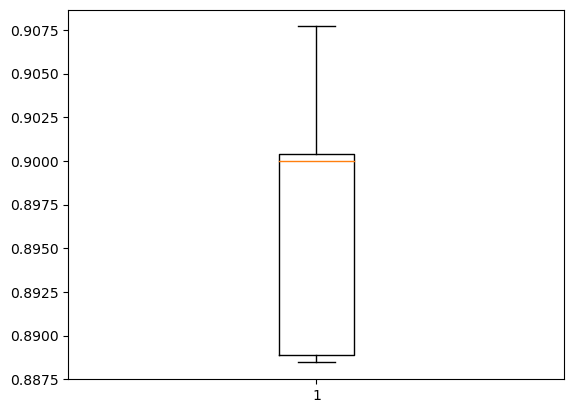

In [224]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=dtree_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

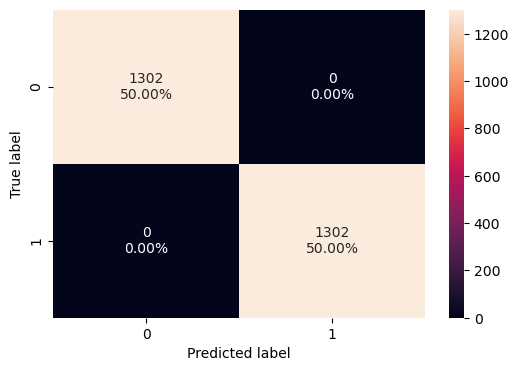

In [225]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_under, X_train_under, y_train_under)

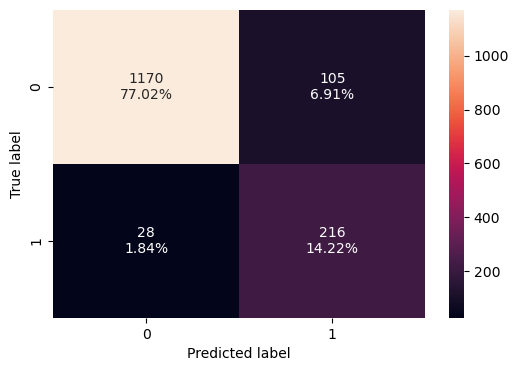

In [226]:
# creating confusion matrix
confusion_matrix_sklearn(dtree_under, X_val, y_val)

In [227]:
# Calculating different metrics on train set
dtree_under_train = model_performance_classification_sklearn(
    dtree_under, X_train_under, y_train_under
)
print("Training performance:")
dtree_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [228]:
# Calculating different metrics on train set
dtree_under_val = model_performance_classification_sklearn(
    dtree_under, X_val, y_val
)
print("Validation performance:")
dtree_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.912,0.885,0.673,0.765


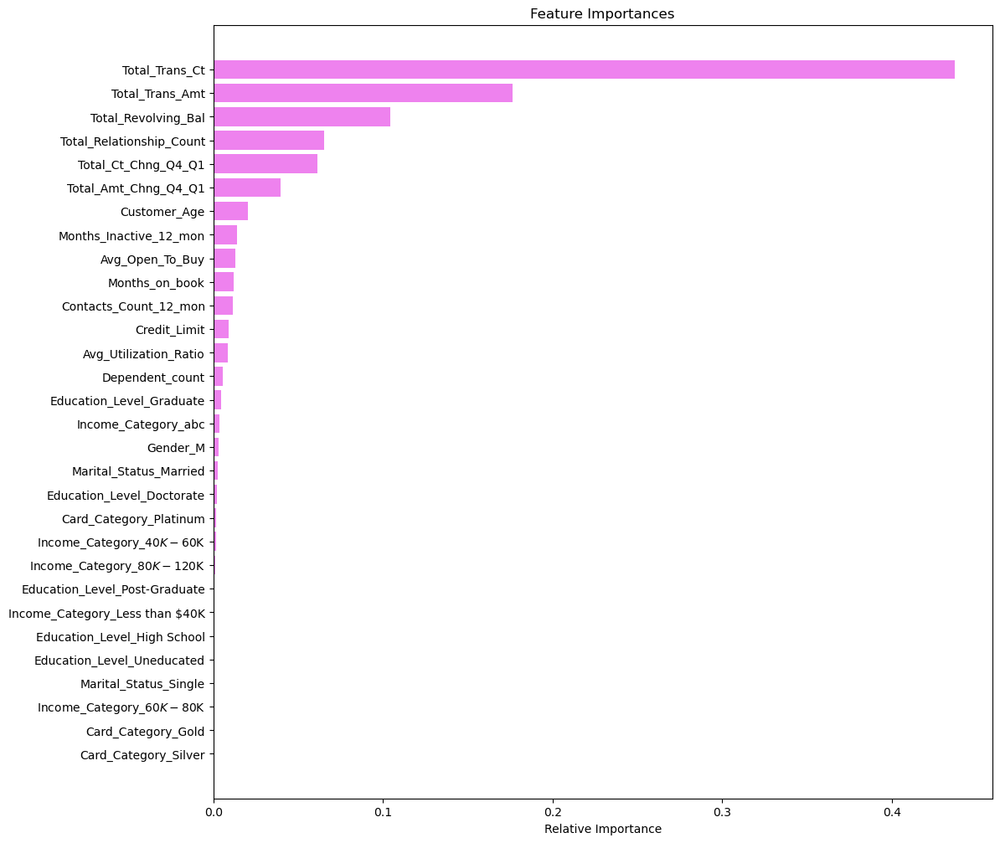

In [229]:
importances = dtree_under.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

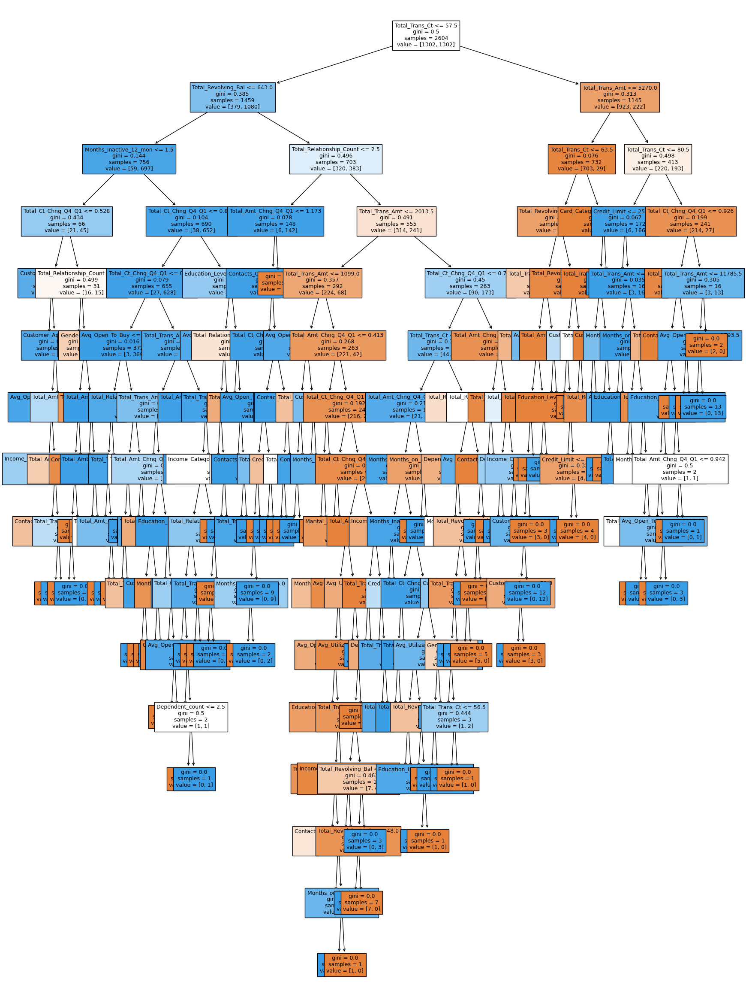

In [230]:
plt.figure(figsize=(20, 30))
out = tree.plot_tree(
    dtree_under,
    feature_names=feature_names,
    filled=True,
    fontsize=9,
    node_ids=False,
    class_names=None,
)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor("black")
        arrow.set_linewidth(1)
plt.show()

### Random Forest Model Undersampling data

In [231]:
rf_under = RandomForestClassifier(random_state=1)
rf_under.fit(X_train_under,y_train_under)

RandomForestClassifier(random_state=1)

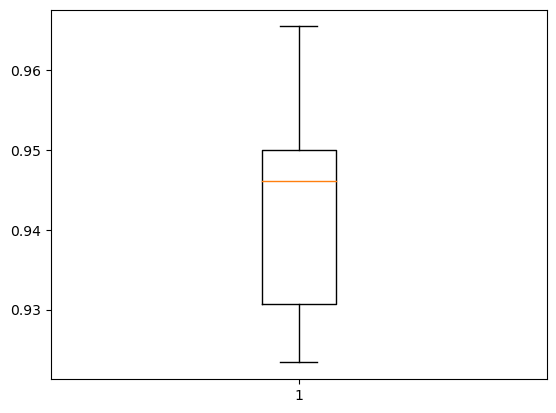

In [232]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=rf_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

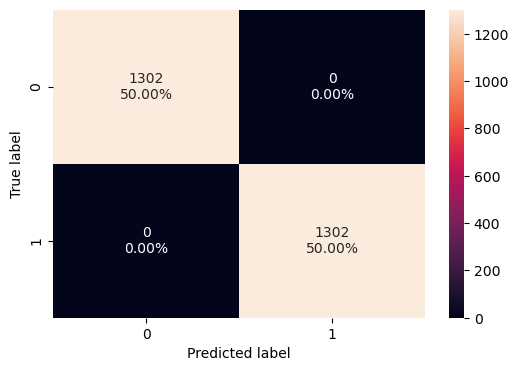

In [233]:
# creating confusion matrix
confusion_matrix_sklearn(rf_under, X_train_under, y_train_under)

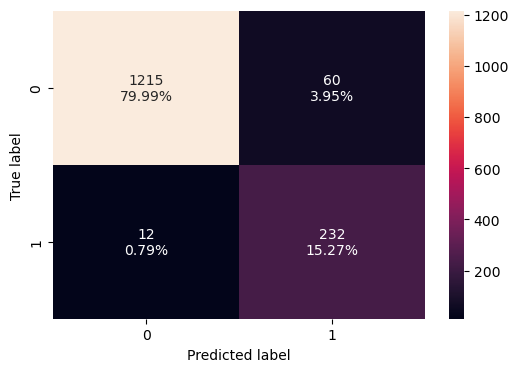

In [234]:
# creating confusion matrix
confusion_matrix_sklearn(rf_under, X_val, y_val)

In [235]:
# Calculating different metrics on train set
rf_under_train = model_performance_classification_sklearn(
    rf_under, X_train_under, y_train_under
)
print("Training performance:")
rf_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [236]:
# Calculating different metrics on train set
rf_under_val = model_performance_classification_sklearn(
    rf_under, X_val, y_val
)
print("Validation performance:")
rf_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.953,0.951,0.795,0.866


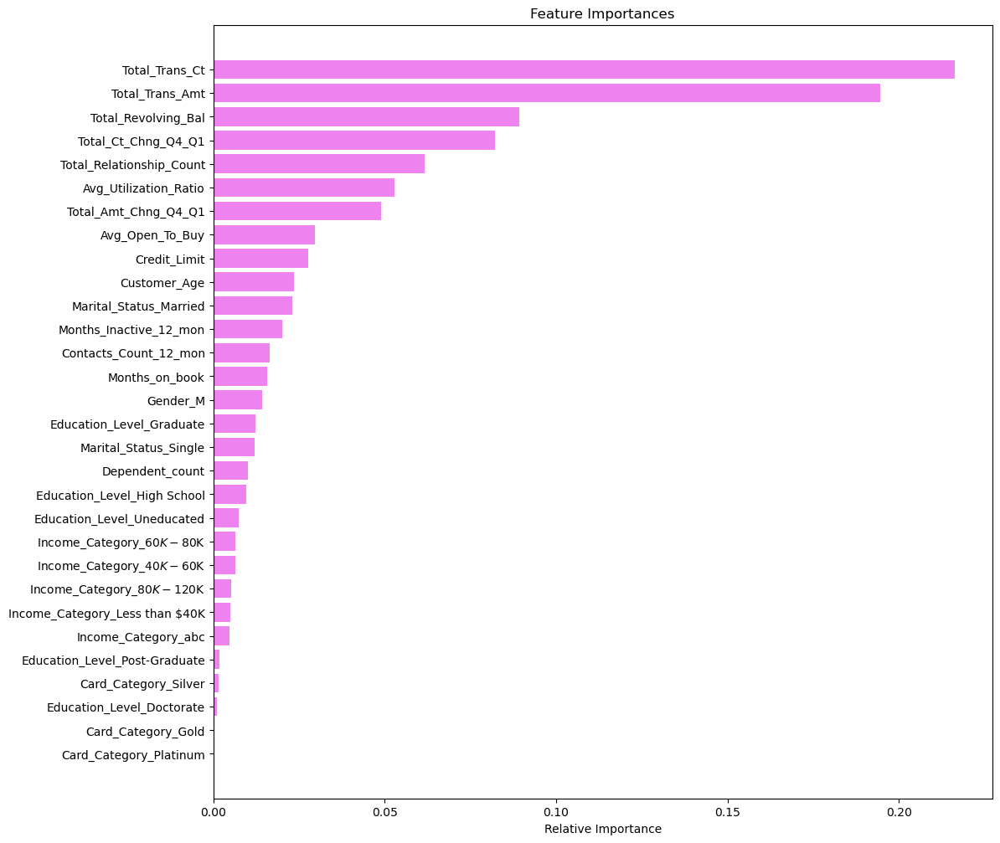

In [237]:
importances = rf_over.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Bagging Classifier Undersampling data

In [238]:
bagging_under= BaggingClassifier(random_state=1)
bagging_under.fit(X_train_under,y_train_under)

BaggingClassifier(random_state=1)

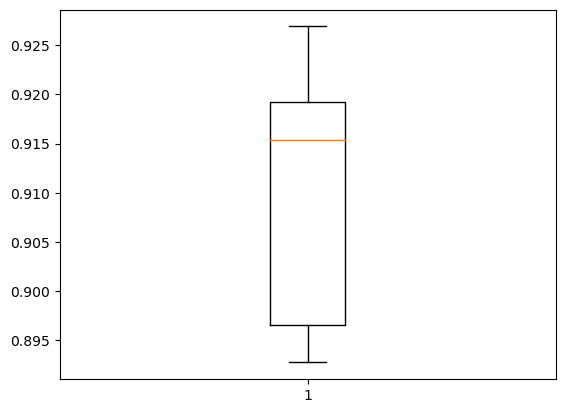

In [239]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

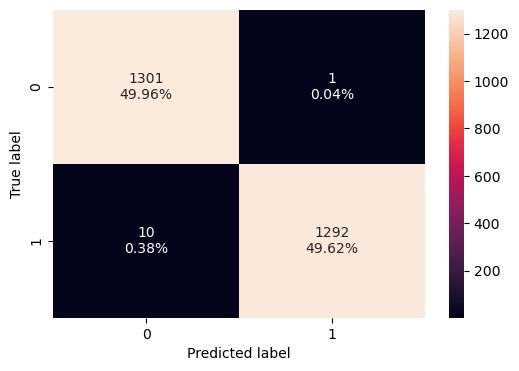

In [240]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_under, X_train_under, y_train_under)

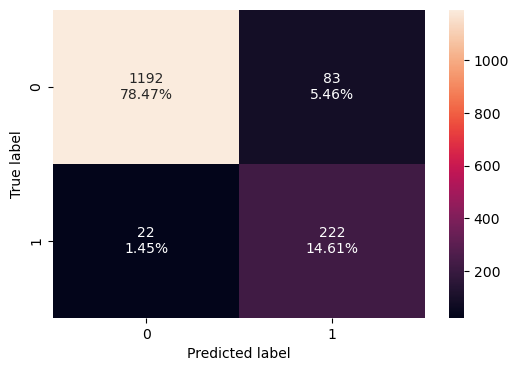

In [241]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_under, X_val, y_val)

In [242]:
# Calculating different metrics on train set
bagging_under_train = model_performance_classification_sklearn(
    bagging_under, X_train_under, y_train_under
)
print("Training performance:")
bagging_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.996,0.992,0.999,0.996


In [243]:
# Calculating different metrics on train set
bagging_under_val = model_performance_classification_sklearn(
    bagging_under, X_val, y_val
)
print("Validation performance:")
bagging_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.931,0.910,0.728,0.809


### Ada Booster Oversampling data

In [244]:
abc_under = AdaBoostClassifier(random_state=1)
abc_under.fit(X_train_under,y_train_under)

AdaBoostClassifier(random_state=1)

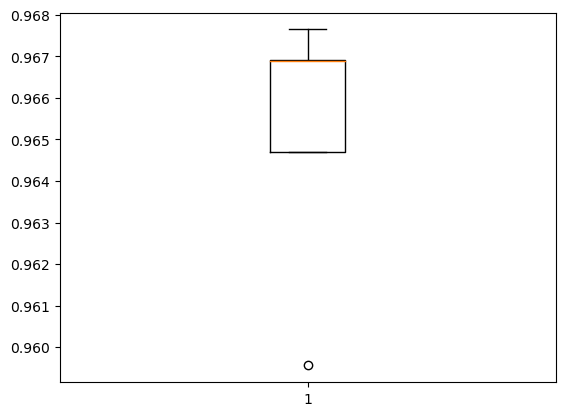

In [245]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=abc_under, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

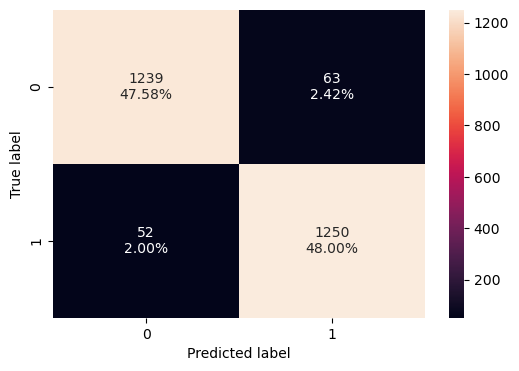

In [246]:
# creating confusion matrix
confusion_matrix_sklearn(abc_under, X_train_under, y_train_under)

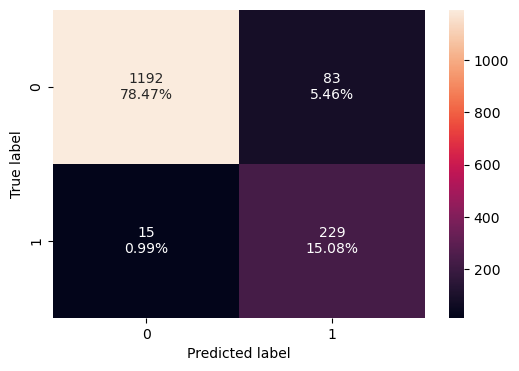

In [247]:
# creating confusion matrix
confusion_matrix_sklearn(abc_under, X_val, y_val)

In [248]:
# Calculating different metrics on train set
abc_under_train = model_performance_classification_sklearn(
    abc_under, X_train_under, y_train_under
)
print("Training performance:")
abc_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.956,0.960,0.952,0.956


In [249]:
# Calculating different metrics on train set
abc_under_val = model_performance_classification_sklearn(
    abc_under, X_val, y_val
)
print("Validation performance:")
abc_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.935,0.939,0.734,0.824


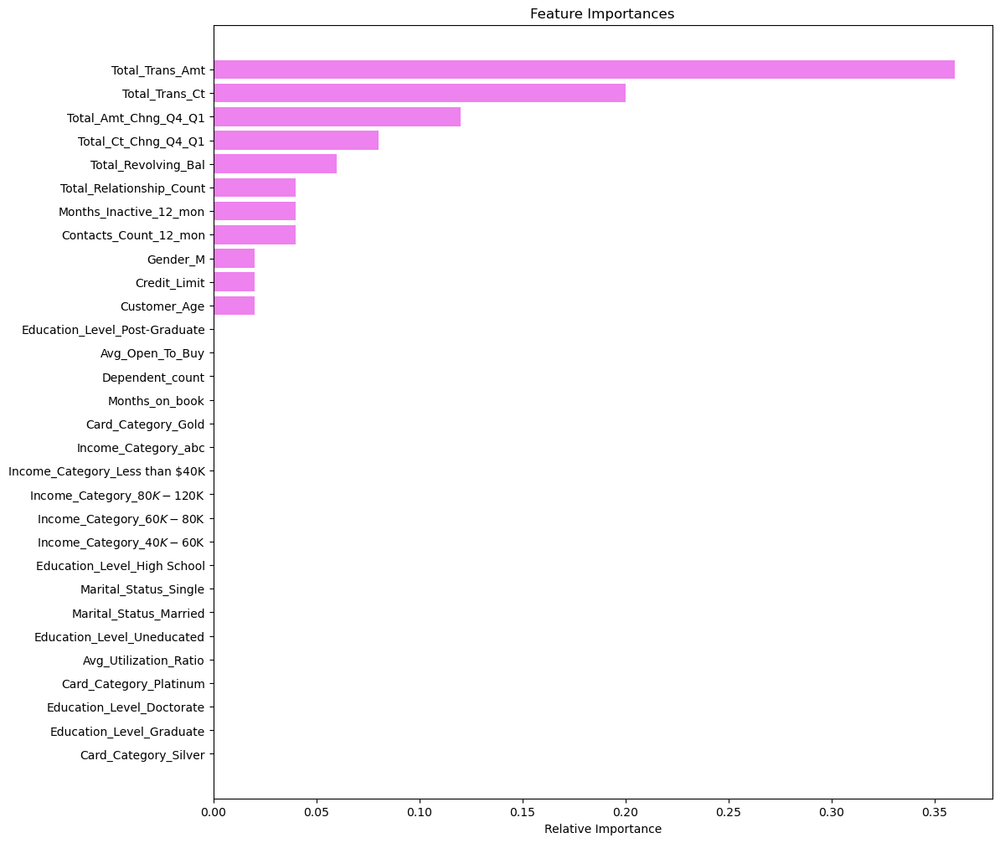

In [250]:
importances = abc_under.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Gradient Booster Oversampling

In [251]:
gbc_under = GradientBoostingClassifier(random_state=1)
gbc_under.fit(X_train_under,y_train_under)

GradientBoostingClassifier(random_state=1)

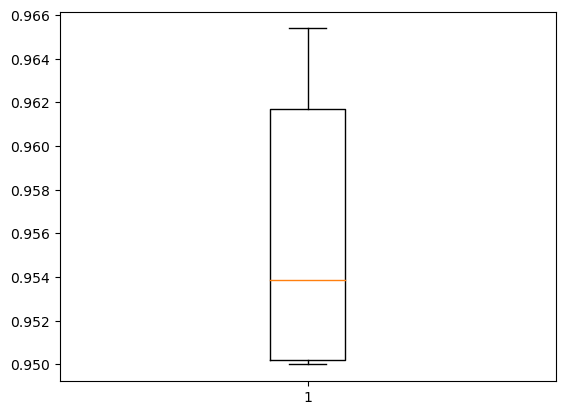

In [252]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

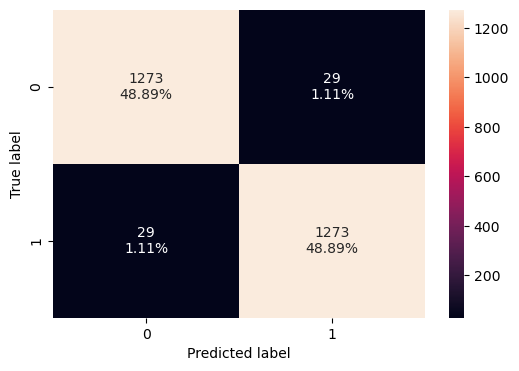

In [253]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_under, X_train_under, y_train_under)

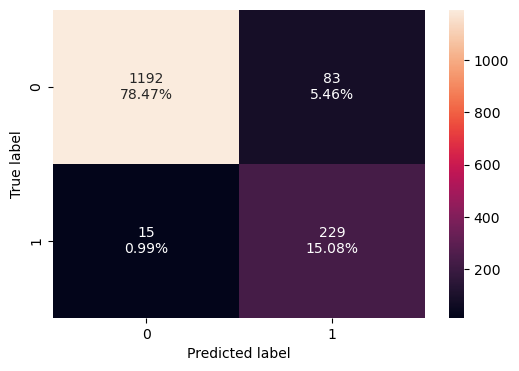

In [254]:
# creating confusion matrix
confusion_matrix_sklearn(abc_under, X_val, y_val)

In [255]:
# Calculating different metrics on train set
gbc_under_train = model_performance_classification_sklearn(
    gbc_under, X_train_under, y_train_under
)
print("Training performance:")
gbc_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.978,0.978,0.978,0.978


In [256]:
# Calculating different metrics on train set
gbc_under_val = model_performance_classification_sklearn(
    gbc_under, X_val, y_val
)
print("Validation performance:")
gbc_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.940,0.943,0.749,0.835


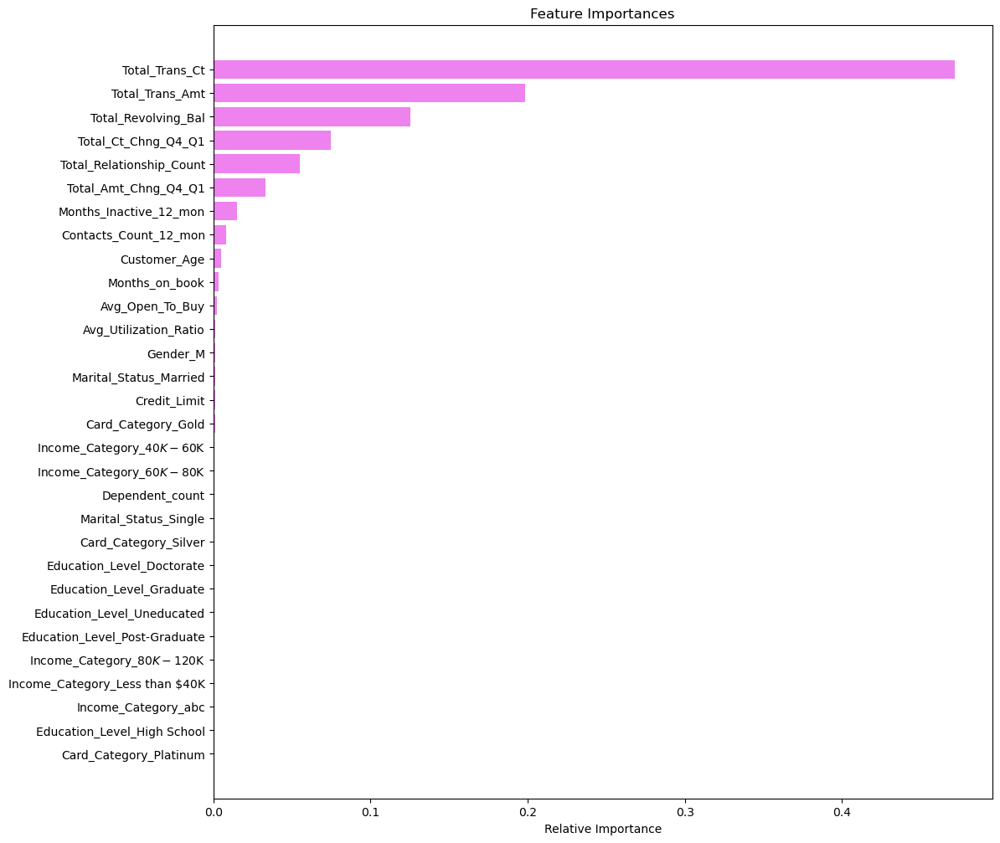

In [257]:
importances = gbc_under.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### XG Boost Oversampling data

In [258]:
xgb_under = XGBClassifier(random_state=1,eval_metric='logloss')
xgb_under.fit(X_train_under, y_train_under)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

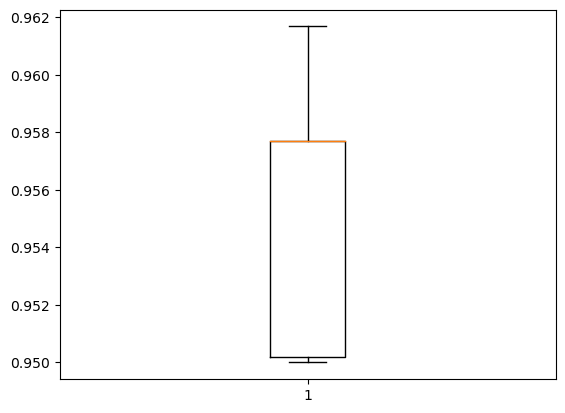

In [259]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb_under, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

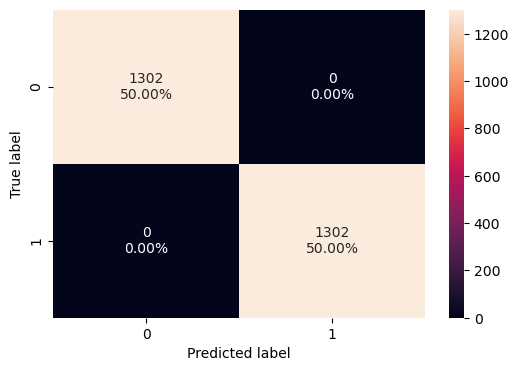

In [260]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_under, X_train_under, y_train_under)

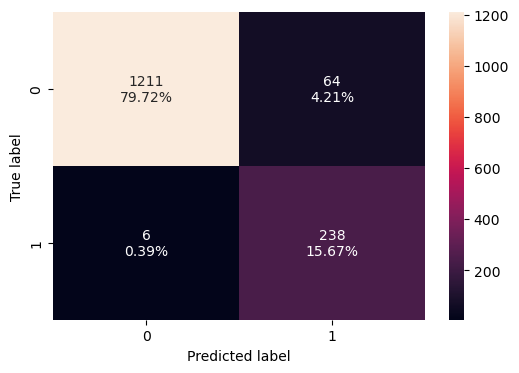

In [261]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_under, X_val, y_val)

In [262]:
# Calculating different metrics on train set
xgb_under_train = model_performance_classification_sklearn(
    xgb_under, X_train_under, y_train_under
)
print("Training performance:")
xgb_under_train

Training performance:


,Accuracy,Recall,Precision,F1
0,1.000,1.000,1.000,1.000


In [263]:
# Calculating different metrics on train set
xgb_under_val = model_performance_classification_sklearn(
    xgb, X_val, y_val
)
print("Validation performance:")
xgb_under_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.971,0.893,0.924,0.908


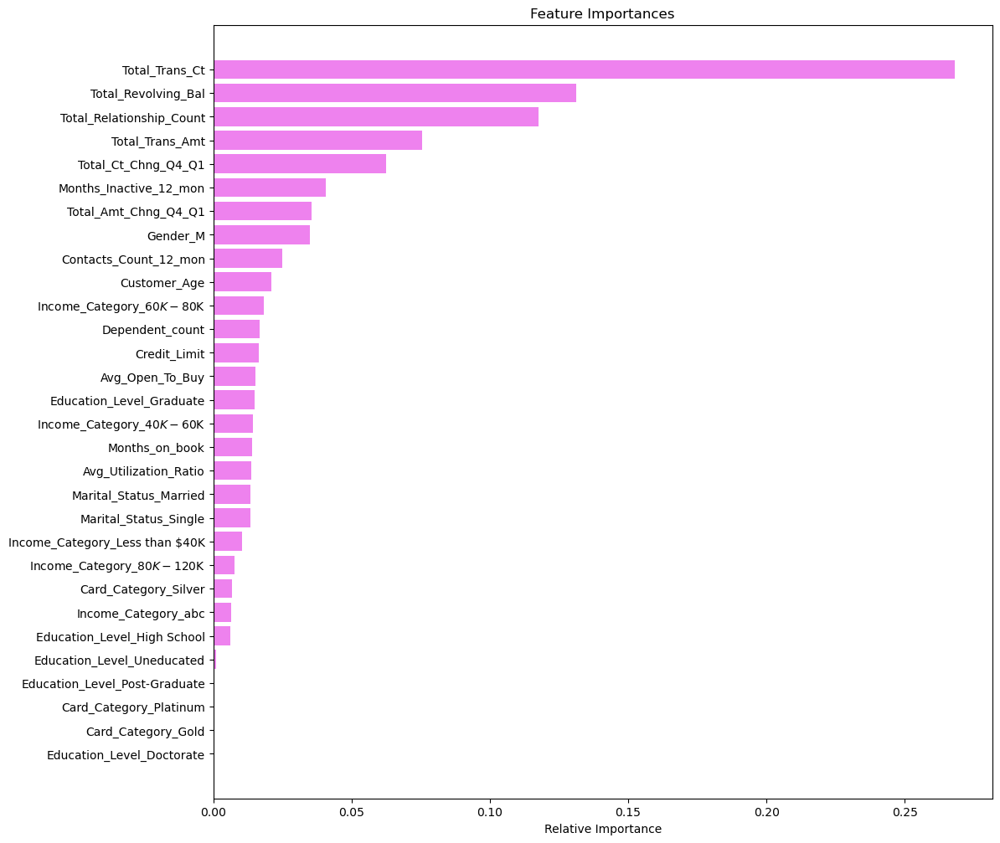

In [264]:
importances = xgb_under.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Model Comparisions on Validation data

In [265]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [
        lr_val.T,
        lr_over_val.T,
        lr_under_val.T,
        dtree_val.T,
        dtree_over_val.T,
        dtree_under_val.T,
        rf_val.T,
        rf_over_val.T,
        rf_under_val.T,
        bagging_val.T,
        bagging_over_val.T,
        bagging_under_val.T,
        abc_val.T,
        abc_over_val.T,
        abc_under_val.T,
        gbc_val.T,
        gbc_over_val.T,
        gbc_under_val.T,
        xgb_val.T,
        xgb_over_val.T,
        xgb_under_val.T,
    ],
    axis=1,
)
models_val_comp_df.columns = ['Logistic Regression default','Logistic Regression over', 'Logistic Regression under',
                                          'Decision tree default','Decision tree over', 'Decision tree under',
                                          'Random forest default','Random forest over', 'Random forest under',
                                          'Bagging default','Bagging over', 'Bagging under',
                                          'AdaBoost default','AdaBoost over', 'AdaBoost under', 
                                          'GBoost default','GBoost over', 'GBoost under',
                                          'XGBoost default','XGBoost over', 'XGBoost under', 
]
print("Validation performance comparison:")
models_val_comp_df.T

Validation performance comparison:


,Accuracy,Recall,Precision,F1
Logistic Regression default,0.907,0.553,0.804,0.655
Logistic Regression over,0.822,0.738,0.466,0.571
Logistic Regression under,0.828,0.795,0.479,0.598
Decision tree default,0.930,0.787,0.780,0.784
Decision tree over,0.930,0.816,0.765,0.790
Decision tree under,0.912,0.885,0.673,0.765
Random forest default,0.961,0.783,0.965,0.864
Random forest over,0.956,0.820,0.897,0.857
Random forest under,0.953,0.951,0.795,0.866
Bagging default,0.949,0.775,0.896,0.831


## Hyper Paramter Tuning using random search

Top (5) Classifiers based on the recall score

* Random forest under 95.1% 
* GBoost under 94.3%
* AdaBoost under 93.9%
* Bagging under 91.0%
* XGBoost under 89.3%


### Random forest hyperparameter tuning

In [266]:
%%time

# Choose the type of classifier. 
rf_under2 = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {"n_estimators": [150,200,250],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.2, 0.7, 0.1), 
    "max_samples": np.arange(0.3, 0.7, 0.1),
    "max_depth":np.arange(3,4,5),
    "class_weight" : ['balanced', 'balanced_subsample'],
    "min_impurity_decrease":[0.001, 0.002, 0.003]
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the random search
grid_obj = RandomizedSearchCV(rf_under2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
# using n_iter = 30, so randomized search will try 30 different combinations of hyperparameters
# by default, n_iter = 10

grid_obj = grid_obj.fit(X_train_under, y_train_under)

# Print the best combination of parameters
grid_obj.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Wall time: 15.1 s


{'n_estimators': 200,
 'min_samples_leaf': 7,
 'min_impurity_decrease': 0.001,
 'max_samples': 0.3,
 'max_features': 0.6000000000000001,
 'max_depth': 3,
 'class_weight': 'balanced_subsample'}

In [267]:
grid_obj.best_score_

0.9239522546419099

In [268]:
# Set the clf to the best combination of parameters
rf_under_tuned = RandomForestClassifier(
    class_weight="balanced_subsample",
    max_features=0.6000000000000001,
    max_samples=0.3,
    min_samples_leaf=7,
    n_estimators=200,
    random_state=1,
    max_depth=3,
    min_impurity_decrease=0.001,
)

# Fit the best algorithm to the data.
rf_under_tuned.fit(X_train_under, y_train_under)

RandomForestClassifier(class_weight='balanced_subsample', max_depth=3,
                       max_features=0.6000000000000001, max_samples=0.3,
                       min_impurity_decrease=0.001, min_samples_leaf=7,
                       n_estimators=200, random_state=1)

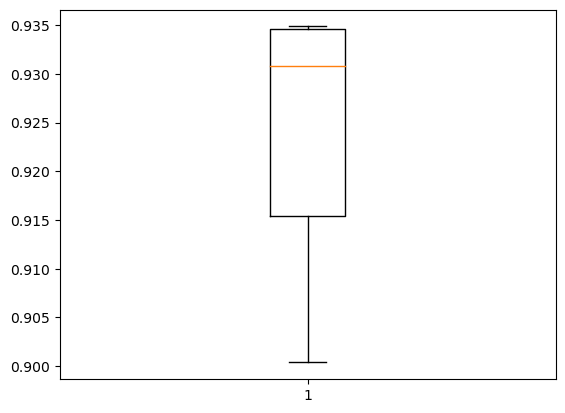

In [269]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=rf_under_tuned, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

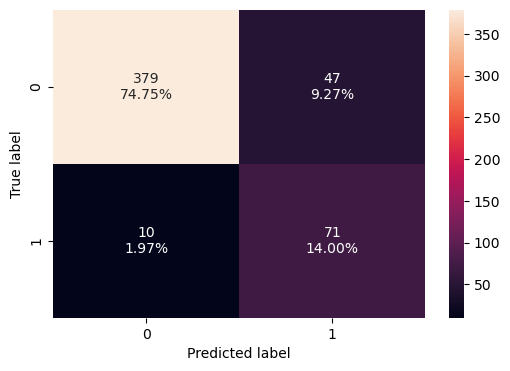

In [270]:
# creating confusion matrix
confusion_matrix_sklearn(rf_under_tuned, X_test, y_test)

In [271]:
# Calculating different metrics on train set
rf_under_tuned_test = model_performance_classification_sklearn(
    rf_under_tuned, X_test, y_test
)
print("Testing performance:")
rf_under_tuned_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.888,0.877,0.602,0.714


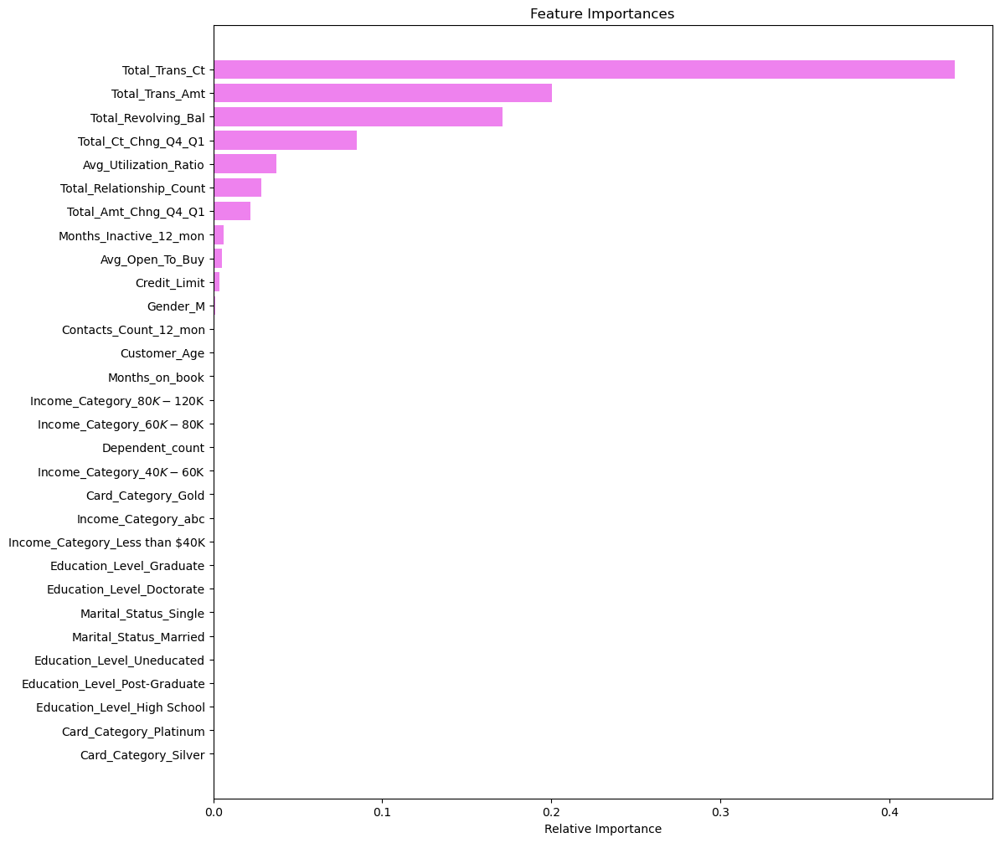

In [272]:
importances = rf_under_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Gradient Boost Hyperparamter Tuning

In [273]:
# Choose the type of classifier. 
gbc_under2 = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = RandomizedSearchCV(gbc_under2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
grid_obj = grid_obj.fit(X_train_under, y_train_under)


# Print the best combination of parameters
grid_obj.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits


{'subsample': 0.9, 'n_estimators': 250, 'max_features': 0.9}

In [274]:
grid_obj.best_score_

0.9646566460359564

In [275]:
# Set the clf to the best combination of parameters
gbc_under_tuned = GradientBoostingClassifier(
    subsample=0.9,
    n_estimators=250,
    max_features = 0.9
   
)

# Fit the best algorithm to the data.
gbc_under_tuned.fit(X_train_under, y_train_under)

GradientBoostingClassifier(max_features=0.9, n_estimators=250, subsample=0.9)

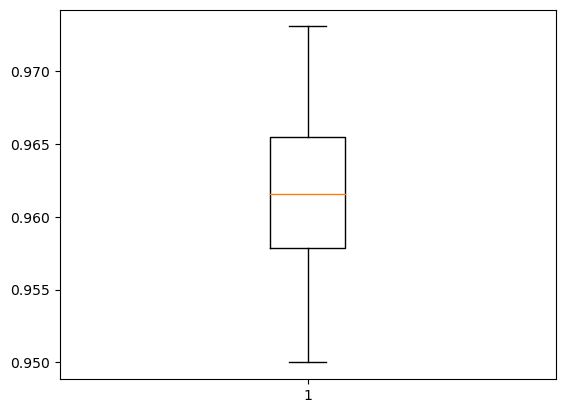

In [276]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=gbc_under_tuned, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

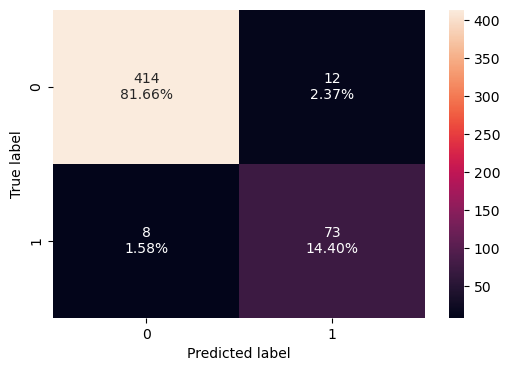

In [277]:
# creating confusion matrix
confusion_matrix_sklearn(gbc_under_tuned, X_test, y_test)

In [278]:
# Calculating different metrics on train set
gbc_under_tuned_test = model_performance_classification_sklearn(
    gbc_under_tuned, X_test, y_test
)
print("Testing performance:")
gbc_under_tuned_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.961,0.901,0.859,0.880


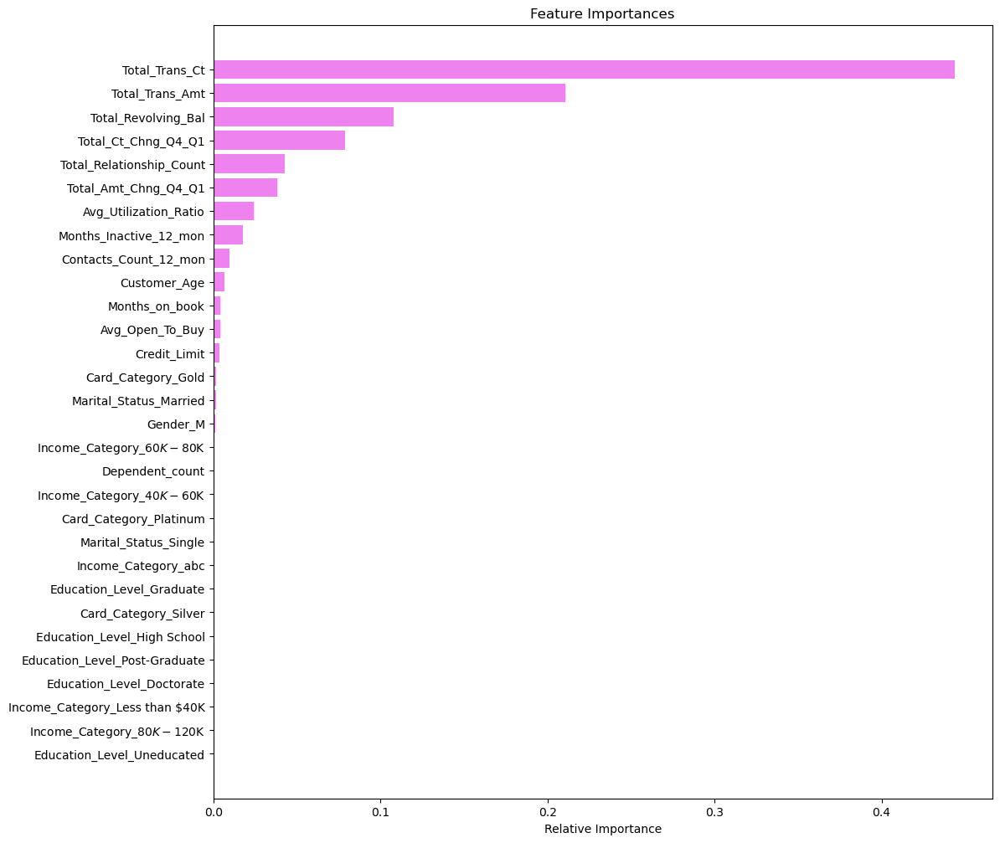

In [279]:
importances = gbc_under_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Ada boost hyperparameter tuning

In [280]:
%%time

abc_under2 = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1, random_state=1),DecisionTreeClassifier(max_depth=2, random_state=1),DecisionTreeClassifier(max_depth=3, random_state=1)],
    "n_estimators": np.arange(10,110,10),
    "learning_rate":np.arange(0.1,2,0.1)
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = RandomizedSearchCV(abc_under2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
grid_obj = grid_obj.fit(X_train_under, y_train_under)

# Print the best combination of parameters
grid_obj.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Wall time: 6.85 s


{'n_estimators': 80,
 'learning_rate': 0.7000000000000001,
 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)}

In [281]:
grid_obj.best_score_

0.9562245800176834

In [282]:
# Set the clf to the best combination of parameters
abc_under_tuned = AdaBoostClassifier(
    learning_rate=0.7000000000000001,
    n_estimators=80,
    base_estimator = DecisionTreeClassifier(max_depth=2, random_state=1),
)

# Fit the best algorithm to the data.
abc_under_tuned.fit(X_train_under, y_train_under)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         random_state=1),
                   learning_rate=0.7000000000000001, n_estimators=80)

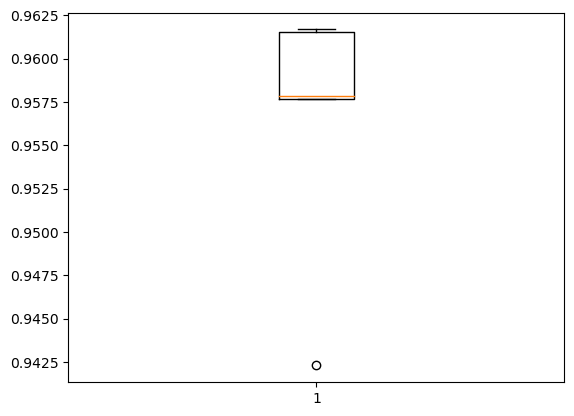

In [283]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=abc_under_tuned, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

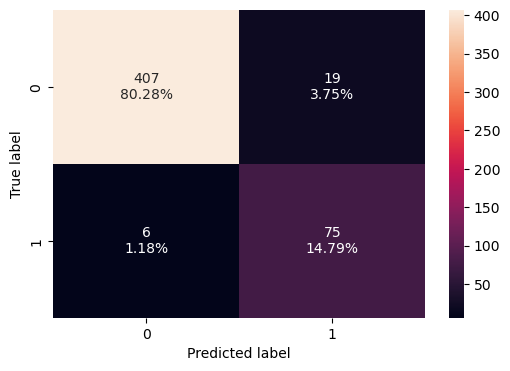

In [284]:
# creating confusion matrix
confusion_matrix_sklearn(abc_under_tuned, X_test, y_test)

In [285]:
# Calculating different metrics on train set
abc_under_tuned_test = model_performance_classification_sklearn(
    abc_under_tuned, X_test, y_test
)
print("Testing performance:")
abc_under_tuned_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.951,0.926,0.798,0.857


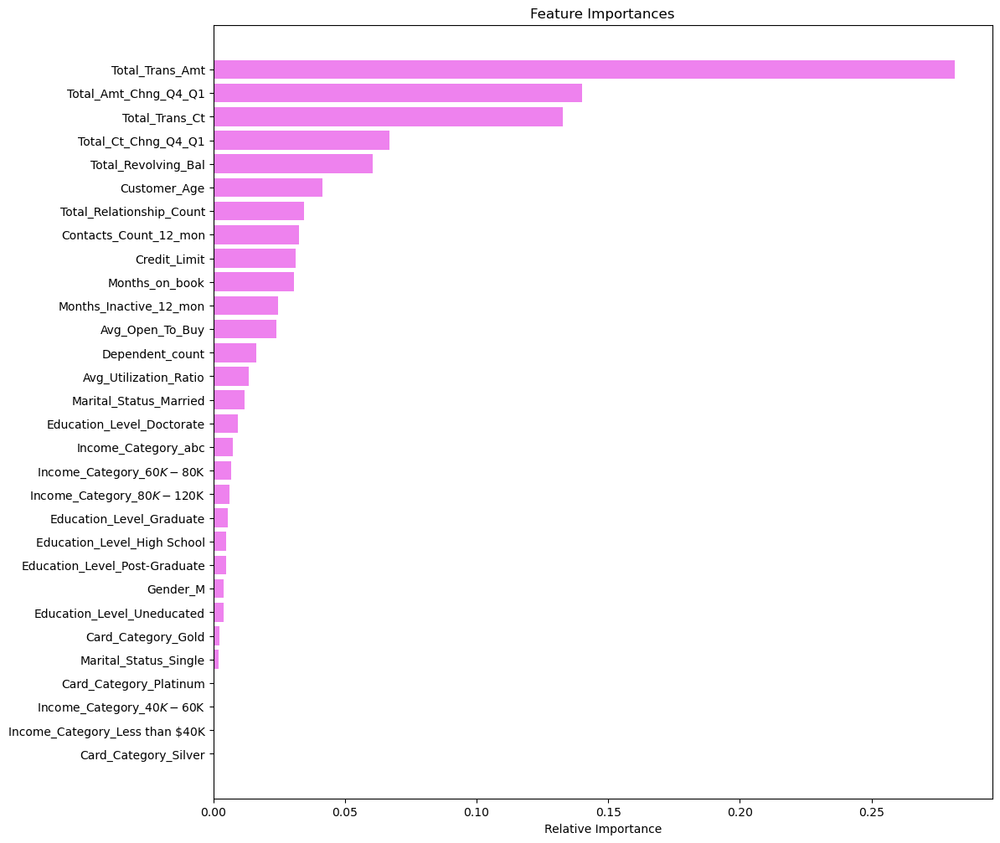

In [286]:
importances = abc_under_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### XG Boost Hyperparameter tuning

In [287]:
# Choose the type of classifier. 
xgb_under2 = XGBClassifier(random_state=1,eval_metric='logloss')

# Grid of parameters to choose from
## add from
parameters = {
    "n_estimators": np.arange(10,100,20),
    "scale_pos_weight":[0,1,2,5],
    "subsample":[0.5,0.7,0.9,1],
    "learning_rate":[0.01,0.1,0.2,0.05],
    "gamma":[0,1,3],
    "colsample_bytree":[0.5,0.7,0.9,1],
    "colsample_bylevel":[0.5,0.7,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = RandomizedSearchCV(xgb_under2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
grid_obj = grid_obj.fit(X_train, y_train)

# Print the best combination of parameters
grid_obj.best_params_


Fitting 5 folds for each of 30 candidates, totalling 150 fits


{'subsample': 0.5,
 'scale_pos_weight': 5,
 'n_estimators': 50,
 'learning_rate': 0.1,
 'gamma': 3,
 'colsample_bytree': 0.5,
 'colsample_bylevel': 0.9}

In [288]:
grid_obj.best_score_

0.9393309755378721

In [289]:
xgb_under_tuned = XGBClassifier(
    subsample = 0.5,
    scale_pos_weight = 5,
    n_estimators = 50,
    learning_rate = 0.1,
    gamma =  3,
    colsample_bytree = 0.5,
    colsample_bylevel = 0.9)

# Fit the best algorithm to the data.
xgb_under_tuned.fit(X_train_under, y_train_under)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=0.9, colsample_bynode=None,
              colsample_bytree=0.5, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=3, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

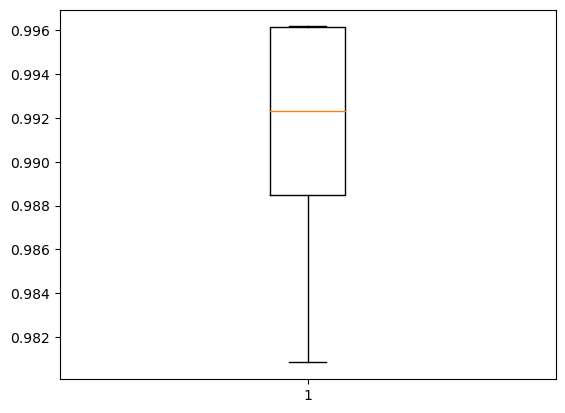

In [290]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=xgb_under_tuned, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

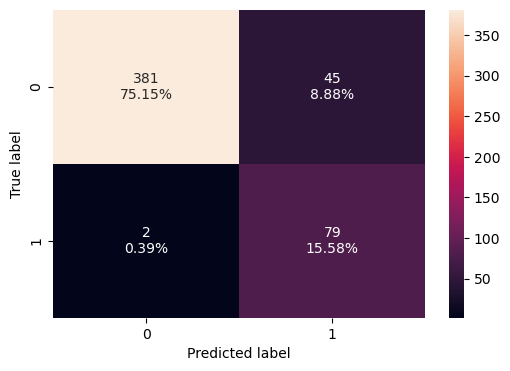

In [291]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_under_tuned, X_test, y_test)

In [292]:
# Calculating different metrics on train set
xgb_under_tuned_test = model_performance_classification_sklearn(
    xgb_under_tuned, X_test, y_test
)
print("Testing performance:")
xgb_under_tuned_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.907,0.975,0.637,0.771


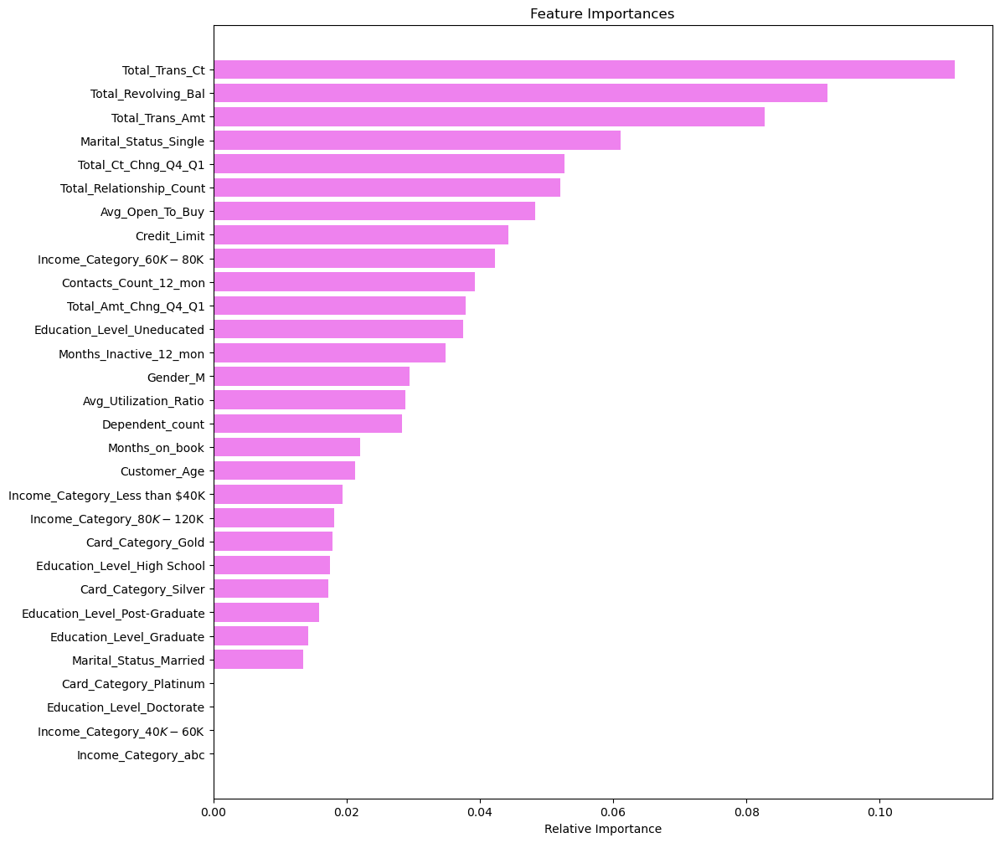

In [293]:
importances = xgb_under_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X_train.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Bagging Hyperparameter tuning

In [294]:
# Choose the type of classifier. 
bagging_under2 = BaggingClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = RandomizedSearchCV(xgb_under2, parameters,n_iter=30, scoring=acc_scorer,cv=5, random_state = 1, n_jobs = -1, verbose = 2)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
bagging_tuned = grid_obj.best_estimator_

# Print the best combination of parameters
grid_obj.best_params_

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[00:45:09] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-08de971ced8a8cdc6-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "max_features", "max_samples" } are not used.



{'n_estimators': 50, 'max_samples': 0.8, 'max_features': 1}

In [295]:
grid_obj.best_score_

0.884798113763631

In [296]:
bagging_under_tuned = BaggingClassifier(
    n_estimators = 50, 
    max_samples = 0.8, 
    max_features = 1)

# Fit the best algorithm to the data.
bagging_under_tuned.fit(X_train_under, y_train_under)

BaggingClassifier(max_features=1, max_samples=0.8, n_estimators=50)

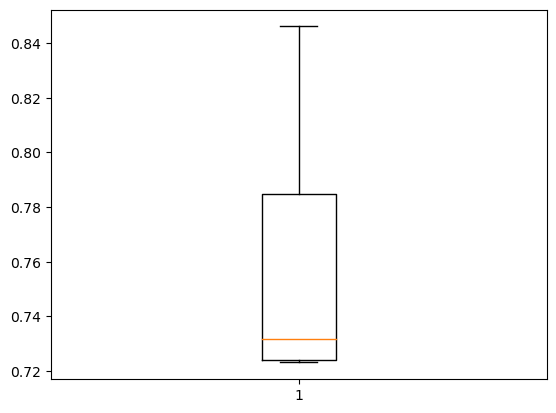

In [297]:
scoring = "recall"
kfold = StratifiedKFold(
    n_splits=5, shuffle=True, random_state=1
)  # Setting number of splits equal to 5
cv_result_bfr = cross_val_score(
    estimator=bagging_under_tuned, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
)
# Plotting boxplots for CV scores of model defined above
plt.boxplot(cv_result_bfr)
plt.show()

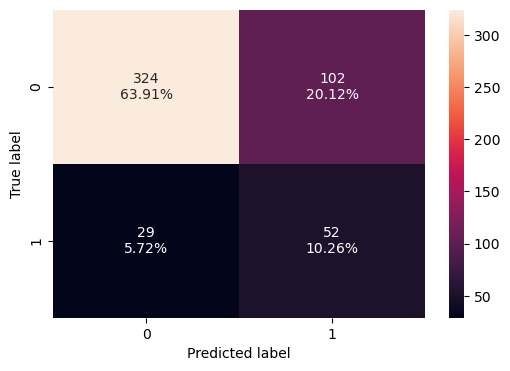

In [298]:
# creating confusion matrix
confusion_matrix_sklearn(bagging_under_tuned, X_test, y_test)

In [299]:
# Calculating different metrics on train set
bagging_under_tuned_test = model_performance_classification_sklearn(
    bagging_under_tuned, X_test, y_test
)
print("Testing performance:")
bagging_under_tuned_test

Testing performance:


,Accuracy,Recall,Precision,F1
0,0.742,0.642,0.338,0.443


## Comparision

In [300]:
# Validation performance comparison

models_test_comp_df = pd.concat(
    [
        rf_under_tuned_test.T,
        bagging_under_tuned_test.T,
        abc_under_tuned_test.T,
        gbc_under_tuned_test.T,
        xgb_under_tuned_test.T
    ],
    axis=1,
)

models_test_comp_df.columns = ['Random forest undersampling tuned',
                              'Bagging undersampling tuned',
                              'AdaBoost undersampling tuned',
                              'GBoost undersampling tuned',
                              'XGBoost undersampling tuned',
                             ]

print("Testing performance comparison:")
models_test_comp_df.T

Testing performance comparison:


,Accuracy,Recall,Precision,F1
Random forest undersampling tuned,0.888,0.877,0.602,0.714
Bagging undersampling tuned,0.742,0.642,0.338,0.443
AdaBoost undersampling tuned,0.951,0.926,0.798,0.857
GBoost undersampling tuned,0.961,0.901,0.859,0.880
XGBoost undersampling tuned,0.907,0.975,0.637,0.771


## Pipeline

###  Pipelines for productionizing the model 

In [301]:
# creating a list of numerical variables
numerical_features = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])


# creating a list of categorical variables
categorical_features = ["Gender", "Education_Level", "Marital_Status","Income_Category","Card_Category" ]

# creating a transformer for categorical variables, which will first apply simple imputer and 
#then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)
# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data 
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes


In [302]:
#Removing customer interaction data from independent variables
X = data1.drop(["Attrition_Flag"], axis=1)
Y = data1["Attrition_Flag"].apply(lambda x: 1 if x == "Attrited Customer" else 0)

In [303]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


In [304]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "XGB",
            XGBClassifier(
                subsample = 0.5,
                scale_pos_weight = 5,
                n_estimators = 50,
                learning_rate = 0.1,
                gamma =  3,
                colsample_bytree = 0.5,
                colsample_bylevel = 0.9
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Dependent_count',
                                                   'Months_on_book',
                                                   'Total_Relationship_Count',
                                                   'Months_Inactive_12_mon',
                                                   'Contacts_Count_12_mon',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                            

In [305]:
# transforming and predicting on test data
model.predict(X_test)

array([0, 1, 0, ..., 0, 0, 0])

###   SHAP (SHapley Additive exPlanations) 

* SHAP stands for SHapley Additive exPlanations.
* SHAP makes the sophisticated machine learning models easy to understand.
* We need to be sure of what our model is actually predicting, for that we have to take a closer look at each variable and SHAP open up the possibilities to explore which variables were intensely used by the model to make predictions. 
* It is a great tool to that tell us how each feature in the model has contributing to the predictions. 
* It helps in visualizing the relationships in the model

In [306]:
import shap

In [307]:
## Initialize the package
shap.initjs()

In [312]:
explainer = shap.TreeExplainer(xgb_under_tuned)
shap_values = explainer.shap_values(X_val)

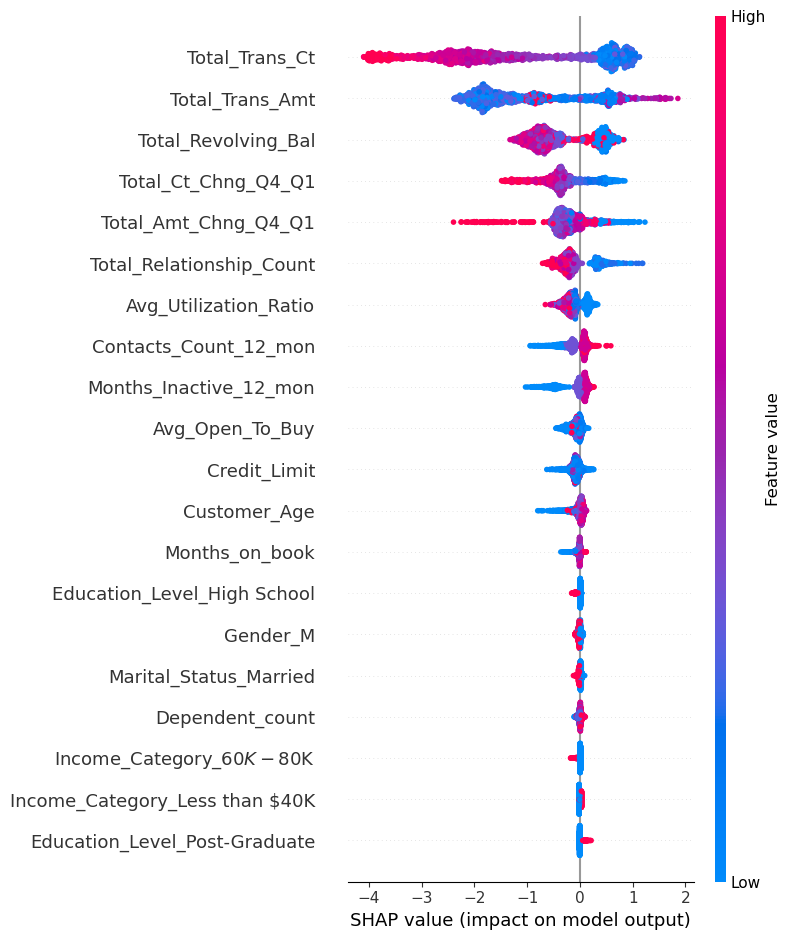

In [314]:
# Make plot.
shap.summary_plot(shap_values, X_val)

## Business insights


* The most important features to understand customer credit card churn, are
** Total Transaction Count, 
** Total Transaction Amount, 
** Total Revolving Balance, 
** Total Amount Change Q4 to Q1, 
** Total Count Change Q4 to Q1 and
** Total Relationship Count

* All of these features are negatively correlated with the Attrition Flag, meaning, the lower the values of these features, the higher the chances of a customer to attrite
 
* Bank should connect with the customer more often to increase the connect, and provide the customer with various offers and schemes to increase relationships of the customer with the bank
 
* Bank should offer cashback schemes on credit cards, which might encourage the customers on using the credit card more often

* Bank should also offer credit limit increase for the customers who are regularly using the credit card. This should increase the credit card spends/transaction amounts.
 
* 0% interest EMI on credit card is also another offer that can be provided to customers to encourage the customers buy products of higher cost with credit card, and convert the expenditure to EMI, so that total transaction amount as well as transaction counts would increase. The balance would also revolve nicely.

* Along with the available types of cards, bank can introduce credit cards specific to online shopping (with % cashback offers) or online food ordering. This way the card will be used more frequently.
 
* With our model, we can predict which customers are likely to attrite, and according to the predicted probability, at least top 20-30% customers can be reached out to discuss credit card offers, credit limit increase etc, to try retain those customers.
